In [93]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import normalize, MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

In [94]:
# define the data path and get all csv filenames using glob
data_path = "./archive/"
csv_files = glob.glob1(data_path, "*.csv")

In [95]:
# initial data csv files
csv_files

['audi.csv',
 'bmw.csv',
 'cclass.csv',
 'focus.csv',
 'ford.csv',
 'hyundi.csv',
 'merc.csv',
 'skoda.csv',
 'toyota.csv',
 'unclean cclass.csv',
 'unclean focus.csv',
 'vauxhall.csv',
 'vw.csv']

In [96]:
# these files are not relevant to our project
files_to_remove = ['cclass.csv',
                   'focus.csv',
                   'unclean cclass.csv',
                   'unclean focus.csv',]

In [97]:
# remove the files we don't want to consider
for filename in files_to_remove:
    csv_files.remove(filename)

In [98]:
csv_files

['audi.csv',
 'bmw.csv',
 'ford.csv',
 'hyundi.csv',
 'merc.csv',
 'skoda.csv',
 'toyota.csv',
 'vauxhall.csv',
 'vw.csv']

In [99]:
car_dataframes_dict = {}
for index, csv in enumerate(csv_files):
    
    if index == 0:
        car_dataframes_dict['all'] = pd.read_csv(os.path.join(data_path, csv))
        car_dataframes_dict['all']['manufacturer'] = csv.split('.')[0]
    
    temp_df = pd.read_csv(os.path.join(data_path, csv))
    if csv == 'hyundi.csv':
        temp_df.columns = ['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax', 'mpg', 'engineSize']
        
    car_dataframes_dict[csv.split('.')[0]] = temp_df
    car_dataframes_dict[csv.split('.')[0]]['manufacturer'] = csv.split('.')[0]
    
    if index != 0:
        car_dataframes_dict['all'] = pd.concat([car_dataframes_dict['all'], temp_df], axis=0)

In [100]:
car_dataframes_dict.keys()

dict_keys(['all', 'audi', 'bmw', 'ford', 'hyundi', 'merc', 'skoda', 'toyota', 'vauxhall', 'vw'])

In [101]:
def eda(car_dataframes_dict, manufacturer, options="head info describe pairplot heatmap"):
    print(f"EDA {manufacturer} ---------------------------------------------------------\n")
    
    print(f"EDA options: {options}\n\n")
    
    if 'head' in options:
        print(car_dataframes_dict[manufacturer].head())
        
    if 'info' in options:
        print(car_dataframes_dict[manufacturer].info())
    
    if 'describe' in options:    
        print(car_dataframes_dict[manufacturer].describe())
    
    if 'pairplot' in options:
        sns.pairplot(car_dataframes_dict[manufacturer])
        plt.show()
    
    if 'heatmap' in options:
        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})
        plt.show()
    print("------------------------------------------------------------------------\n\n")

In [106]:
def outlier_handling(car_dataframes_dict, manufacturer, options=""):
    print(f"Outlier Handling {manufacturer} ---------------------------------------------------------")
    
    if 'visualize' in options:
        # Boxplot to visualize outliers 
        for column in car_dataframes_dict[manufacturer].columns:
            if column not in ['transmission', 'fuelType', 'price', 'model', 'mpg', 'manufacturer', 'engineSize']:
                print(column)
                sns.boxplot(data=car_dataframes_dict[manufacturer][column])
                plt.show()
    
    # Using interquartile ranges to remove outliers
    for column in car_dataframes_dict[manufacturer].columns:
        if column not in ['transmission', 'fuelType', 'price', 'model', 'mpg', 'manufacturer', 'engineSize']:
#         if column not in ['transmission', 'fuelType', 'price', 'model', 'mpg', 'manufacturer']:
            Q1 = car_dataframes_dict[manufacturer][column].quantile(0.25)
            Q3 = car_dataframes_dict[manufacturer][column].quantile(0.75)
            IQR = Q3 - Q1

            print(column, Q1, Q3, IQR)
            car_dataframes_dict[manufacturer] = car_dataframes_dict[manufacturer][~((car_dataframes_dict[manufacturer][column] < (Q1 - 1.5 * IQR)) | (car_dataframes_dict[manufacturer][column] > (Q3 + 1.5 * IQR)))]
    print("------------------------------------------------------------------------")

In [107]:
def one_hot_encoding(car_dataframes_dict, manufacturer):
#     print(f"One-Hot Encoding {manufacturer} ---------------------------------------------------------")
    
#     for column in car_dataframes_dict[manufacturer].columns:
#         print(f"Column: {column}\nValues: {car_dataframes_dict[manufacturer][column].unique()}\nCount:{car_dataframes_dict[manufacturer][column].nunique()}\n")
    
    # can't use model since too many unique values, other categorical columns can be one hot encoded
    car_df_one_hot_encoded = pd.get_dummies(car_dataframes_dict[manufacturer], columns=['transmission', 'fuelType'])
    car_df_one_hot_encoded = car_df_one_hot_encoded.drop('model', axis=1)
#     print(car_df_one_hot_encoded.head())
    return car_df_one_hot_encoded

EDA all ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


   model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0     A1  2017  12500       Manual    15735   Petrol  150  55.4         1.4   
3     A4  2017  16800    Automatic    25952   Diesel  145  67.3         2.0   
4     A3  2019  17300       Manual     1998   Petrol  145  49.6         1.0   
10    A3  2017  16100       Manual    28955   Petrol  145  58.9         1.4   
11    A6  2016  16500    Automatic    52198   Diesel  125  57.6         2.0   

   manufacturer  
0          audi  
3          audi  
4          audi  
10         audi  
11         audi  
<class 'pandas.core.frame.DataFrame'>
Int64Index: 68367 entries, 0 to 15150
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         68367 non-null  object 
 1   year          68367 non-null  int64  
 2   price        

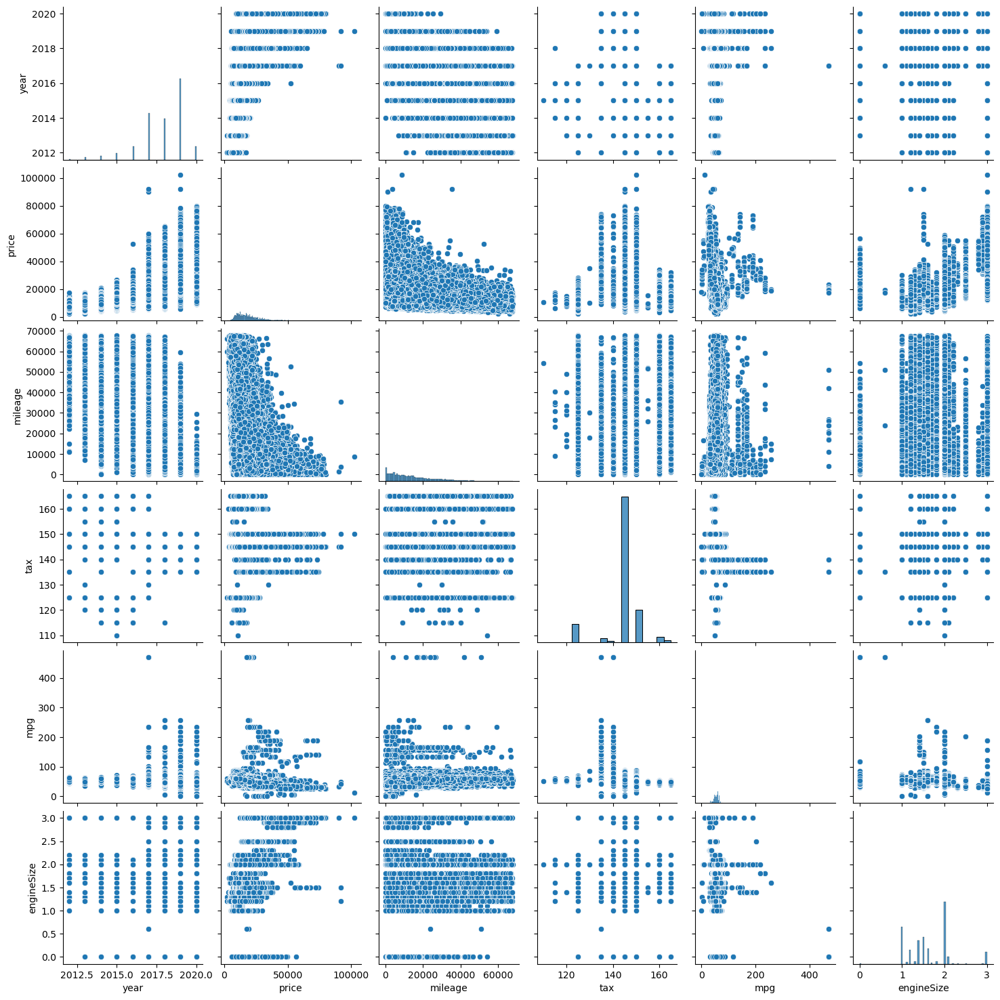

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


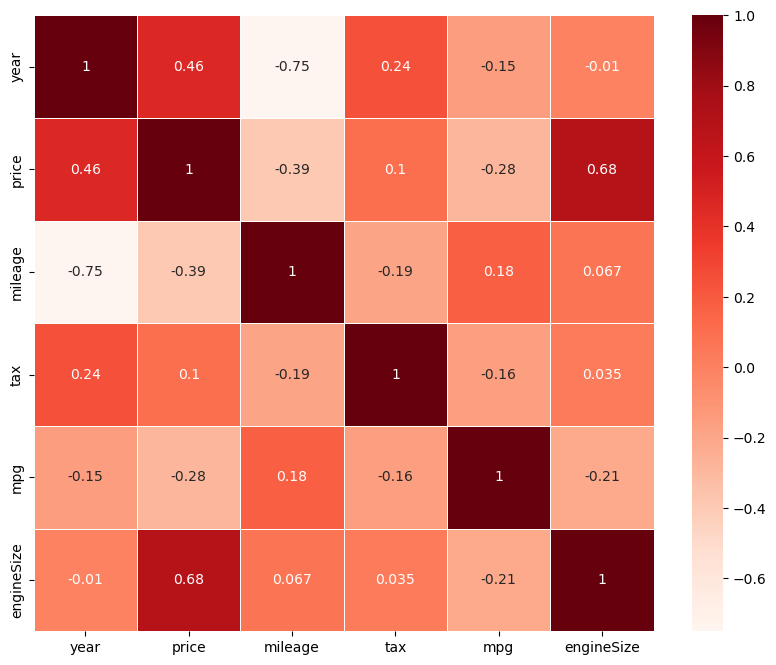

------------------------------------------------------------------------


Outlier Handling all ---------------------------------------------------------
year 2017.0 2019.0 2.0
mileage 5000.0 21766.25 16766.25
tax 145.0 145.0 0.0
engineSize 1.2 2.0 0.8
------------------------------------------------------------------------
EDA audi ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


  model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0    A1  2017  12500       Manual    15735   Petrol  150  55.4         1.4   
1    A6  2016  16500    Automatic    36203   Diesel   20  64.2         2.0   
2    A1  2016  11000       Manual    29946   Petrol   30  55.4         1.4   
3    A4  2017  16800    Automatic    25952   Diesel  145  67.3         2.0   
4    A3  2019  17300       Manual     1998   Petrol  145  49.6         1.0   

  manufacturer  
0         audi  
1         audi  
2         audi  
3         audi  
4

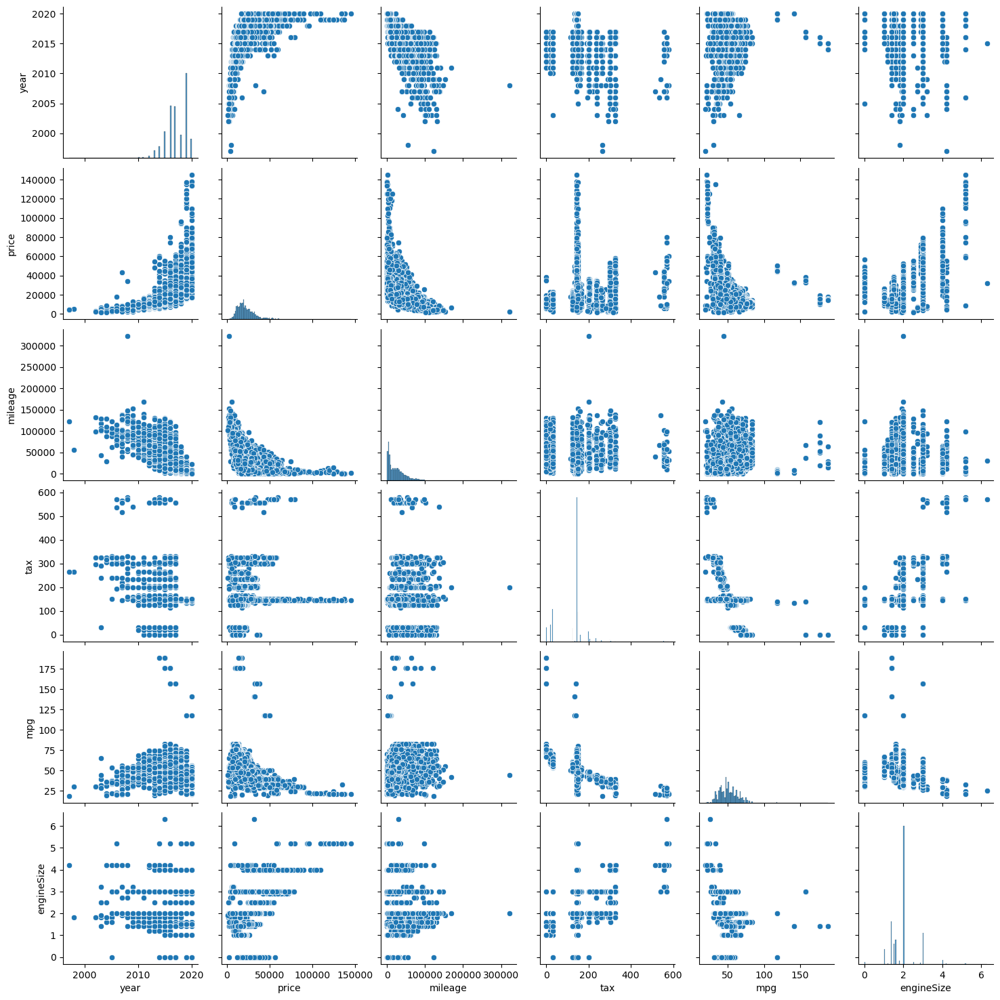

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


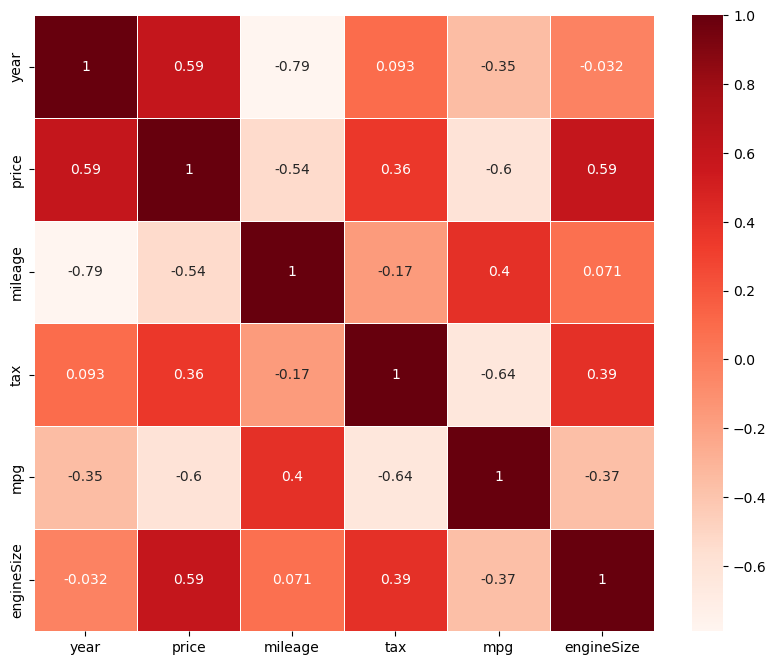

------------------------------------------------------------------------


Outlier Handling audi ---------------------------------------------------------
year


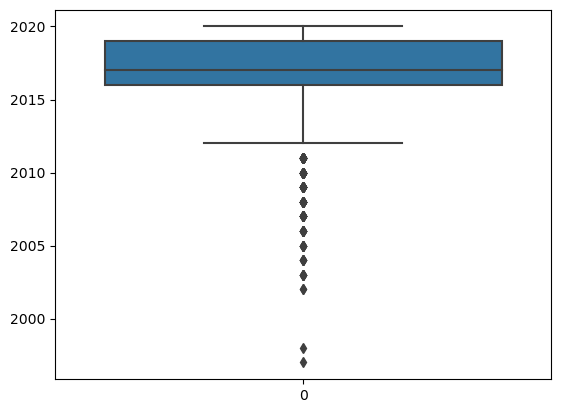

mileage


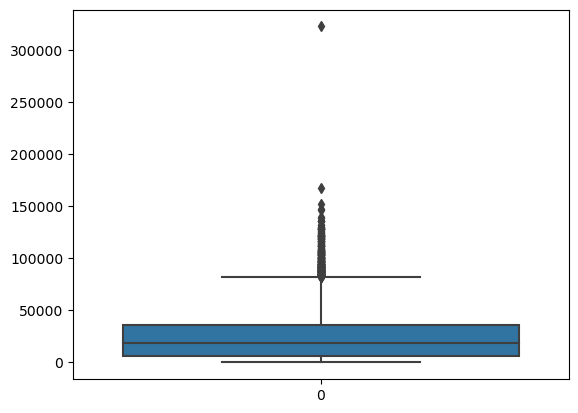

tax


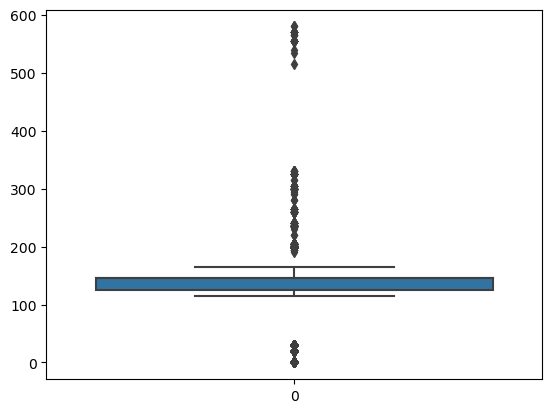

year 2016.0 2019.0 3.0
mileage 5799.0 35424.5 29625.5
tax 125.0 145.0 20.0
engineSize 1.5 2.0 0.5
------------------------------------------------------------------------
EDA bmw ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


       model  year  price transmission  mileage fuelType  tax   mpg  \
0   5 Series  2014  11200    Automatic    67068   Diesel  125  57.6   
1   6 Series  2018  27000    Automatic    14827   Petrol  145  42.8   
2   5 Series  2016  16000    Automatic    62794   Diesel  160  51.4   
3   1 Series  2017  12750    Automatic    26676   Diesel  145  72.4   
4   7 Series  2014  14500    Automatic    39554   Diesel  160  50.4   

   engineSize manufacturer  
0         2.0          bmw  
1         2.0          bmw  
2         3.0          bmw  
3         1.5          bmw  
4         3.0          bmw  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10781 entries, 0 to 10780
Data columns (total 10 columns):
 

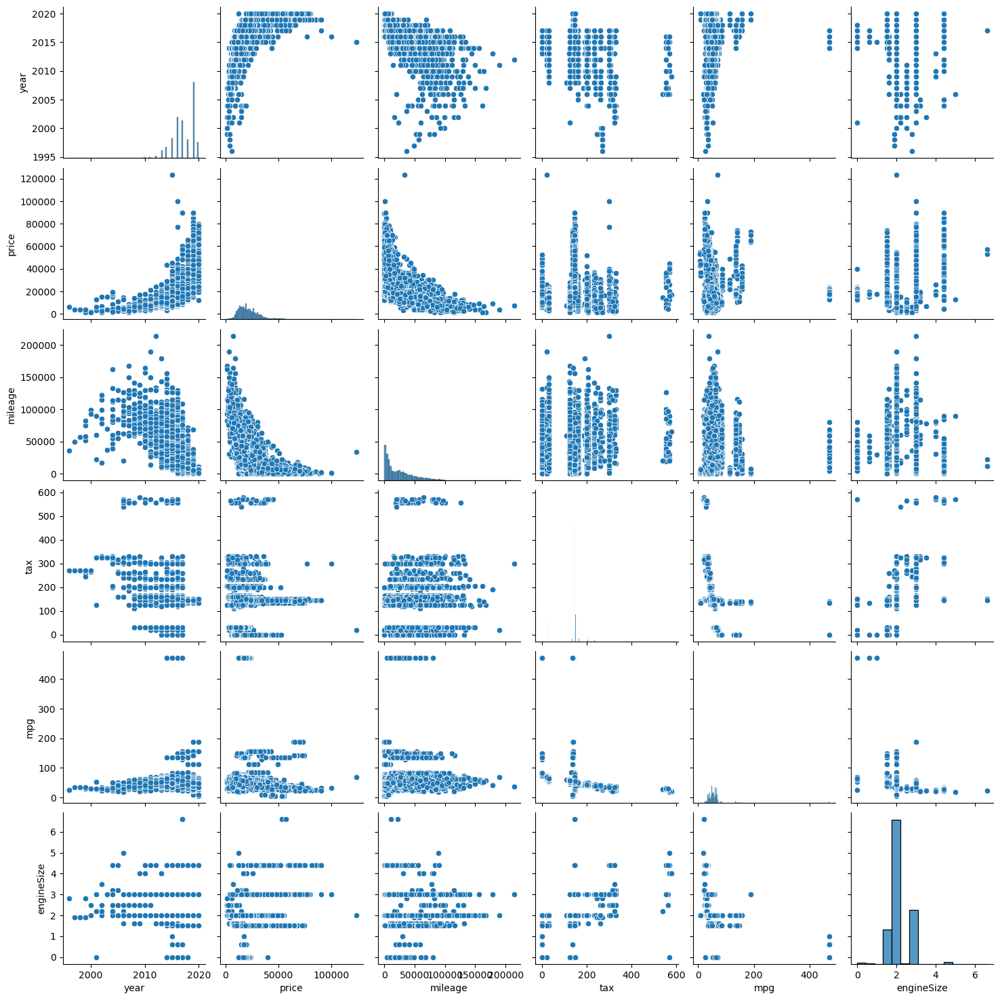

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


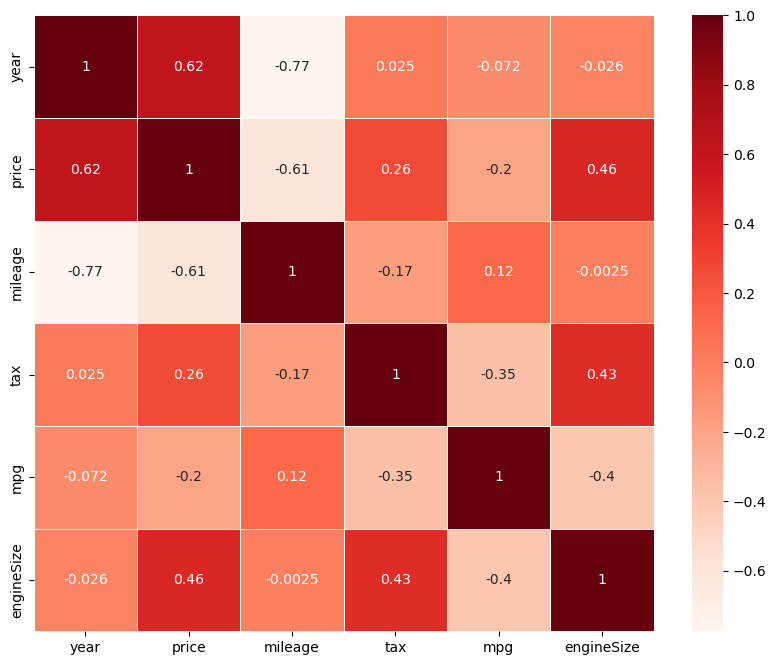

------------------------------------------------------------------------


Outlier Handling bmw ---------------------------------------------------------
year


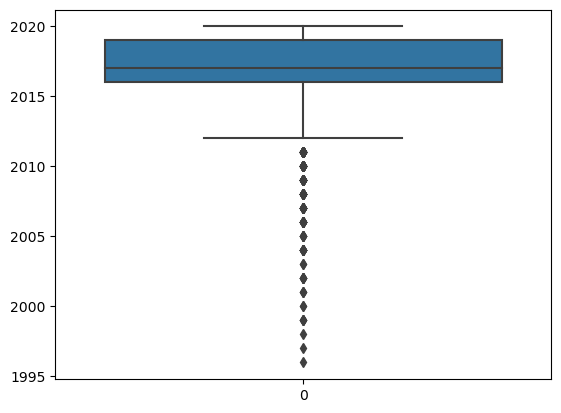

mileage


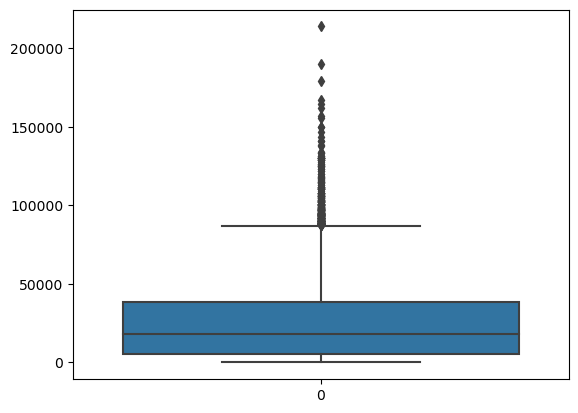

tax


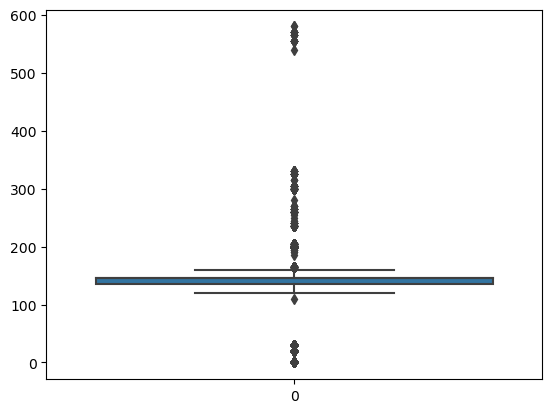

year 2016.0 2019.0 3.0
mileage 5441.0 36794.0 31353.0
tax 140.0 145.0 5.0
engineSize 2.0 2.0 0.0
------------------------------------------------------------------------
EDA ford ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


     model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0   Fiesta  2017  12000    Automatic    15944   Petrol  150  57.7         1.0   
1    Focus  2018  14000       Manual     9083   Petrol  150  57.7         1.0   
2    Focus  2017  13000       Manual    12456   Petrol  150  57.7         1.0   
3   Fiesta  2019  17500       Manual    10460   Petrol  145  40.3         1.5   
4   Fiesta  2019  16500    Automatic     1482   Petrol  145  48.7         1.0   

  manufacturer  
0         ford  
1         ford  
2         ford  
3         ford  
4         ford  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17965 entries, 0 to 17964
Data columns (total 10 columns):
 #   Column  

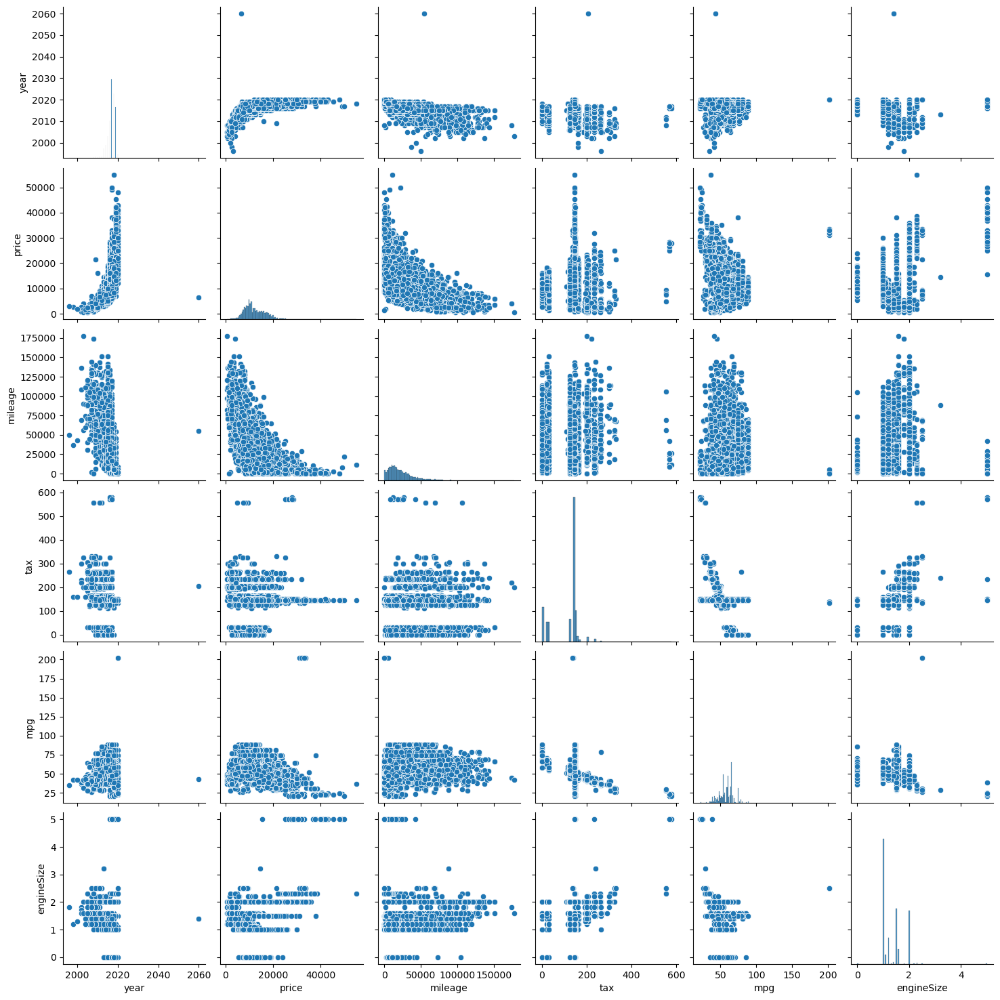

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


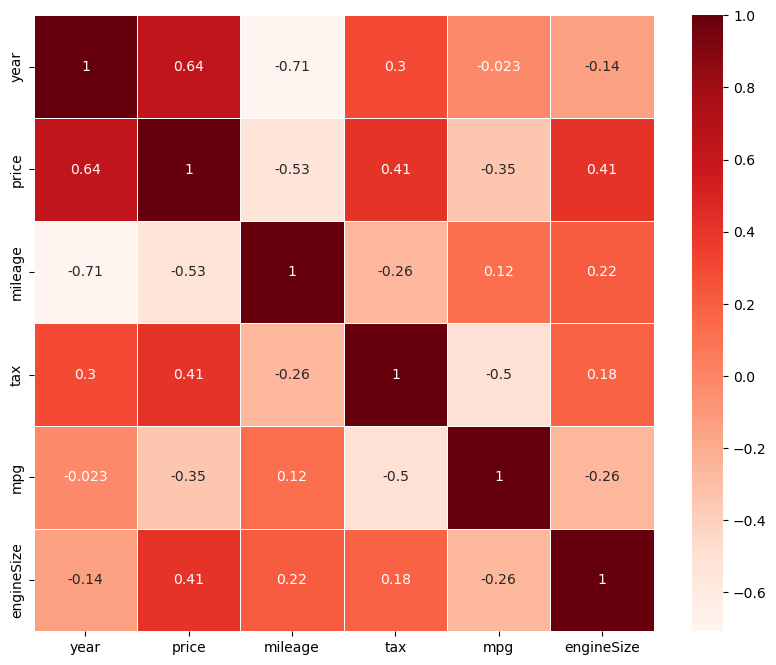

------------------------------------------------------------------------


Outlier Handling ford ---------------------------------------------------------
year


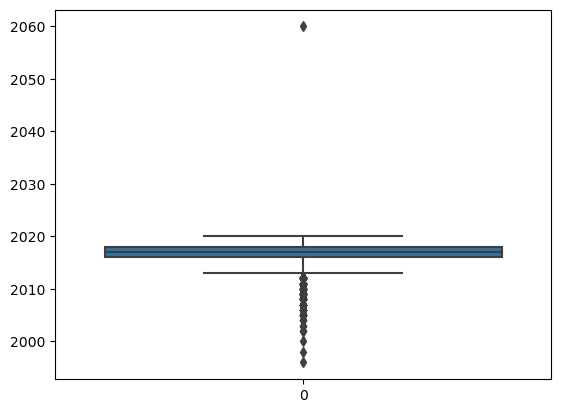

mileage


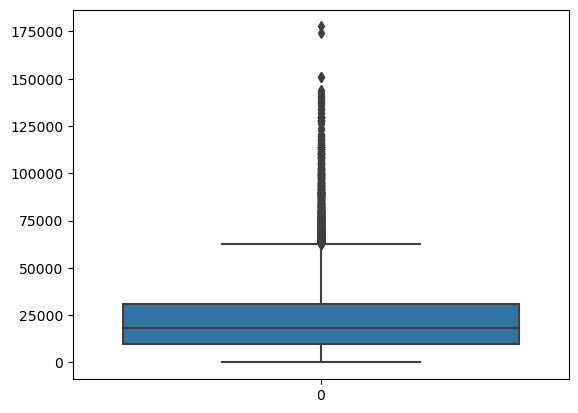

tax


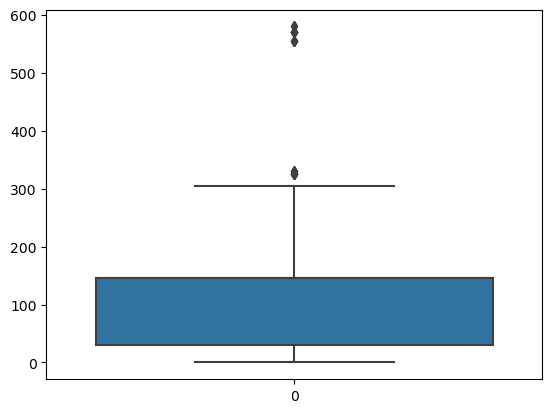

year 2016.0 2018.0 2.0
mileage 9805.0 29964.75 20159.75
tax 125.0 145.0 20.0
engineSize 1.0 1.6 0.6000000000000001
------------------------------------------------------------------------
EDA hyundi ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


     model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0      I20  2017   7999       Manual    17307   Petrol  145  58.9         1.2   
1   Tucson  2016  14499    Automatic    25233   Diesel  235  43.5         2.0   
2   Tucson  2016  11399       Manual    37877   Diesel   30  61.7         1.7   
3      I10  2016   6499       Manual    23789   Petrol   20  60.1         1.0   
4     IX35  2015  10199       Manual    33177   Diesel  160  51.4         2.0   

  manufacturer  
0       hyundi  
1       hyundi  
2       hyundi  
3       hyundi  
4       hyundi  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 10 colum

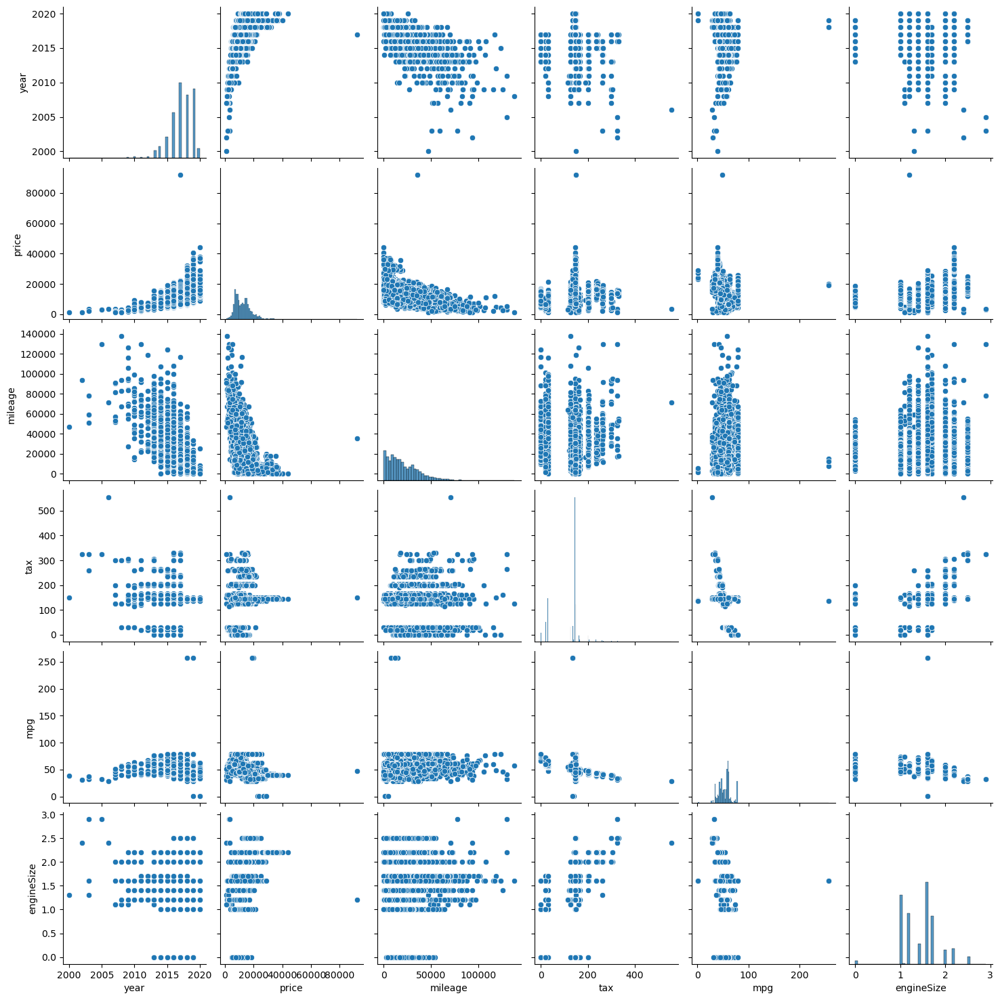

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


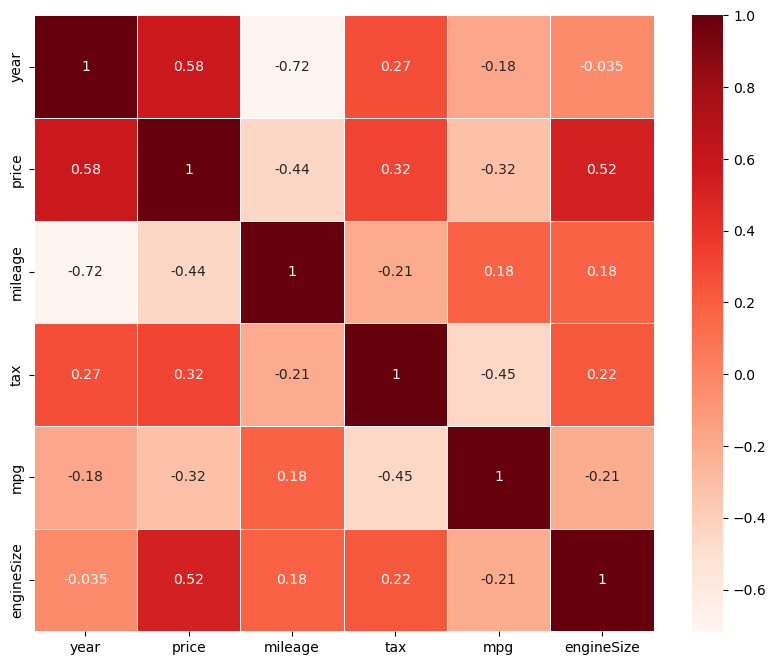

------------------------------------------------------------------------


Outlier Handling hyundi ---------------------------------------------------------
year


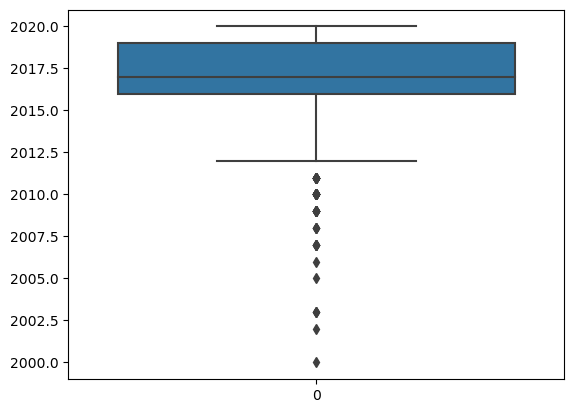

mileage


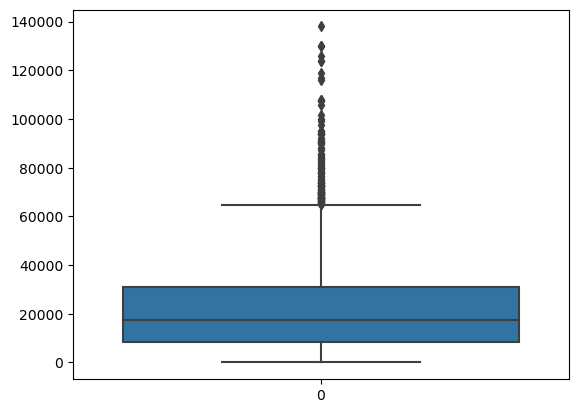

tax


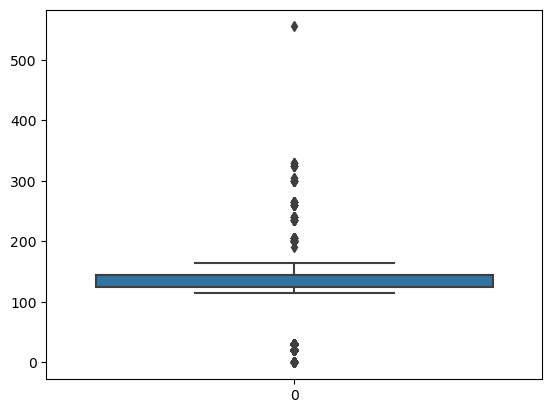

year 2016.0 2019.0 3.0
mileage 8210.0 30393.0 22183.0
tax 125.0 145.0 20.0
engineSize 1.0 1.6 0.6000000000000001
------------------------------------------------------------------------
EDA merc ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


       model  year  price transmission  mileage fuelType  tax   mpg  \
0        SLK  2005   5200    Automatic    63000   Petrol  325  32.1   
1    S Class  2017  34948    Automatic    27000   Hybrid   20  61.4   
2   SL CLASS  2016  49948    Automatic     6200   Petrol  555  28.0   
3    G Class  2016  61948    Automatic    16000   Petrol  325  30.4   
4    G Class  2016  73948    Automatic     4000   Petrol  325  30.1   

   engineSize manufacturer  
0         1.8         merc  
1         2.1         merc  
2         5.5         merc  
3         4.0         merc  
4         4.0         merc  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13119 entries, 0 to 13118
Data columns (tota

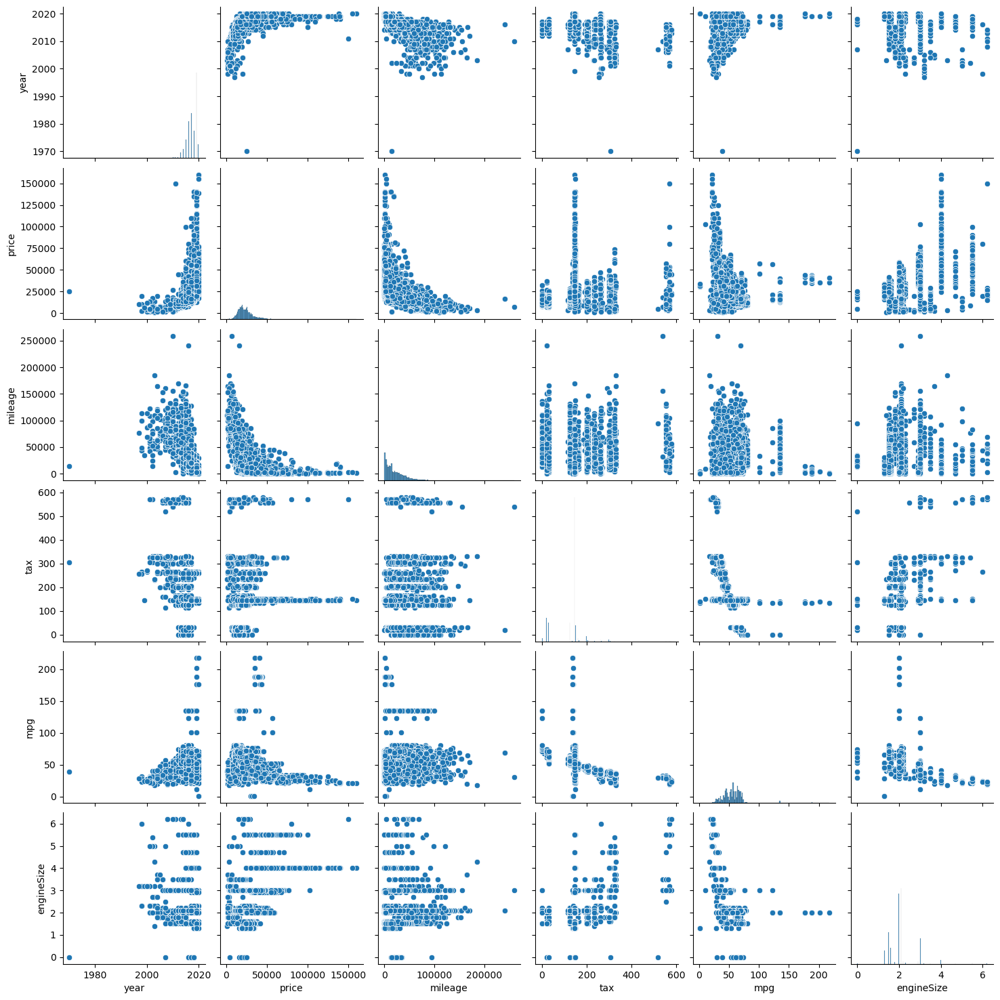

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


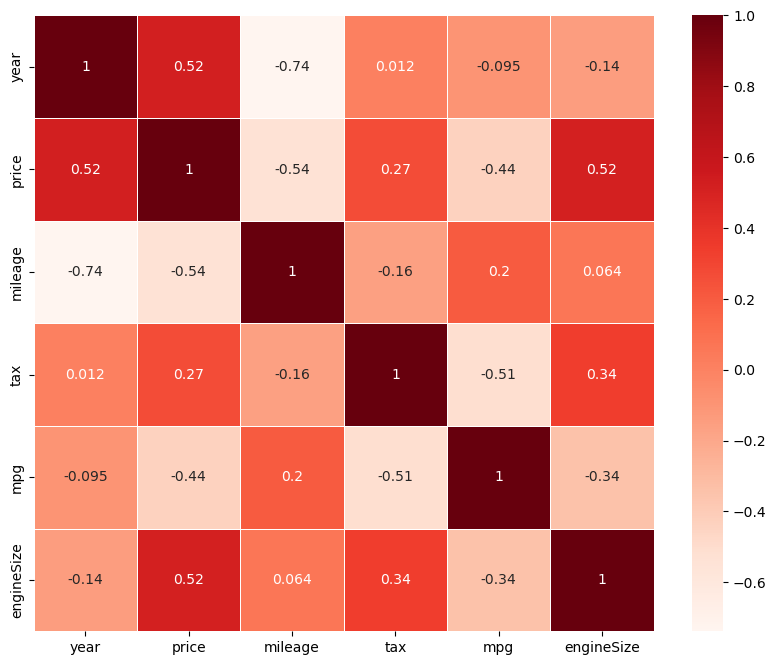

------------------------------------------------------------------------


Outlier Handling merc ---------------------------------------------------------
year


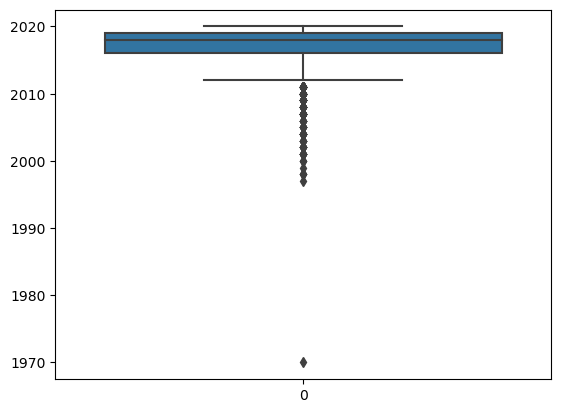

mileage


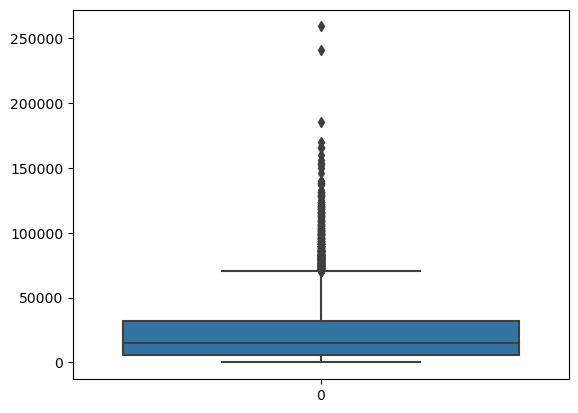

tax


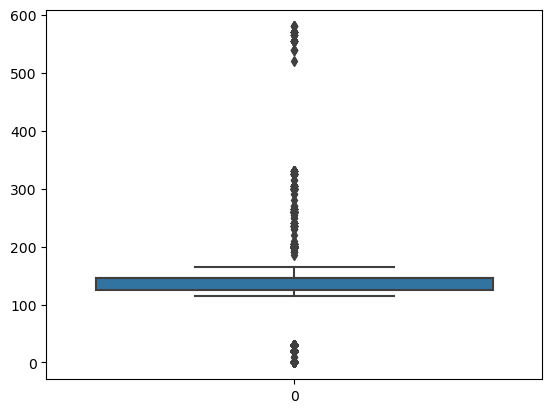

year 2016.0 2019.0 3.0
mileage 6000.0 30842.75 24842.75
tax 125.0 145.0 20.0
engineSize 1.6 2.1 0.5
------------------------------------------------------------------------
EDA skoda ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


           model  year  price transmission  mileage fuelType  tax   mpg  \
0        Octavia  2017  10550       Manual    25250   Petrol  150  54.3   
1         Citigo  2018   8200       Manual     1264   Petrol  145  67.3   
2        Octavia  2019  15650    Automatic     6825   Diesel  145  67.3   
3   Yeti Outdoor  2015  14000    Automatic    28431   Diesel  165  51.4   
4         Superb  2019  18350       Manual    10912   Petrol  150  40.9   

   engineSize manufacturer  
0         1.4        skoda  
1         1.0        skoda  
2         2.0        skoda  
3         2.0        skoda  
4         1.5        skoda  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6267 entries, 0 to 6266
Data col

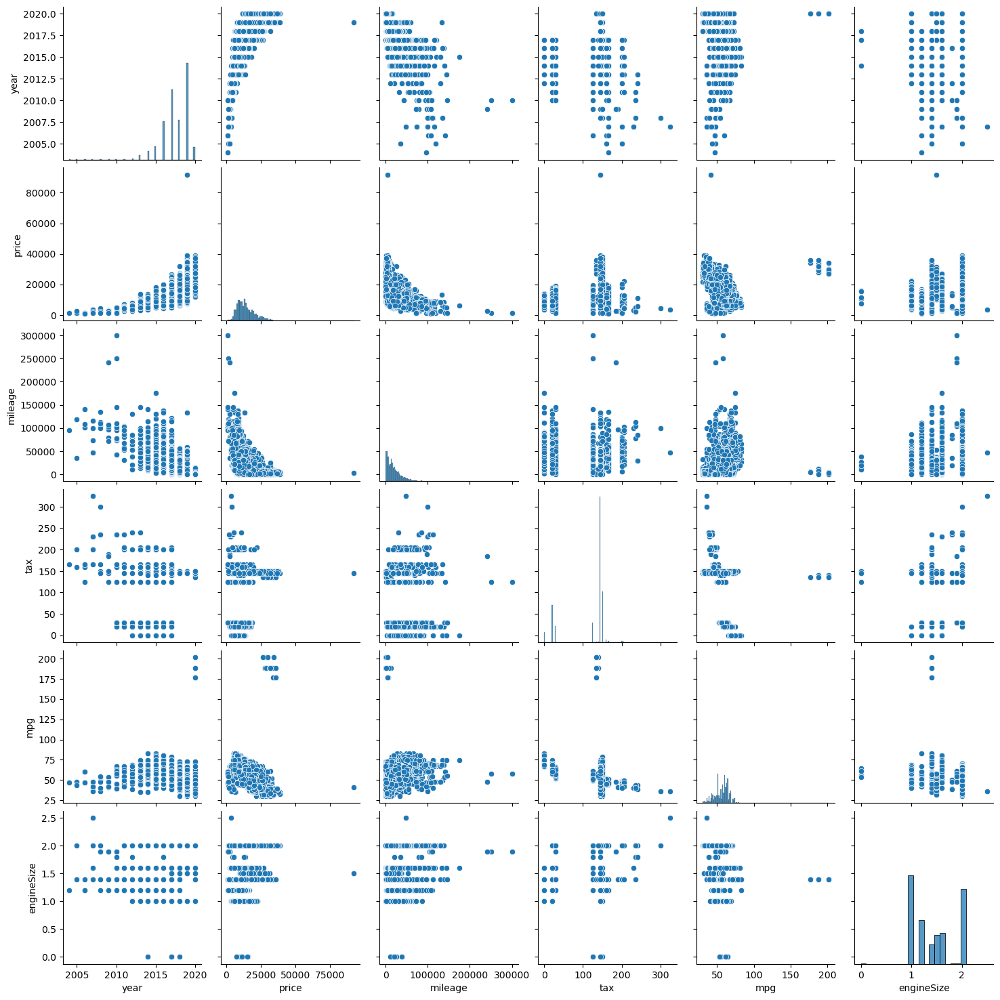

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


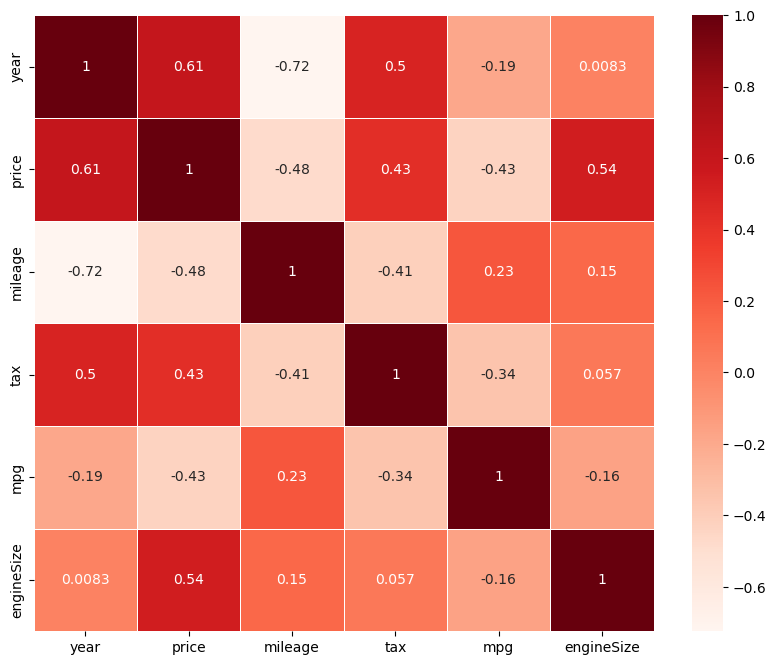

------------------------------------------------------------------------


Outlier Handling skoda ---------------------------------------------------------
year


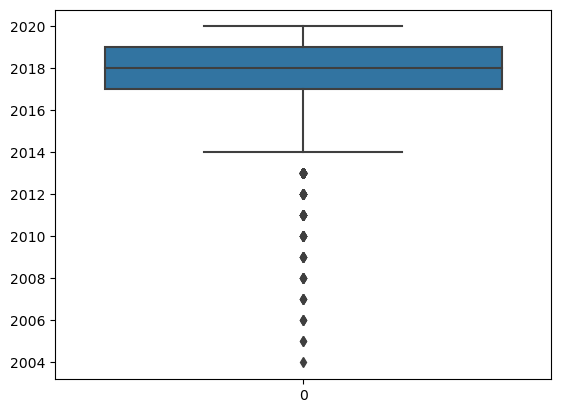

mileage


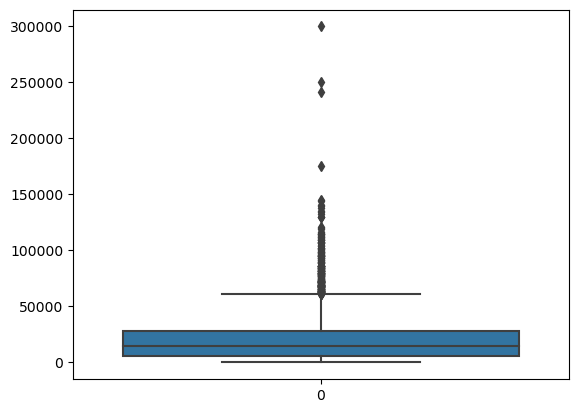

tax


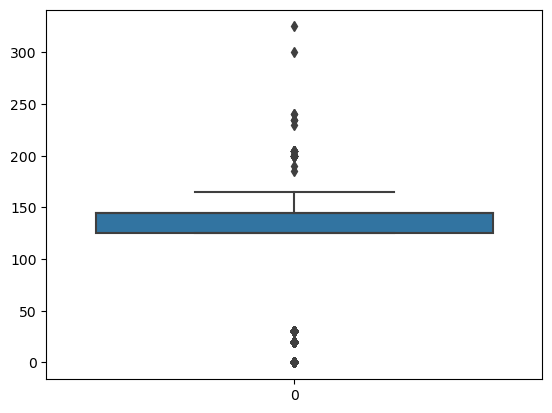

year 2017.0 2019.0 2.0
mileage 5605.5 26853.5 21248.0
tax 125.0 145.0 20.0
engineSize 1.0 2.0 1.0
------------------------------------------------------------------------
EDA toyota ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


   model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0   GT86  2016  16000       Manual    24089   Petrol  265  36.2         2.0   
1   GT86  2017  15995       Manual    18615   Petrol  145  36.2         2.0   
2   GT86  2015  13998       Manual    27469   Petrol  265  36.2         2.0   
3   GT86  2017  18998       Manual    14736   Petrol  150  36.2         2.0   
4   GT86  2017  17498       Manual    36284   Petrol  145  36.2         2.0   

  manufacturer  
0       toyota  
1       toyota  
2       toyota  
3       toyota  
4       toyota  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6738 entries, 0 to 6737
Data columns (total 10 columns):
 #   Column        Non-N

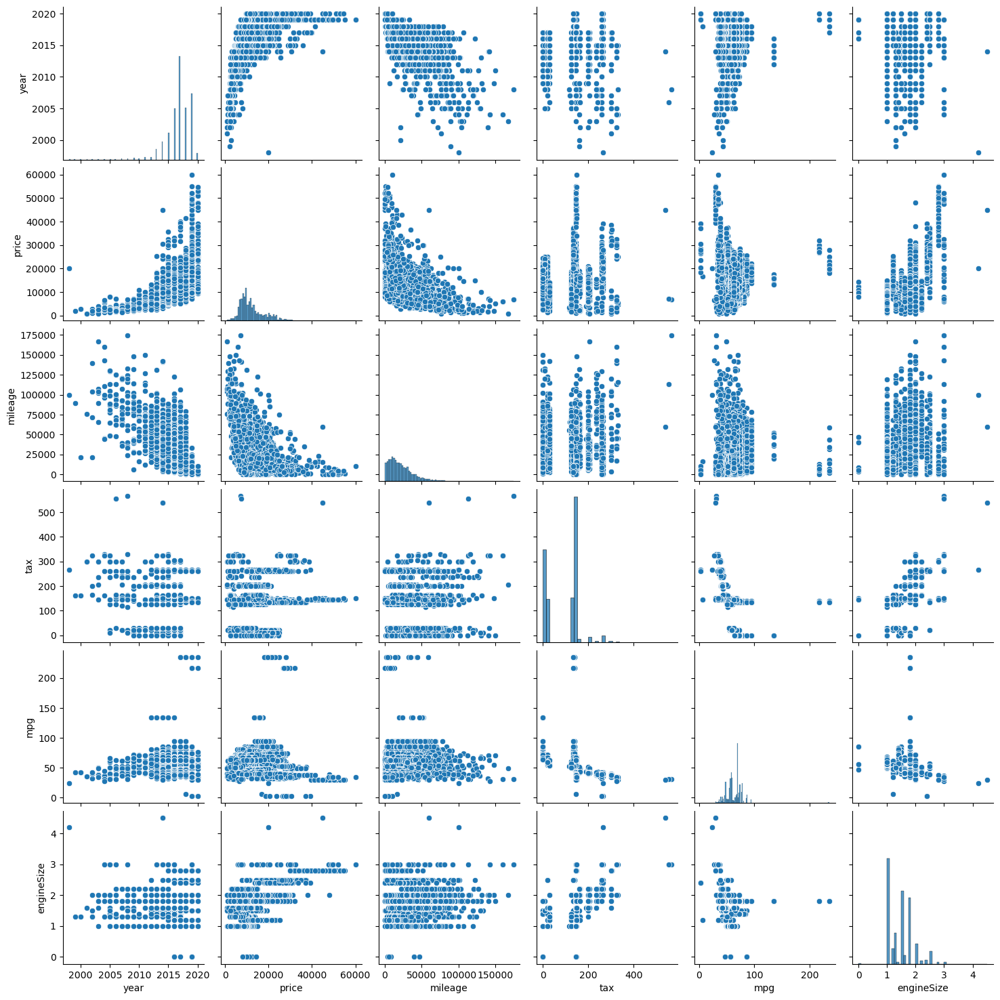

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


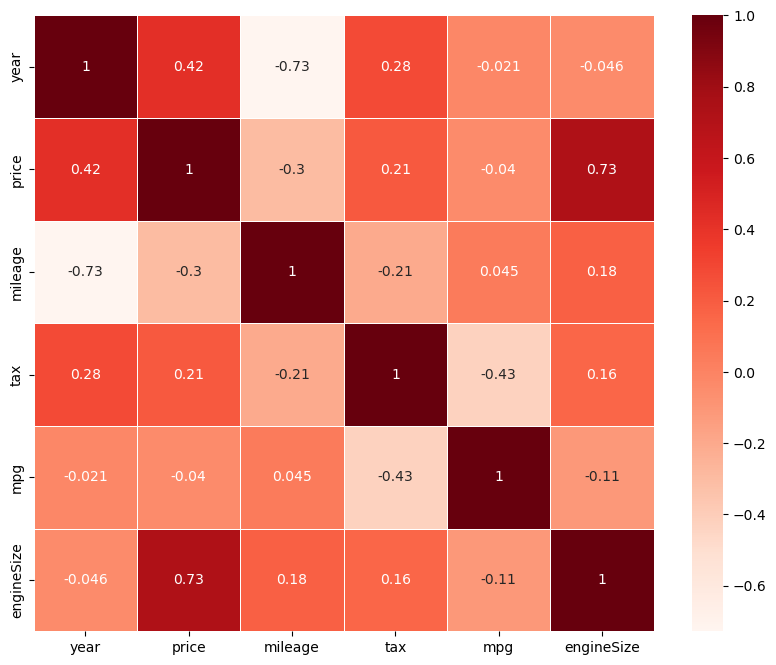

------------------------------------------------------------------------


Outlier Handling toyota ---------------------------------------------------------
year


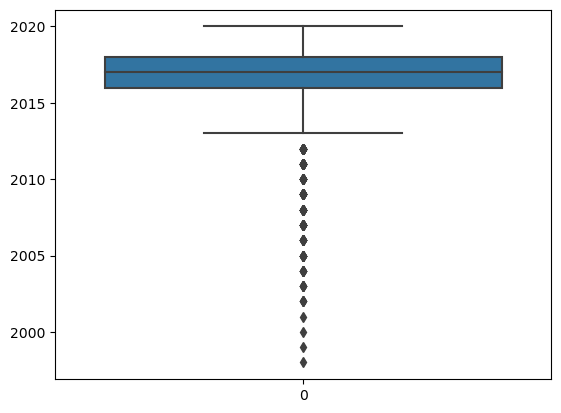

mileage


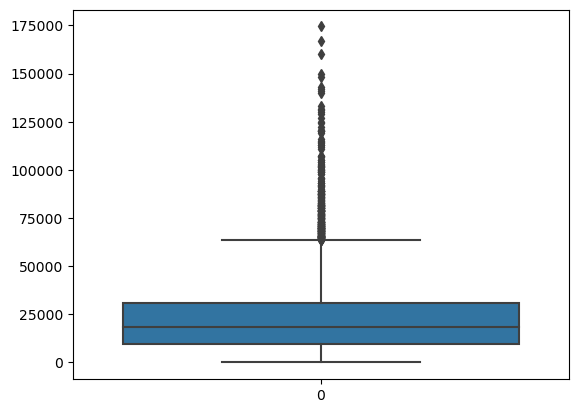

tax


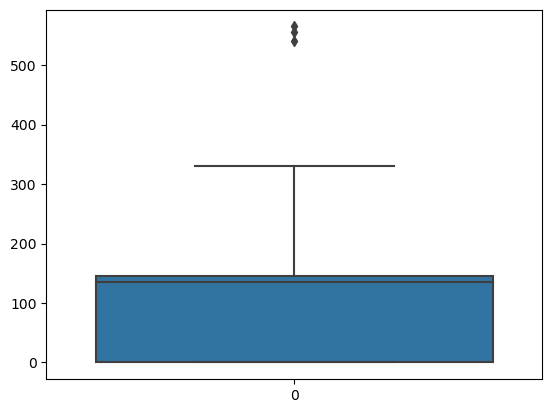

year 2016.0 2018.0 2.0
mileage 9205.0 29944.75 20739.75
tax 0.0 145.0 145.0
engineSize 1.0 1.8 0.8
------------------------------------------------------------------------
EDA vauxhall ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


    model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0   Corsa  2018   7885       Manual     9876   Petrol  145  55.4         1.4   
1   Corsa  2019  11995       Manual     2500   Petrol  145  54.3         1.4   
2   Corsa  2017   9777    Automatic     9625   Petrol  145  47.9         1.4   
3   Corsa  2016   8500       Manual    25796   Petrol   30  55.4         1.4   
4   Corsa  2019  10000       Manual     3887   Petrol  145  43.5         1.4   

  manufacturer  
0     vauxhall  
1     vauxhall  
2     vauxhall  
3     vauxhall  
4     vauxhall  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13632 entries, 0 to 13631
Data columns (total 10 columns):
 #   Column  

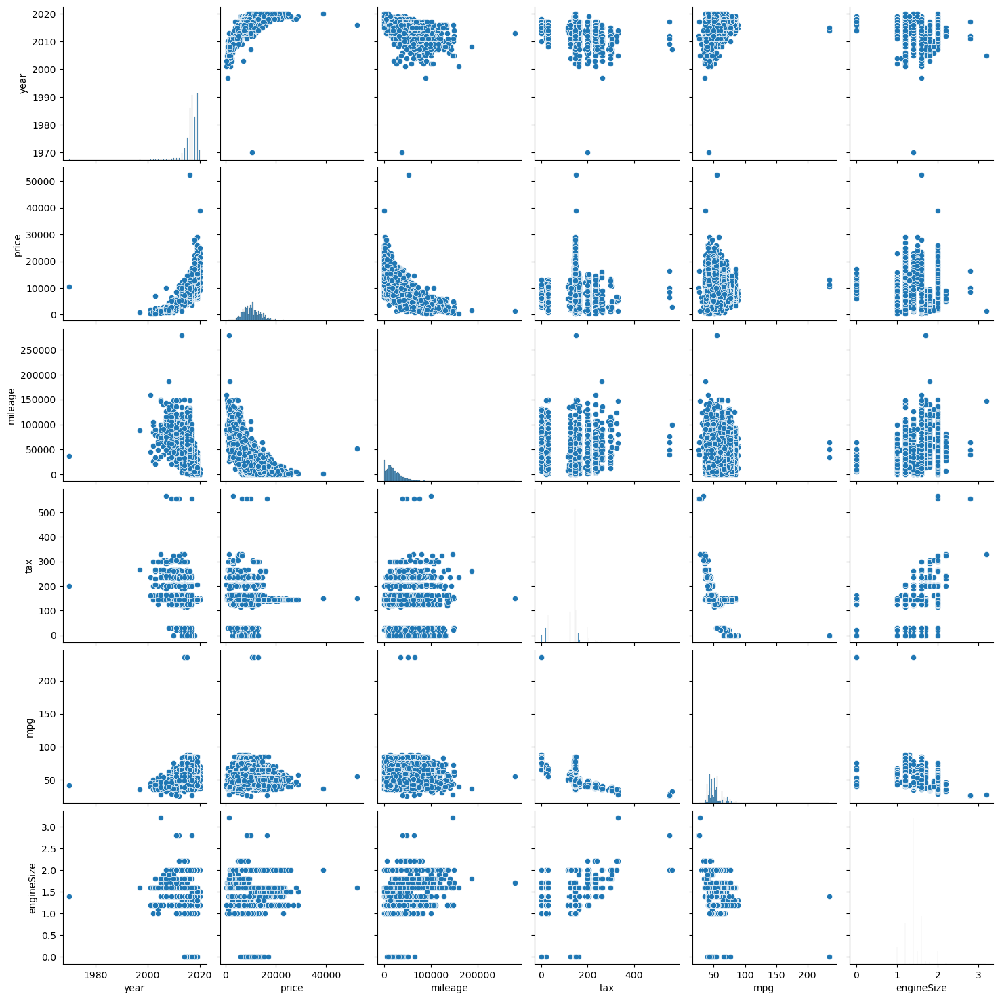

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


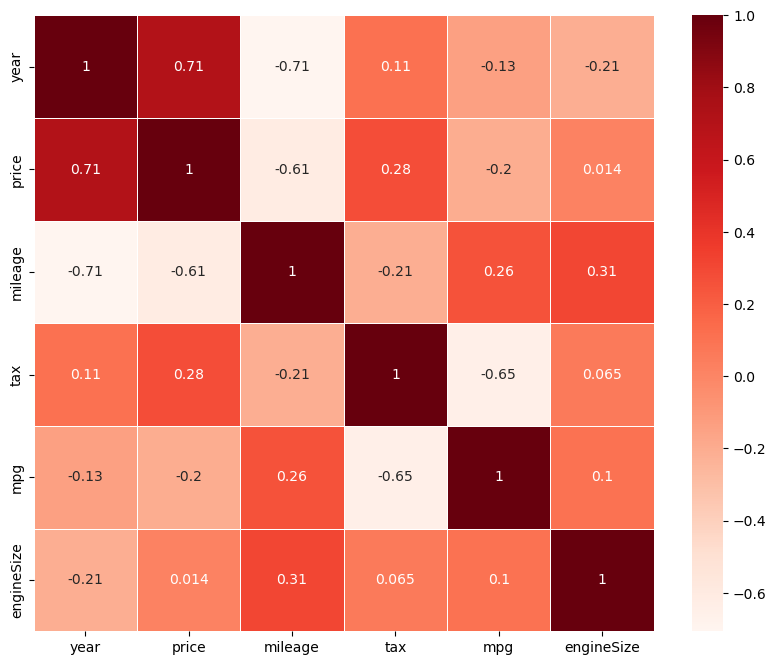

------------------------------------------------------------------------


Outlier Handling vauxhall ---------------------------------------------------------
year


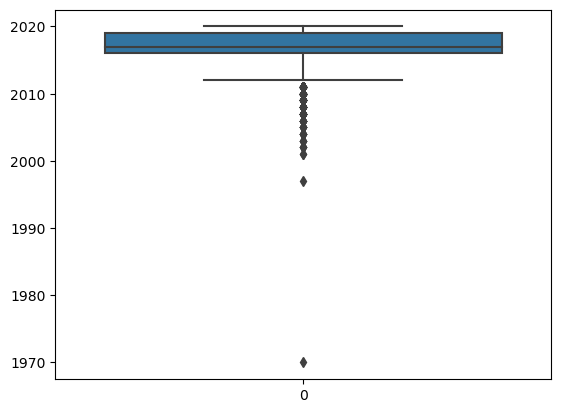

mileage


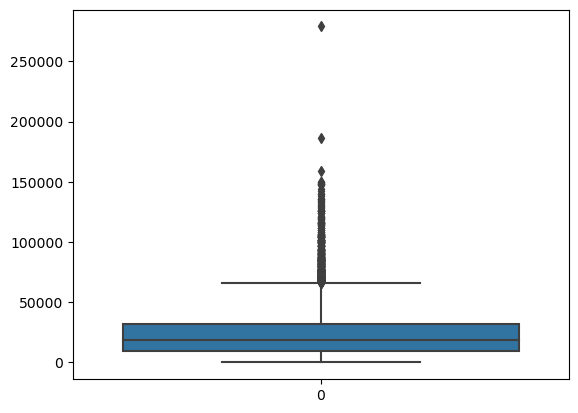

tax


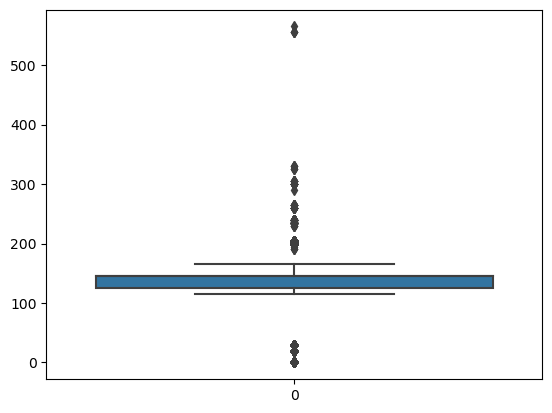

year 2016.0 2019.0 3.0
mileage 9526.0 31450.0 21924.0
tax 125.0 145.0 20.0
engineSize 1.4 1.4 0.0
------------------------------------------------------------------------
EDA vw ---------------------------------------------------------

EDA options: head info describe pairplot heatmap


    model  year  price transmission  mileage fuelType  tax   mpg  engineSize  \
0   T-Roc  2019  25000    Automatic    13904   Diesel  145  49.6         2.0   
1   T-Roc  2019  26883    Automatic     4562   Diesel  145  49.6         2.0   
2   T-Roc  2019  20000       Manual     7414   Diesel  145  50.4         2.0   
3   T-Roc  2019  33492    Automatic     4825   Petrol  145  32.5         2.0   
4   T-Roc  2019  22900    Semi-Auto     6500   Petrol  150  39.8         1.5   

  manufacturer  
0           vw  
1           vw  
2           vw  
3           vw  
4           vw  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15157 entries, 0 to 15156
Data columns (total 10 columns):
 #   Column        N

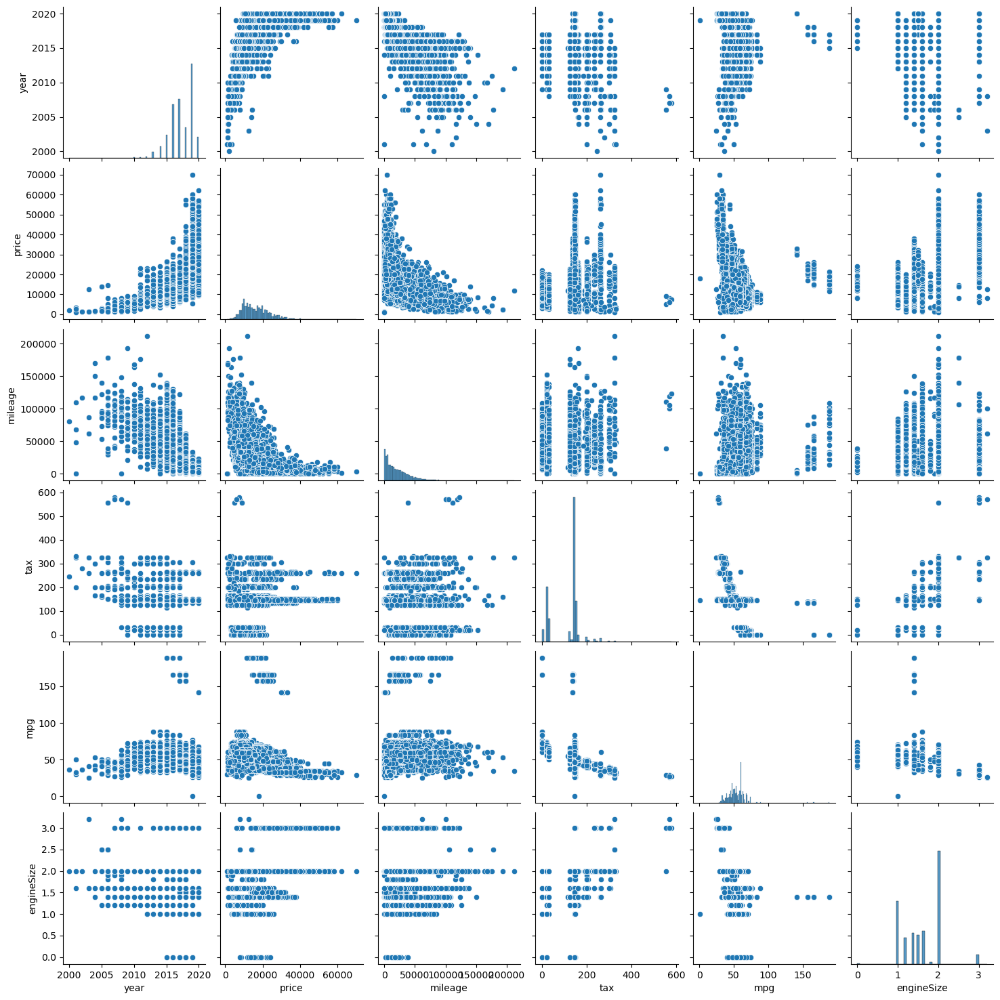

C:\Users\Hassaan\AppData\Local\Temp\ipykernel_3760\2223357391.py:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(data=car_dataframes_dict[manufacturer].corr(), annot=True, linewidths=.5, cmap="Reds", annot_kws={"size": 10})


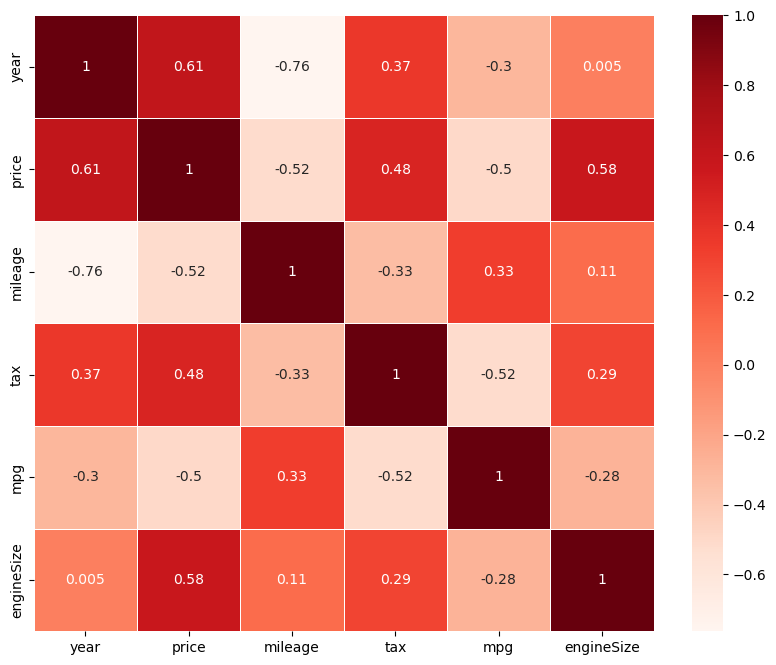

------------------------------------------------------------------------


Outlier Handling vw ---------------------------------------------------------
year


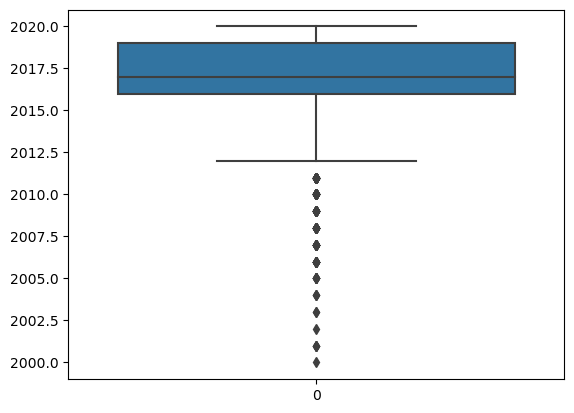

mileage


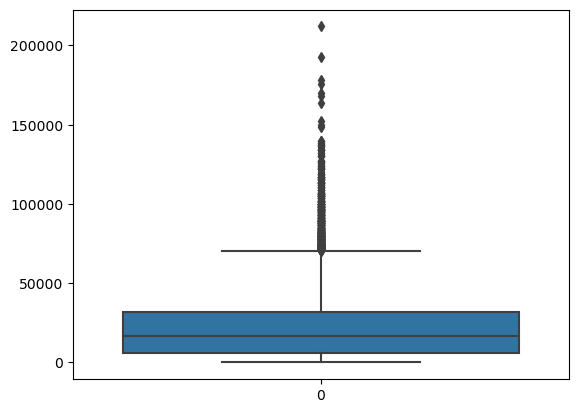

tax


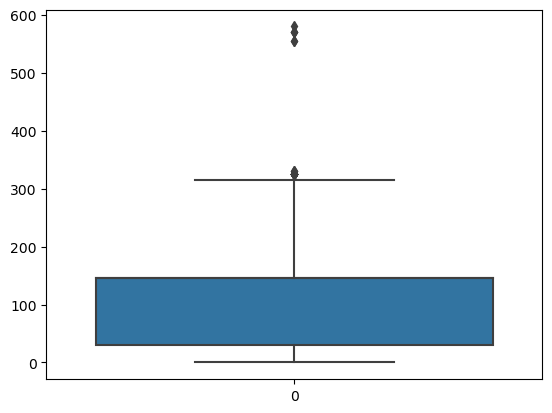

year 2016.0 2019.0 3.0
mileage 5807.0 31005.5 25198.5
tax 30.0 145.0 115.0
engineSize 1.2 2.0 0.8
------------------------------------------------------------------------


In [108]:
# one_hot_encoded_dataframes_dict = {}
for manufacturer in car_dataframes_dict.keys():
    eda(car_dataframes_dict, manufacturer, options="head info describe pairplot heatmap")
    
    if manufacturer == 'all':
        outlier_handling(car_dataframes_dict, manufacturer)
    else:
        outlier_handling(car_dataframes_dict, manufacturer, options='visualize')
        
#     one_hot_encoded_dataframes_dict[manufacturer] = one_hot_encoding(car_dataframes_dict, manufacturer)

In [109]:
def linear_regression_model(X_train, y_train):
    lr_car = LinearRegression()
    lr_car.fit(X_train, y_train)
    
    print(f"Coefficients: {lr_car.coef_}\nIntercept: {lr_car.intercept_}")
    
    sns.barplot(x=lr_car.coef_, y=X_train.columns)
    
    plt.xlabel('Coefficient')
    plt.ylabel('Features')
    plt.title('Linear Regression Coefficients')
    plt.show()
    
    return lr_car

In [110]:
def errors(y_test, car_price_predictions):
    error_dict = {
        "MAE": mean_absolute_error(y_true=y_test, y_pred=car_price_predictions),
        "MAPE": mean_absolute_percentage_error(y_true=y_test, y_pred=car_price_predictions),
        "1 - MAPE": 1 - mean_absolute_percentage_error(y_true=y_test, y_pred=car_price_predictions),
        "MSE": mean_squared_error(y_true=y_test, y_pred=car_price_predictions),
        "RMSE": np.sqrt(mean_squared_error(y_true=y_test, y_pred=car_price_predictions)),
        "R2": r2_score(y_true=y_test, y_pred=car_price_predictions)
    }
    return error_dict

In [113]:
def scaling(X_train, X_test, scaler="std"):
    # find numerical columns
    numerical_columns = []
    for column in X_train.columns:
        if X_train[column].dtype in ['int64', 'float64']:
            numerical_columns.append(column)
    
    
    if scaler == "std":
        standard_scaler = StandardScaler()
        scaled_data_train = standard_scaler.fit_transform(X_train[numerical_columns])
        scaled_df_train = pd.DataFrame(scaled_data_train, columns=standard_scaler.get_feature_names_out(numerical_columns))
        X_train = X_train.drop(numerical_columns, axis=1)
        X_train.reset_index(drop=True, inplace=True)
        X_train_scaled = pd.concat([X_train, scaled_df_train], axis=1)

        scaled_data_test = standard_scaler.transform(X_test[numerical_columns])
        scaled_df_test = pd.DataFrame(scaled_data_test, columns=standard_scaler.get_feature_names_out(numerical_columns))
        X_test = X_test.drop(numerical_columns, axis=1)
        X_test.reset_index(drop=True, inplace=True)
        X_test_scaled = pd.concat([X_test, scaled_df_test], axis=1)
    
    else:
        min_max_scaler = MinMaxScaler()
        scaled_data_train = min_max_scaler.fit_transform(X_train[numerical_columns])
        scaled_df_train = pd.DataFrame(scaled_data_train, columns=min_max_scaler.get_feature_names_out(numerical_columns))
        X_train = X_train.drop(numerical_columns, axis=1)
        X_train.reset_index(drop=True, inplace=True)
        X_train_scaled = pd.concat([X_train, scaled_df_train], axis=1)

        scaled_data_test = min_max_scaler.transform(X_test[numerical_columns])
        scaled_df_test = pd.DataFrame(scaled_data_test, columns=min_max_scaler.get_feature_names_out(numerical_columns))
        X_test = X_test.drop(numerical_columns, axis=1)
        X_test.reset_index(drop=True, inplace=True)
        X_test_scaled = pd.concat([X_test, scaled_df_test], axis=1)
    
    return X_train_scaled, X_test_scaled

In [114]:
def one_hot_encoding_sklearn(X_train, X_test):
    # OneHotEncoding
    encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')

    # find categorical columns
    categorical_columns = []
    for column in X_train.columns:
        if X_train[column].dtype not in ['int64', 'float64']:
            categorical_columns.append(column)

    # train data
    encoded_data_train = encoder.fit_transform(X_train[categorical_columns])
    encoded_df_train = pd.DataFrame(encoded_data_train, columns=encoder.get_feature_names_out(categorical_columns))
    X_train = X_train.drop(categorical_columns, axis=1)
    X_train.reset_index(drop=True, inplace=True)
    X_train_encoded = pd.concat([X_train, encoded_df_train], axis=1)

    # test data
    encoded_data_test = encoder.transform(X_test[categorical_columns])
    encoded_df_test = pd.DataFrame(encoded_data_test, columns=encoder.get_feature_names_out(categorical_columns))
    X_test = X_test.drop(categorical_columns, axis=1)
    X_test.reset_index(drop=True, inplace=True)
    X_test_encoded = pd.concat([X_test, encoded_df_test], axis=1)
    
    return X_train_encoded, X_test_encoded

In [115]:
def nn_model(X_train, y_train):
    model = MLPRegressor(max_iter=400)
    model.fit(X_train, y_train)
    
    return model

In [116]:
def svr_model(X_train, y_train):
    model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
    model.fit(X_train, y_train)
    
    return model

In [117]:
def rf_model(X_train, y_train):
    model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    model.fit(X_train, y_train)
    
    return model

# Linear Regression without improvements

Manufacturer all

Coefficients: [ 2.03895673e+03 -1.25498721e-01  2.38742359e-12 -1.53407218e+02
  9.86674711e+03  1.14123994e+03 -2.83455910e+03 -1.13686838e-13
  1.69331915e+03  4.35693605e+02  1.27896846e+03 -1.05642515e+03
 -6.58236914e+02]
Intercept: -4101043.1532008224


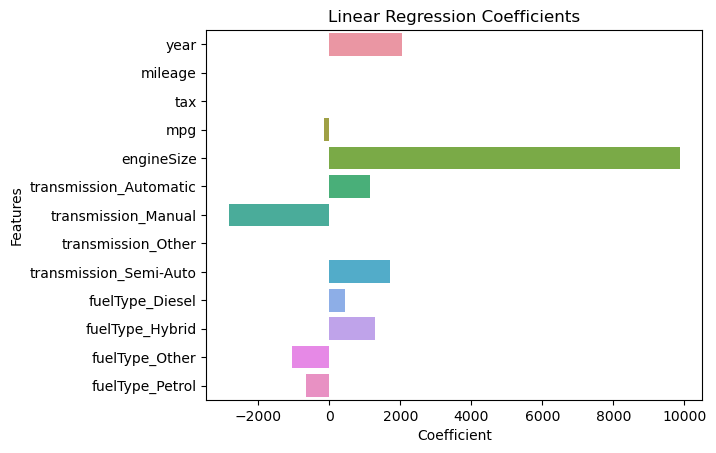

Error type: MAE. Value: 3567.5121885469894
Error type: MAPE. Value: 0.20329735795396436
Error type: 1 - MAPE. Value: 0.7967026420460357
Error type: MSE. Value: 23512382.258546118
Error type: RMSE. Value: 4848.956821683002
Error type: R2. Value: 0.7632073081233658




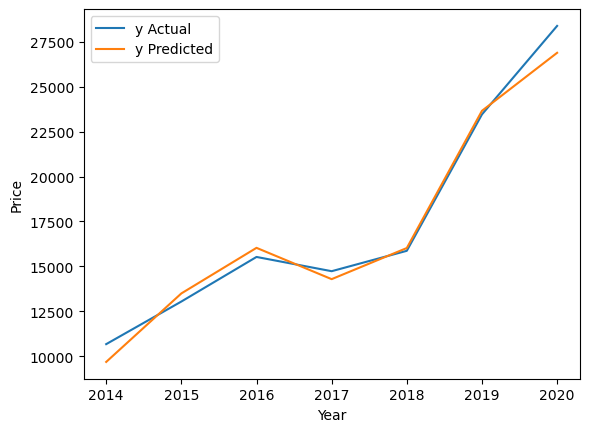

Manufacturer audi

Coefficients: [ 1.71979328e+03 -6.98502920e-02 -3.01117549e+01 -2.95263144e+02
  5.96339638e+03  6.40611786e+02 -1.43706211e+03  7.96450327e+02
 -1.17671426e+04  2.50329650e+04 -1.32658223e+04]
Intercept: -3425168.713196413


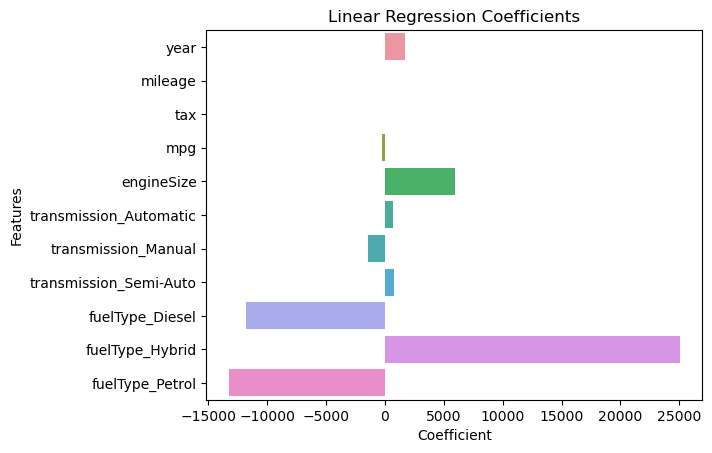

Error type: MAE. Value: 2411.8448047028915
Error type: MAPE. Value: 0.10716756775007576
Error type: 1 - MAPE. Value: 0.8928324322499243
Error type: MSE. Value: 9516204.793951254
Error type: RMSE. Value: 3084.834646127934
Error type: R2. Value: 0.8047986387860022




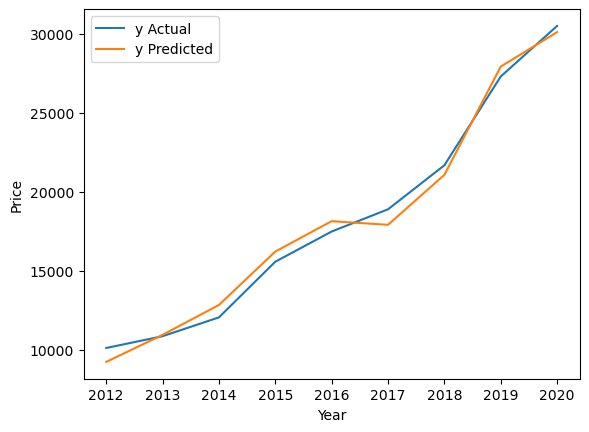

Manufacturer bmw

Coefficients: [ 2.09593480e+03 -1.13771602e-01 -2.90438148e+02 -1.14448604e+02
  9.09494702e-13  1.28939924e+03 -2.55801553e+03  1.26861629e+03
 -2.80009873e+03  4.69246612e+03  2.74239561e+03 -4.63476300e+03]
Intercept: -4153002.907523918


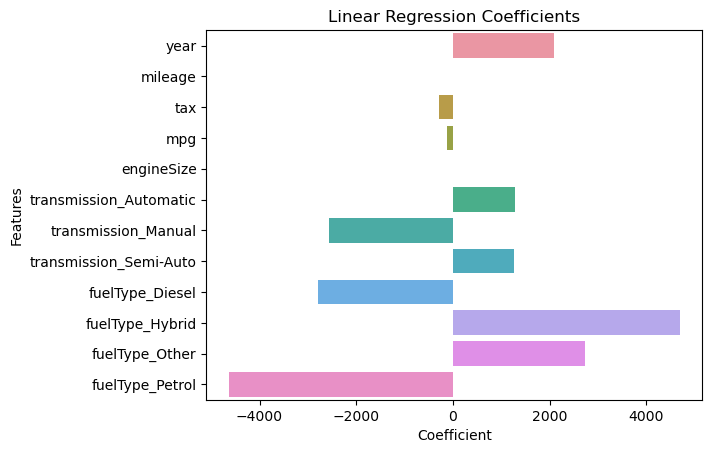

Error type: MAE. Value: 3083.799921175948
Error type: MAPE. Value: 0.1272307884063124
Error type: 1 - MAPE. Value: 0.8727692115936876
Error type: MSE. Value: 15648745.65759893
Error type: RMSE. Value: 3955.849549413998
Error type: R2. Value: 0.617723864473509




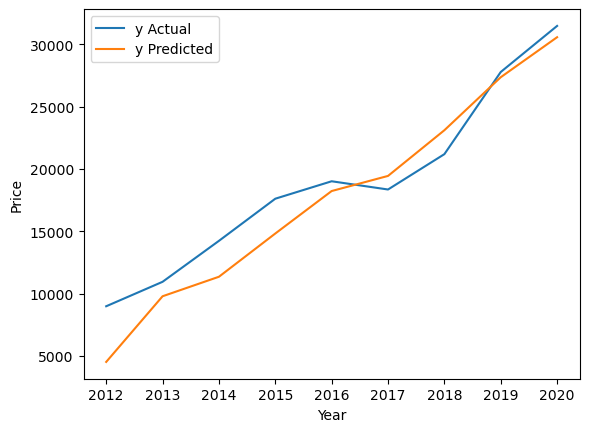

Manufacturer ford

Coefficients: [ 1.95757995e+03 -6.06023095e-02 -6.34954064e+00 -8.99011922e+01
  4.96768457e+03  4.35547878e+02 -7.08176459e+02  2.72628581e+02
 -8.19658528e+02  3.13415992e+03 -2.31450140e+03]
Intercept: -3933323.531785997


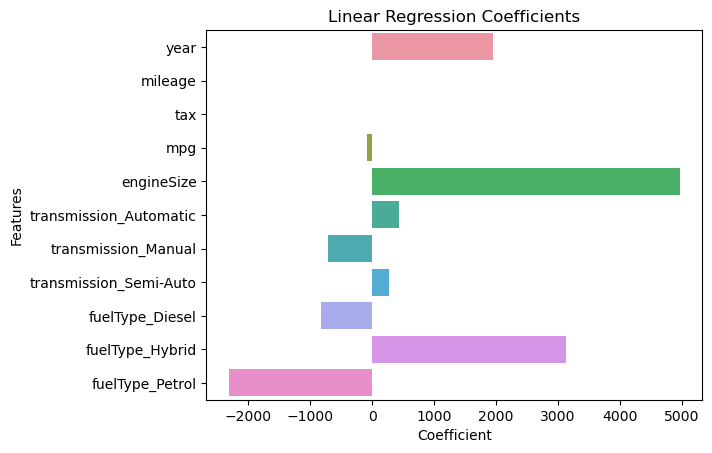

Error type: MAE. Value: 1731.7940629602024
Error type: MAPE. Value: 0.13641300956155117
Error type: 1 - MAPE. Value: 0.8635869904384488
Error type: MSE. Value: 5418634.312084669
Error type: RMSE. Value: 2327.7960202914405
Error type: R2. Value: 0.7009294268119074




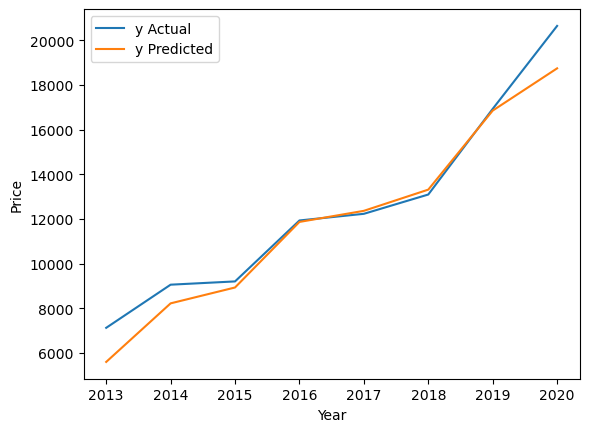

Manufacturer hyundi

Coefficients: [ 1.37969908e+03 -1.13099006e-01  1.22558086e+01 -1.01512724e+02
  6.57532892e+03 -1.33060081e+03 -2.15006884e+03  2.49635970e+03
  9.84309953e+02 -1.49801557e+03  2.00615226e+03  3.18448698e+03
 -3.69262367e+03]
Intercept: -2769988.2236254825


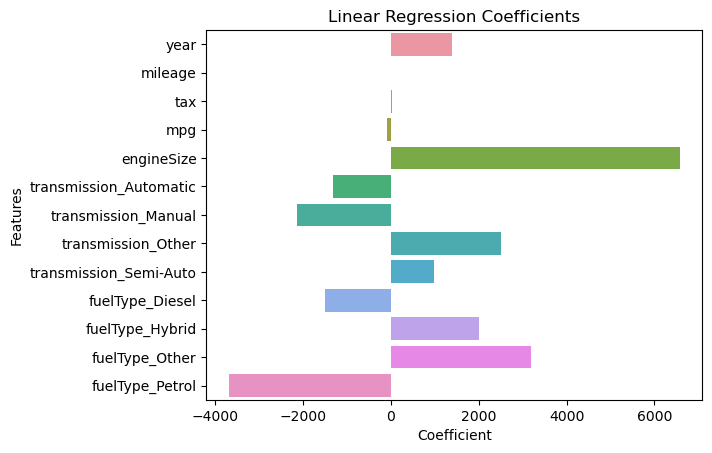

Error type: MAE. Value: 2092.4902307876787
Error type: MAPE. Value: 0.15887864883413144
Error type: 1 - MAPE. Value: 0.8411213511658686
Error type: MSE. Value: 7801142.078677025
Error type: RMSE. Value: 2793.0524661518666
Error type: R2. Value: 0.782305967033422




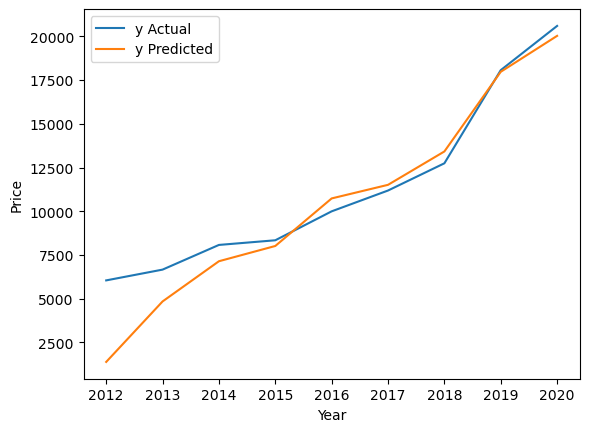

Manufacturer merc

Coefficients: [ 2.12552408e+03 -1.41669580e-01 -1.80049674e+01 -2.52574612e+02
  7.55451619e+03  1.02078560e+03 -2.16217530e+03  1.81898940e-12
  1.14138970e+03 -1.97428005e+04  1.29617165e+04  2.93051773e+04
 -2.25240934e+04]
Intercept: -4240622.8314850805


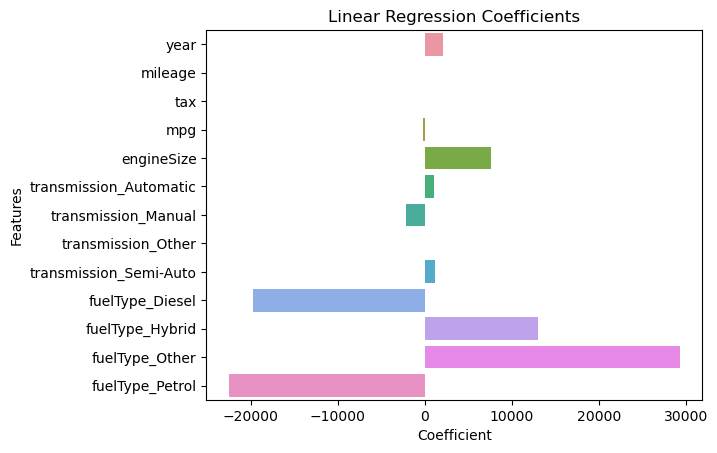

Error type: MAE. Value: 3143.9353830946934
Error type: MAPE. Value: 0.12953812174254753
Error type: 1 - MAPE. Value: 0.8704618782574525
Error type: MSE. Value: 19817666.01057568
Error type: RMSE. Value: 4451.7037199903225
Error type: R2. Value: 0.6391797645624483




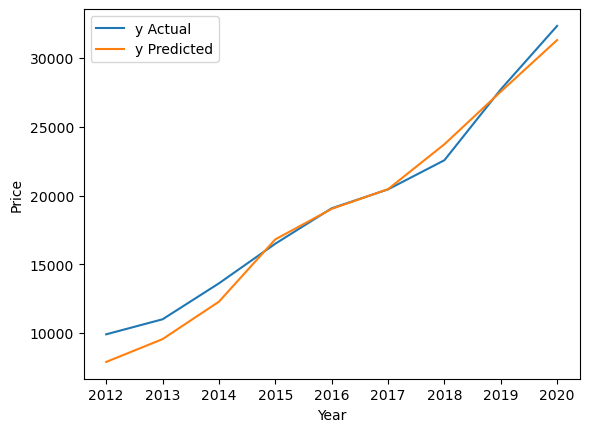

Manufacturer skoda

Coefficients: [ 1.15415434e+03 -6.43724506e-02 -7.58981427e+00 -3.20969401e+02
  4.15458917e+03  1.67374332e+03 -8.76596320e+02 -1.17867085e+03
  3.81523853e+02 -1.20112968e+04  4.23251665e+04 -1.53683473e+04
 -1.49455224e+04]
Intercept: -2285825.5130176065


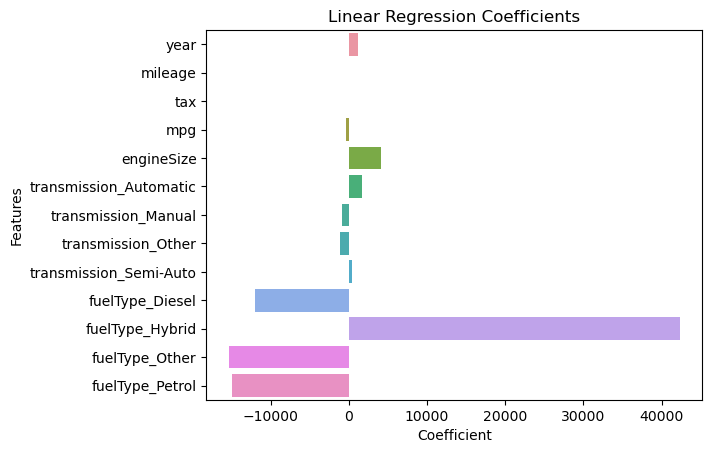

Error type: MAE. Value: 1734.9606544163983
Error type: MAPE. Value: 0.11643598470606706
Error type: 1 - MAPE. Value: 0.8835640152939329
Error type: MSE. Value: 5230892.566406786
Error type: RMSE. Value: 2287.114462900094
Error type: R2. Value: 0.865454895915585




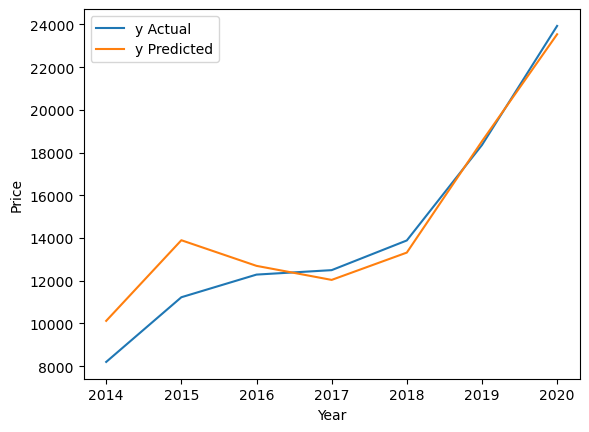

Manufacturer toyota

Coefficients: [ 1.17584448e+03 -6.64814978e-02 -2.28385852e+00 -8.21184101e+00
  9.78908151e+03  1.57745634e+02 -1.62880493e+03  2.37589472e+02
  1.23346982e+03 -5.78029624e+01  1.43778461e+02  8.30034183e+02
 -9.16009682e+02]
Intercept: -2369843.662049701


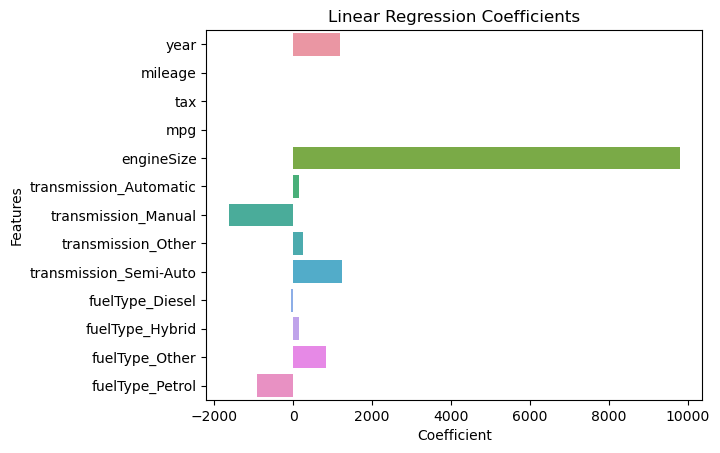

Error type: MAE. Value: 2051.7091199524666
Error type: MAPE. Value: 0.16228899043575726
Error type: 1 - MAPE. Value: 0.8377110095642427
Error type: MSE. Value: 8183788.760551917
Error type: RMSE. Value: 2860.7322070672603
Error type: R2. Value: 0.798982227790173




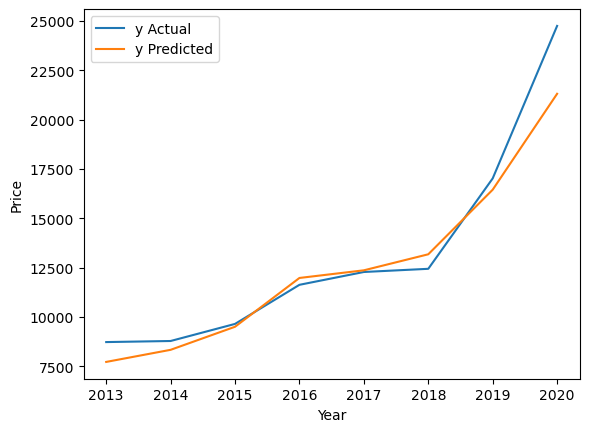

Manufacturer vauxhall

Coefficients: [ 6.64676345e+02 -2.64308198e-02 -1.58208030e+01 -1.65101749e+02
  2.27373675e-13 -5.90967036e+01 -1.20454077e+03  2.15791681e+02
  1.04784579e+03  0.00000000e+00]
Intercept: -1318928.4642041582


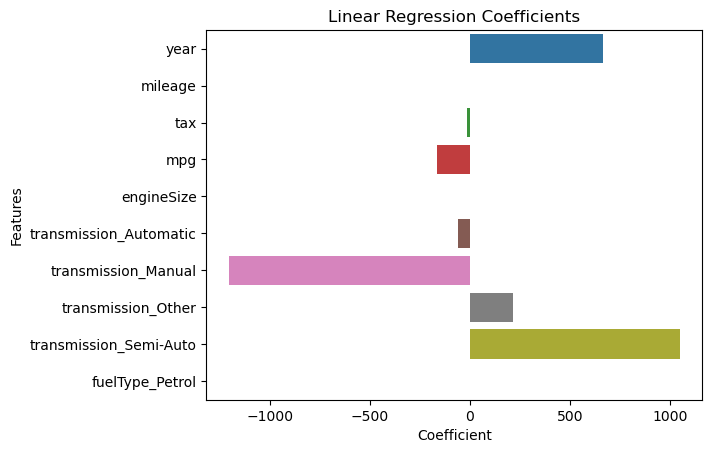

Error type: MAE. Value: 1316.2108021224055
Error type: MAPE. Value: 0.13113921424730185
Error type: 1 - MAPE. Value: 0.8688607857526982
Error type: MSE. Value: 2680749.8368033106
Error type: RMSE. Value: 1637.2995562215579
Error type: R2. Value: 0.561223318492976




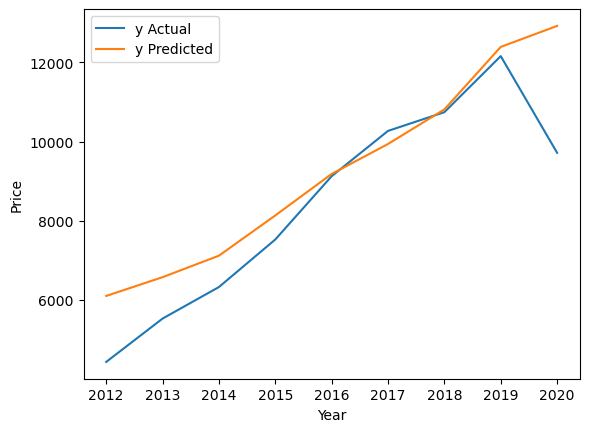

Manufacturer vw

Coefficients: [ 1.53553213e+03 -8.38898725e-02 -6.51325758e+00 -1.41160391e+02
  8.75985125e+03  8.80400452e+02 -1.28643019e+03  4.06029738e+02
 -4.61814066e+03  1.14414322e+04 -2.51824982e+03 -4.30504172e+03]
Intercept: -3079795.3048197767


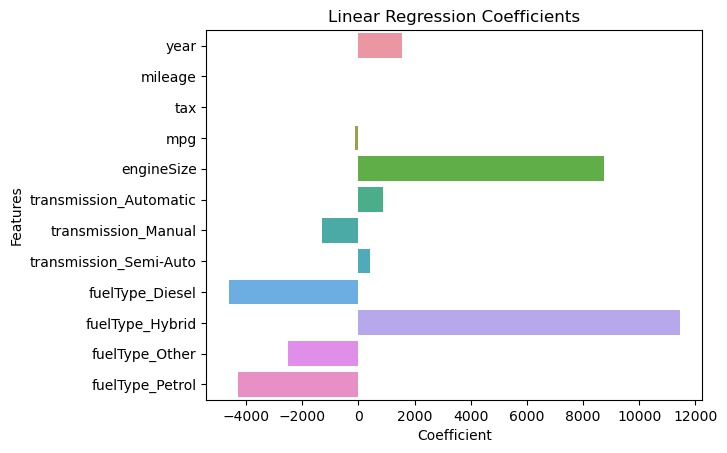

Error type: MAE. Value: 2201.8333827094575
Error type: MAPE. Value: 0.13672404470347047
Error type: 1 - MAPE. Value: 0.8632759552965296
Error type: MSE. Value: 10089467.84174935
Error type: RMSE. Value: 3176.392268242282
Error type: R2. Value: 0.821089929354828




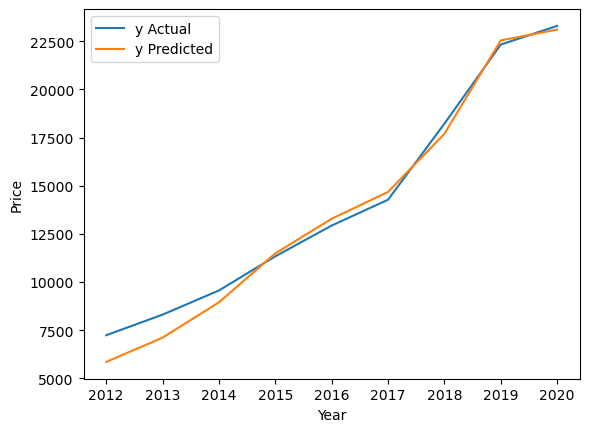

In [118]:
one_hot_encoded_dataframes_dict = {}
linear_regression_models_dict = {}
predictions_dict = {}
errors_dict = {}
train_data_lengths = {}
for manufacturer in car_dataframes_dict.keys():
    
    one_hot_encoded_dataframes_dict[manufacturer] = one_hot_encoding(car_dataframes_dict, manufacturer)
    
    X = one_hot_encoded_dataframes_dict[manufacturer].drop(['price', 'manufacturer'], axis=1)
    y = one_hot_encoded_dataframes_dict[manufacturer]['price']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    print(f"Manufacturer {manufacturer}\n")
    linear_regression_models_dict[manufacturer] = linear_regression_model(X_train, y_train)
    predictions_dict[manufacturer] = linear_regression_models_dict[manufacturer].predict(X_test) 
    
    errors_dict[manufacturer] = errors(y_test, predictions_dict[manufacturer])
    for error in errors_dict[manufacturer].keys():
        print(f"Error type: {error}. Value: {errors_dict[manufacturer][error]}")
    print("\n")
    train_data_lengths[manufacturer] = len(X_train)
    
    
    sns.lineplot(y=y_test, x=X_test['year'], label="y Actual", errorbar=None)
    sns.lineplot(y=predictions_dict[manufacturer], x=X_test['year'], label="y Predicted", errorbar=None)
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.show()

# Linear Regression with improvements and model feature for ALL dataset

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer all

X train: (32671, 166), X test: (14002, 166), y train: (32671,), y test: (14002,)

Coefficients: [ 1.81086038e+03 -1.28432893e+03  2.44727640e+15 -1.21540447e+03
  2.67751866e+03  1.14858389e+02  2.97552570e+03  2.62904234e+03
  5.64537877e+03  7.52092480e+03  1.63737480e+04  3.02763438e+04
  1.72619302e+14  8.04372773e+13  8.04372773e+13  8.04372773e+13
  8.04372773e+13  8.04372773e+13  8.04372773e+13  8.04372773e+13
  1.03019570e+13  1.03019570e+13  4.25578630e+13  1.03019570e+13
  1.52468421e+13  1.52468421e+13  1.52468421e+13  1.72619302e+14
 -6.16641564e+13  4.25578630e+13  1.72619302e+14  1.52468421e+13
 -6.16641564e+13  4.25578630e+13  1.72619302e+14  1.72619302e+14
  1.72619302e+14  4.25578630e+13  4.25578630e+13  4.25578630e+13
  4.25578630e+13  4.25578630e+13 -8.34993573e+12  1.03019570e+13
  1.52468421e+13  1.03019570e+13  1.03019570e+13  1.72619302e+14
 -6.16641564e+13 -6.16641564e+13 -8.34993573e+12 -6.16641564e+13
 -6.16641564e+13  1.72619302e+14  1.72619

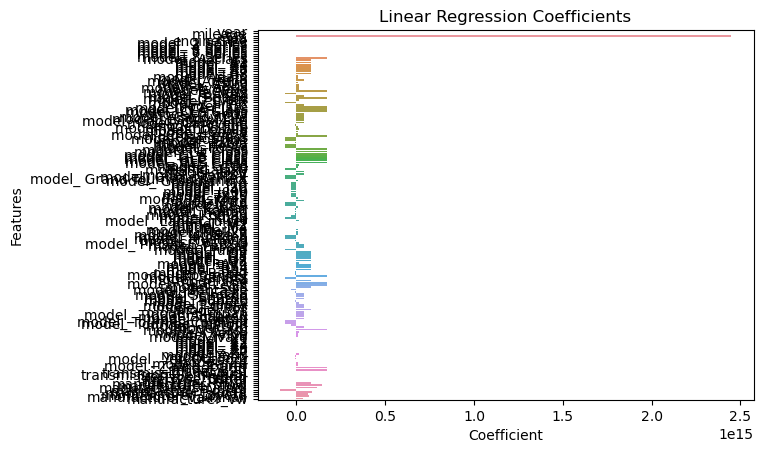

Error type: MAE. Value: 11489400423.460943
Error type: MAPE. Value: 465187.27350166766
Error type: 1 - MAPE. Value: -465186.27350166766
Error type: MSE. Value: 9.241759145804207e+23
Error type: RMSE. Value: 961340686011.1667
Error type: R2. Value: -9307355595646052.0




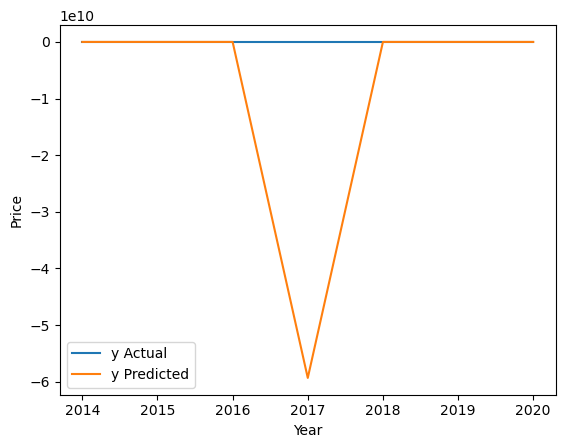

Manufacturer audi

X train: (4365, 20), X test: (1872, 20), y train: (4365,), y test: (1872,)

Coefficients: [ 2.93818859e+03 -1.29014474e+03 -2.51886591e+02 -1.67110968e+03
  1.45958247e+03  1.21420583e+03  1.72434965e+03  3.56357256e+03
  4.70238883e+03  1.04107949e+04  1.92229412e+03  3.77389661e+03
  7.86068801e+03  1.05823147e+04  4.89543249e+03  4.15537109e+03
 -1.90845277e+03  1.23491206e+02  2.44871615e+04  8.62459422e+00]
Intercept: 21287.681252534825


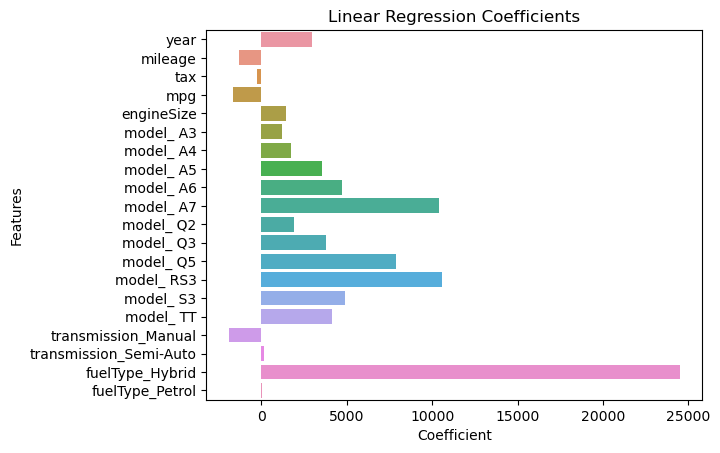

Error type: MAE. Value: 2005.8278161255494
Error type: MAPE. Value: 0.09024293331057845
Error type: 1 - MAPE. Value: 0.9097570666894216
Error type: MSE. Value: 6854640.933885028
Error type: RMSE. Value: 2618.1369203853774
Error type: R2. Value: 0.8593940263057352




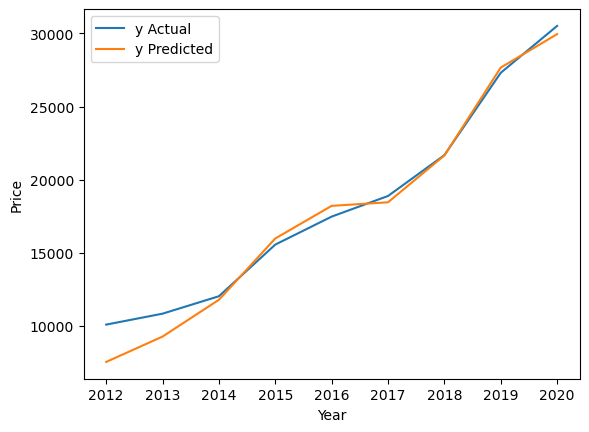

Manufacturer bmw

X train: (2863, 22), X test: (1228, 22), y train: (2863,), y test: (1228,)

Coefficients: [ 2.78802550e+03 -2.06671332e+03 -6.76450702e+02 -1.36827637e+03
  1.50066626e-11 -7.27664853e+02  2.54998122e+03  2.21098958e+03
  4.79589553e+03  9.82669422e+03  2.11989920e+04  2.48638093e+03
  3.43853942e+03  7.42087109e+03  9.49050616e+03  1.11819745e+04
  5.19483303e+03 -2.16805429e+03  1.30452504e+02  4.28301476e+03
  4.44845610e+03 -1.14083530e+03]
Intercept: 22505.80193793444


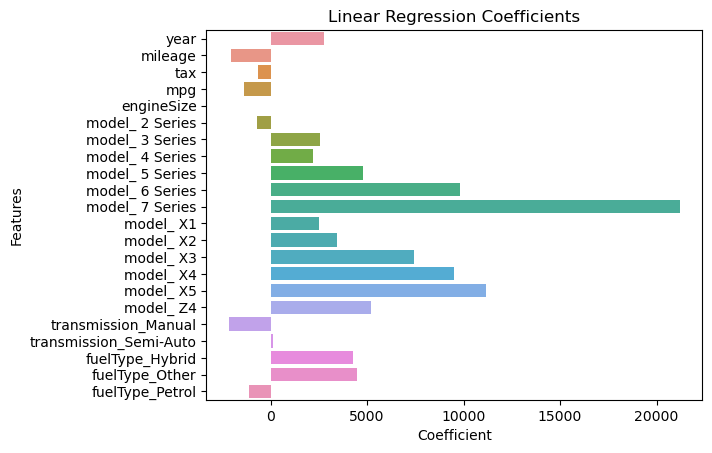

Error type: MAE. Value: 2338.576769310379
Error type: MAPE. Value: 0.09733336114742902
Error type: 1 - MAPE. Value: 0.902666638852571
Error type: MSE. Value: 9383178.116497979
Error type: RMSE. Value: 3063.197368191932
Error type: R2. Value: 0.770782582334976




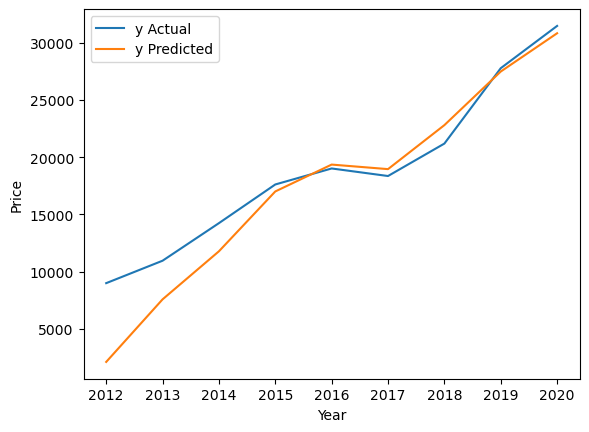

Manufacturer ford

X train: (8652, 26), X test: (3709, 26), y train: (8652,), y test: (3709,)

Coefficients: [ 2.13998358e+03 -9.08557867e+02 -1.09685764e+01 -3.25819262e+02
  1.82576140e+03  9.89091641e+02  2.15990070e+03  9.29402517e+03
  8.38049782e+02  3.15130967e+03  6.91816947e+03  2.41546348e+03
  4.34896127e+03 -2.85950113e+03 -3.11547083e+03  3.81597021e+03
  2.35945305e+03  1.33986089e+04  7.53750834e+03  6.80815420e+03
  4.15551971e+03  7.25182735e+03 -7.26222534e+02  1.00093817e+02
  4.99761375e+03  8.74954751e+02]
Intercept: 11410.679552048112


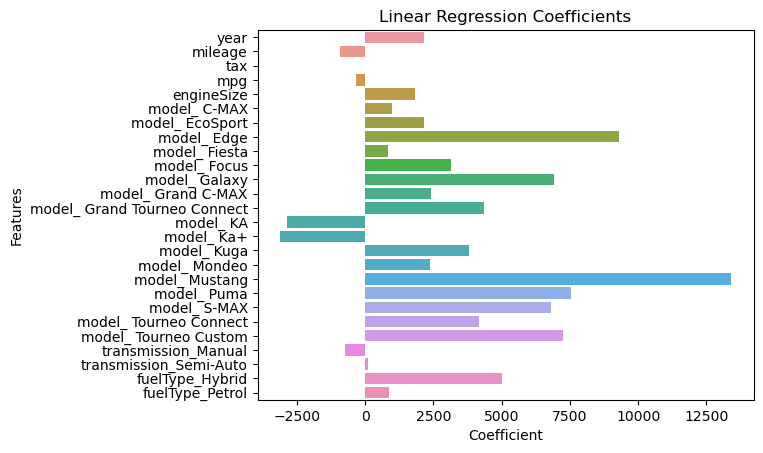

Error type: MAE. Value: 1273.5969447001437
Error type: MAPE. Value: 0.09899628099335517
Error type: 1 - MAPE. Value: 0.9010037190066449
Error type: MSE. Value: 2740694.2855890295
Error type: RMSE. Value: 1655.5042390731078
Error type: R2. Value: 0.8487329161341579




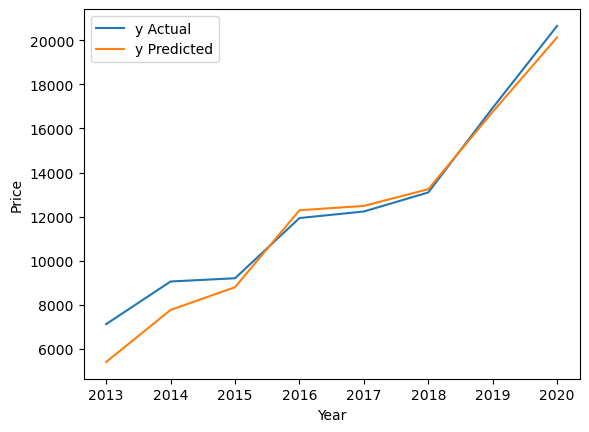

Manufacturer hyundi

X train: (2377, 22), X test: (1019, 22), y train: (2377,), y test: (1019,)

Coefficients: [ 1694.93492928 -1087.66609788  -169.26666673  -632.98067677
  2475.77861309   568.80153536  2979.07480777  1784.0913741
 -1804.22604248  -404.55602217  3116.41196281   984.52106559
  4878.45082482 10820.54674843  3552.66541491  3337.95651368
 -1450.82988596  1504.55297228   455.42792868  4214.8629053
  4303.20054985   203.55014493]
Intercept: 12274.963942839351


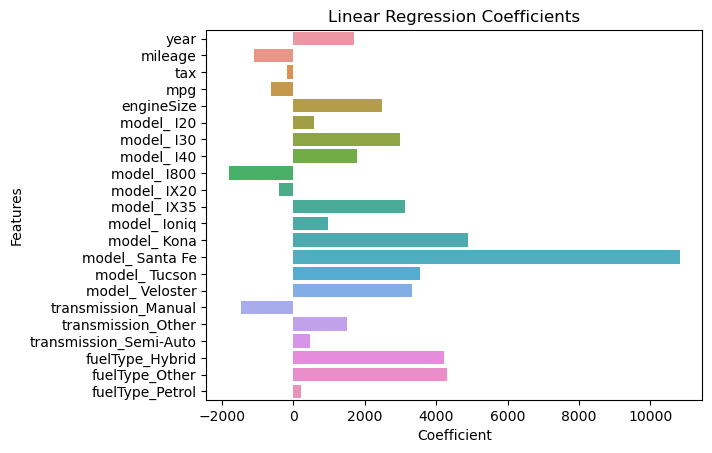

Error type: MAE. Value: 1416.9848506047479
Error type: MAPE. Value: 0.10619784527329297
Error type: 1 - MAPE. Value: 0.893802154726707
Error type: MSE. Value: 3526030.737331544
Error type: RMSE. Value: 1877.772813023861
Error type: R2. Value: 0.9016046825154099




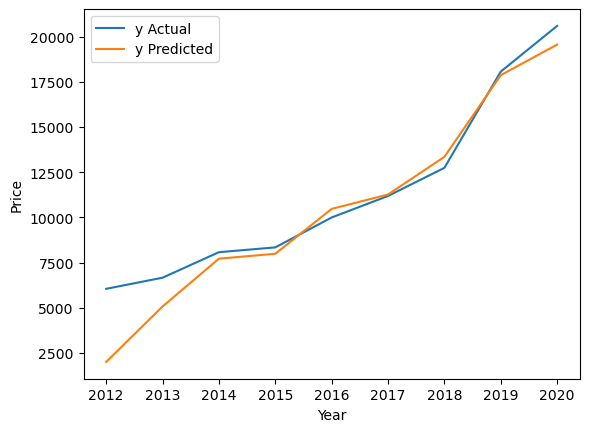

Manufacturer merc

X train: (5833, 26), X test: (2500, 26), y train: (5833,), y test: (2500,)

Coefficients: [ 2.81793960e+03 -2.36548692e+03 -1.37759563e+02 -1.99154935e+03
  1.12610328e+03 -1.31237171e+03  2.23288874e+03  1.96102686e+03
  2.82224194e+03  4.73757309e+03  4.23318801e+03  1.98410969e+03
  5.15210001e+02  7.12642195e+03  7.12477183e+03  1.44496331e+04
  2.57340496e+03  1.41363841e+03  7.91097577e+03  1.21569906e+03
 -2.83477453e+03 -2.85046071e+03  3.32129576e+01  2.14756913e+04
  3.33562196e+04 -8.89820715e+02]
Intercept: 22306.197922987325


C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


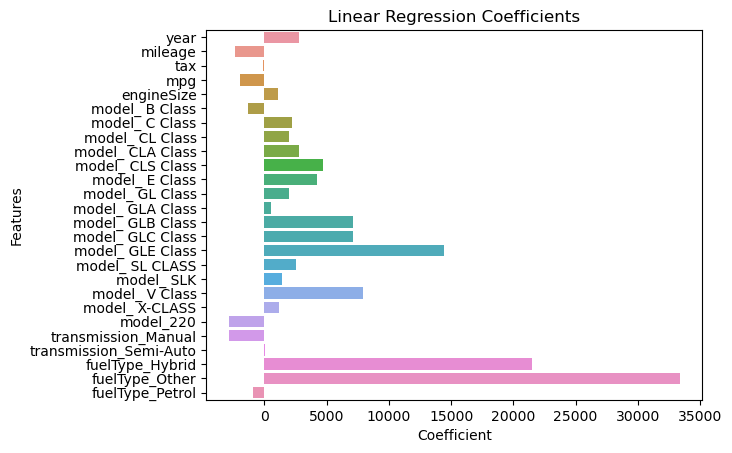

Error type: MAE. Value: 2627.6189611354393
Error type: MAPE. Value: 0.11051732995731996
Error type: 1 - MAPE. Value: 0.88948267004268
Error type: MSE. Value: 13734922.375476848
Error type: RMSE. Value: 3706.065619424034
Error type: R2. Value: 0.7499282749748949




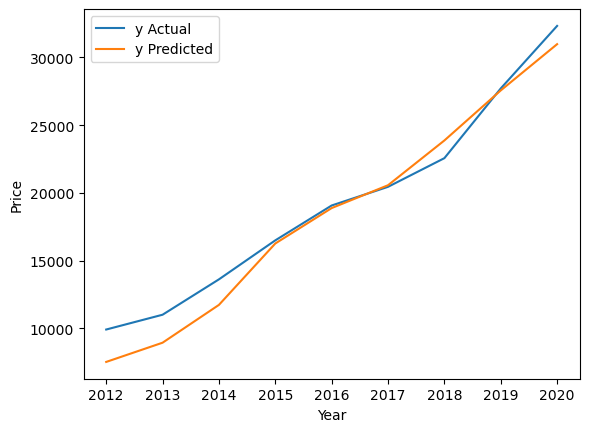

Manufacturer skoda

X train: (3285, 22), X test: (1409, 22), y train: (3285,), y test: (1409,)

Coefficients: [ 1.20158395e+03 -1.01298256e+03 -1.18621370e+02 -1.87529740e+03
  1.59610276e+03  1.01568560e+03  4.67238735e+03  6.38927853e+03
  8.40088597e+03  2.41335073e+03  1.01055758e+03  6.91062426e+02
  2.46501170e+03  4.71220417e+03  2.19750898e+03  2.60816441e+03
 -1.59341676e+03 -8.85843079e+02  1.61854380e+01  3.12021115e+04
 -6.26940860e+02 -7.52296802e+02]
Intercept: 14014.197850813685


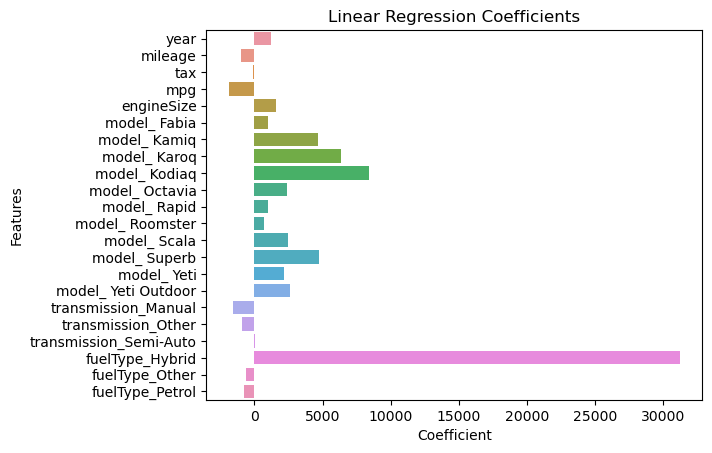

Error type: MAE. Value: 1378.1847307623252
Error type: MAPE. Value: 0.09064435126329837
Error type: 1 - MAPE. Value: 0.9093556487367016
Error type: MSE. Value: 3477549.0564411115
Error type: RMSE. Value: 1864.8187730825512
Error type: R2. Value: 0.9105530855742789




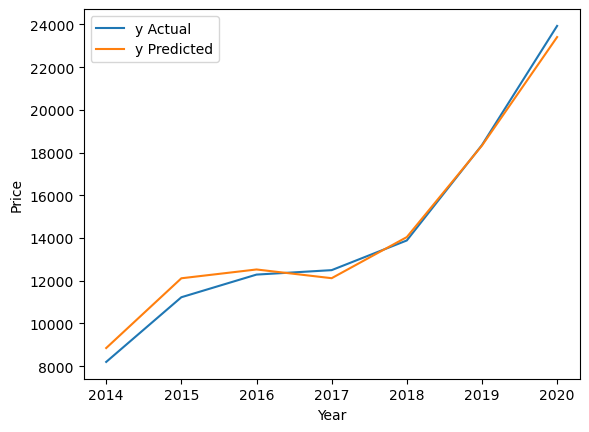

Manufacturer toyota

X train: (4451, 26), X test: (1908, 26), y train: (4451,), y test: (1908,)

Coefficients: [ 1555.27270783  -862.33319579  -389.58177809   -85.57404817
  1143.95906908  1305.68192553 -3144.22724056  5262.58731586
  6540.01995121  4539.79589345  6491.1135242   9425.58304312
  -918.39411609 24292.46548847 14326.70018384  5089.76098837
  5434.39300434 30755.56400805  1436.78413752 -1836.75477214
 -1221.53560298  1186.36056978   -64.58180477  3426.50128858
  3051.44890615  1721.3506824 ]
Intercept: 11340.682880155353


C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


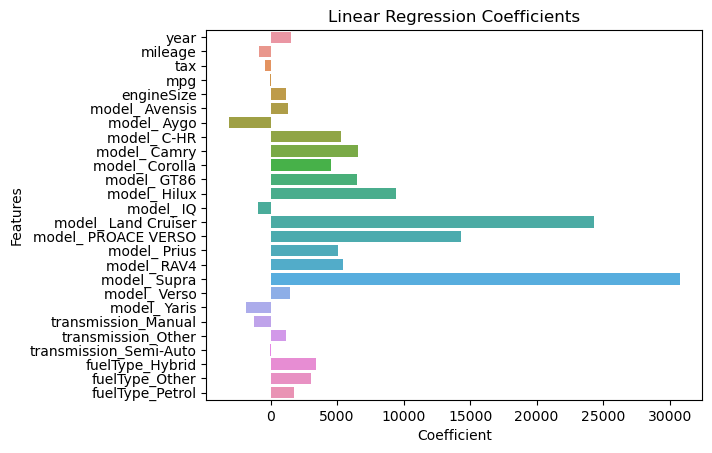

Error type: MAE. Value: 1016.8997321220043
Error type: MAPE. Value: 0.08379036183298469
Error type: 1 - MAPE. Value: 0.9162096381670153
Error type: MSE. Value: 2155677.1287194123
Error type: RMSE. Value: 1468.2224384334318
Error type: R2. Value: 0.9470502689282967




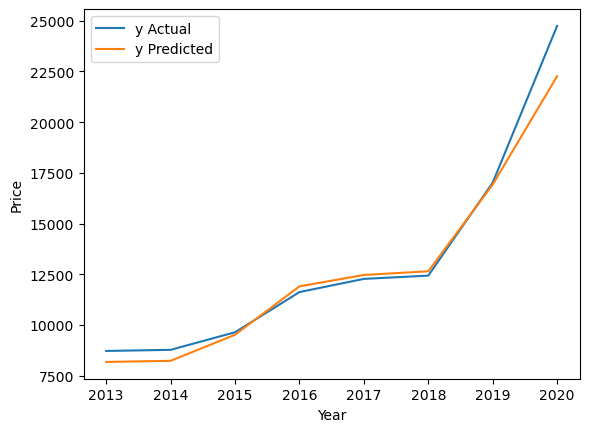

Manufacturer vauxhall

X train: (3885, 17), X test: (1666, 17), y train: (3885,), y test: (1666,)

Coefficients: [ 9.48325737e+02 -7.01217996e+02 -5.20789763e+01 -1.86010187e+02
  4.83169060e-13  1.58454940e+03 -8.27216272e+02  1.04758465e+03
  1.35082280e+03 -6.40483129e+02  1.94467414e+03  2.52547446e+03
  2.66088097e+03  2.75812314e+03 -1.42432556e+03 -1.21207472e+03
 -2.49802371e+02]
Intercept: 10816.23984362703


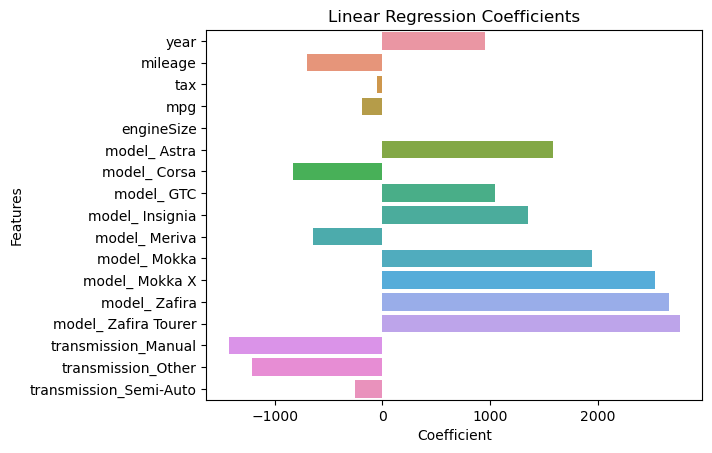

Error type: MAE. Value: 750.288967184422
Error type: MAPE. Value: 0.07388190964883691
Error type: 1 - MAPE. Value: 0.9261180903511631
Error type: MSE. Value: 950831.5246872539
Error type: RMSE. Value: 975.1059043443711
Error type: R2. Value: 0.8443708937899125




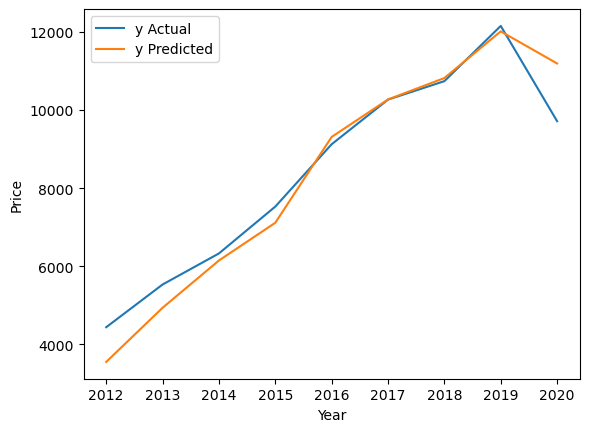

Manufacturer vw

X train: (10139, 34), X test: (4346, 34), y train: (10139,), y test: (4346,)

Coefficients: [ 2550.90714757 -1385.08696147  -742.21449274  -905.12777852
  3413.01390082   364.38757497 -3291.39244511 -4559.67419023
  -482.13729524 -4964.21271637  -938.87908202 -4718.61565059
 32709.61076033 17344.96535129 -2845.98435857 -4330.03039185
 -6324.99236113 -2849.10227816 -4769.53764213 -4344.32456953
  -788.80520905  1263.93062607  -726.61453273   -33.3544045
   466.25685888  2935.42967274  3648.43827501  -152.88068157
 -6828.02761722 -1788.22897392  -141.90346092 13139.77456158
  2929.61874266  2286.61724799]
Intercept: 19406.26444207751


C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


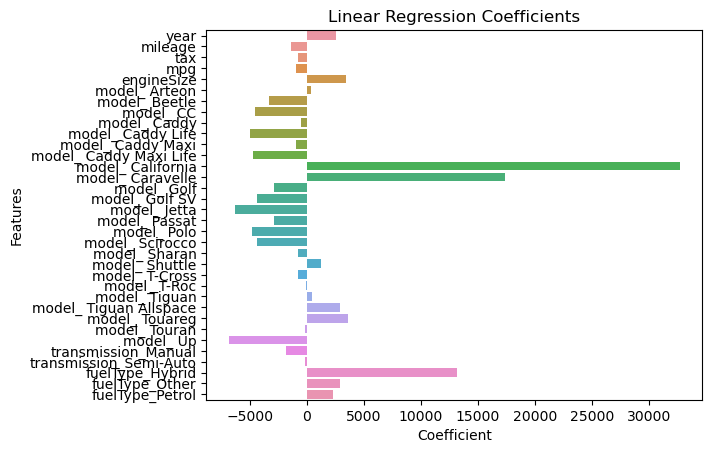

Error type: MAE. Value: 1795.8860436889217
Error type: MAPE. Value: 0.11318378027997449
Error type: 1 - MAPE. Value: 0.8868162197200256
Error type: MSE. Value: 6081292.205196213
Error type: RMSE. Value: 2466.02761647071
Error type: R2. Value: 0.8921643405667523




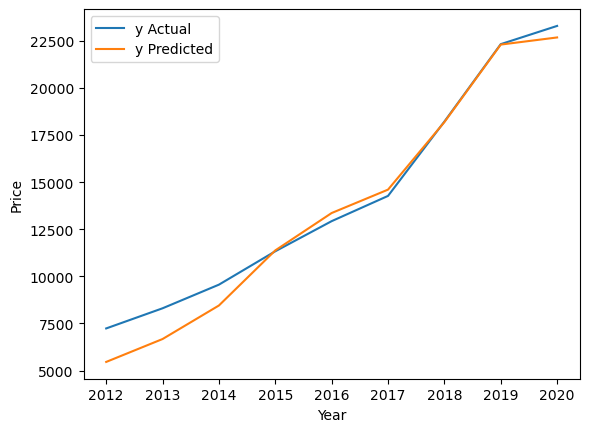

In [146]:
one_hot_encoded_dataframes_dict = {}
linear_regression_models_dict = {}
predictions_dict = {}
errors_dict = {}
train_data_lengths = {}

for manufacturer in car_dataframes_dict.keys():
    
    if manufacturer == 'all':
        X = car_dataframes_dict[manufacturer].drop(['price'], axis=1)
    
    else:
        X = car_dataframes_dict[manufacturer].drop(['price', 'manufacturer'], axis=1)
    
    y = car_dataframes_dict[manufacturer]['price']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    X_train_scaled, X_test_scaled = scaling(X_train, X_test, scaler="std")
    
    X_train_encoded, X_test_encoded = one_hot_encoding_sklearn(X_train_scaled, X_test_scaled)
    
    one_hot_encoded_dataframes_dict[manufacturer] = {"X_train": X_train_encoded,
                                                     "X_test": X_test_encoded,
                                                     "y_train": y_train,
                                                     "y_test": y_test}
    
    print(f"Manufacturer {manufacturer}\n")
    print(f"X train: {X_train_encoded.shape}, X test: {X_test_encoded.shape}, y train: {y_train.shape}, y test: {y_test.shape}\n")
    
    linear_regression_models_dict[manufacturer] = linear_regression_model(one_hot_encoded_dataframes_dict[manufacturer]["X_train"], 
                                                                          one_hot_encoded_dataframes_dict[manufacturer]["y_train"])
    
    predictions_dict[manufacturer] = linear_regression_models_dict[manufacturer].predict(one_hot_encoded_dataframes_dict[manufacturer]["X_test"]) 
    
    errors_dict[manufacturer] = errors(one_hot_encoded_dataframes_dict[manufacturer]["y_test"], predictions_dict[manufacturer])
    
    for error in errors_dict[manufacturer].keys():
        print(f"Error type: {error}. Value: {errors_dict[manufacturer][error]}")
    print("\n")
    
    train_data_lengths[manufacturer] = len(one_hot_encoded_dataframes_dict[manufacturer]["X_train"])
    
    
    sns.lineplot(y=y_test, x=X_test['year'], label="y Actual", errorbar=None)
    sns.lineplot(y=predictions_dict[manufacturer], x=X_test['year'], label="y Predicted", errorbar=None)
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.show()

# Linear Regression without model feature for ALL dataset

Manufacturer all

X train: (32671, 18), X test: (14002, 18), y train: (32671,), y test: (14002,)

Coefficients: [ 1.92603237e+03 -1.09581724e+03 -2.72848411e-12 -2.28269030e+03
  4.27726410e+03 -1.94043509e+03  7.46632466e+01  2.92066466e+03
 -3.54598338e+02 -1.48550819e+03 -1.50046750e+03 -3.40019825e+03
 -6.40527778e+03  5.93289396e+02 -4.45351268e+03 -5.88532283e+03
 -7.99963477e+03 -3.80697133e+03]
Intercept: 25185.791223965123


C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


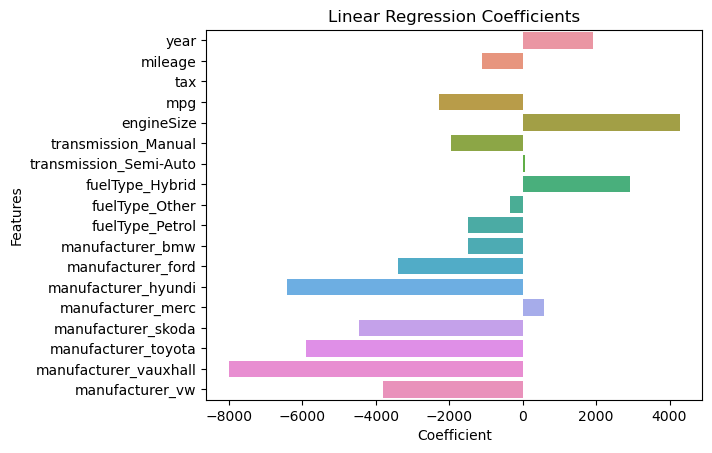

Error type: MAE. Value: 3048.343154365242
Error type: MAPE. Value: 0.1678618214314832
Error type: 1 - MAPE. Value: 0.8321381785685168
Error type: MSE. Value: 18587758.666387033
Error type: RMSE. Value: 4311.352301353606
Error type: R2. Value: 0.8128030855330615




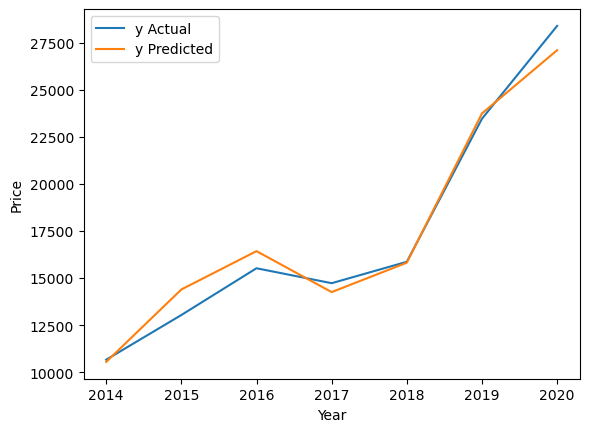

Manufacturer audi

X train: (4365, 20), X test: (1872, 20), y train: (4365,), y test: (1872,)

Coefficients: [ 2.93818859e+03 -1.29014474e+03 -2.51886591e+02 -1.67110968e+03
  1.45958247e+03  1.21420583e+03  1.72434965e+03  3.56357256e+03
  4.70238883e+03  1.04107949e+04  1.92229412e+03  3.77389661e+03
  7.86068801e+03  1.05823147e+04  4.89543249e+03  4.15537109e+03
 -1.90845277e+03  1.23491206e+02  2.44871615e+04  8.62459422e+00]
Intercept: 21287.681252534825


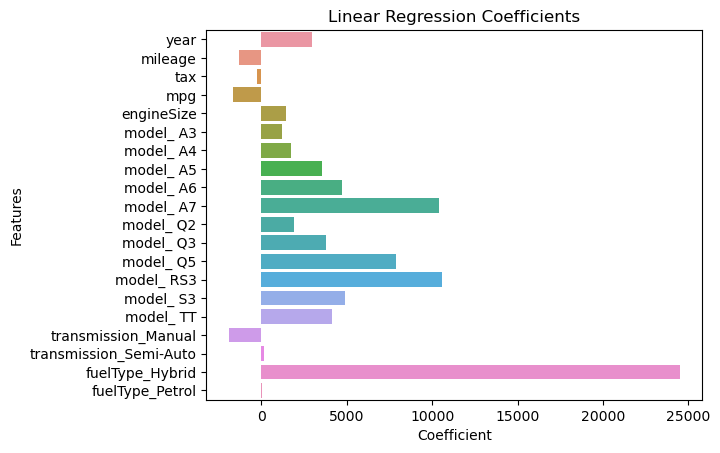

Error type: MAE. Value: 2005.8278161255494
Error type: MAPE. Value: 0.09024293331057845
Error type: 1 - MAPE. Value: 0.9097570666894216
Error type: MSE. Value: 6854640.933885028
Error type: RMSE. Value: 2618.1369203853774
Error type: R2. Value: 0.8593940263057352




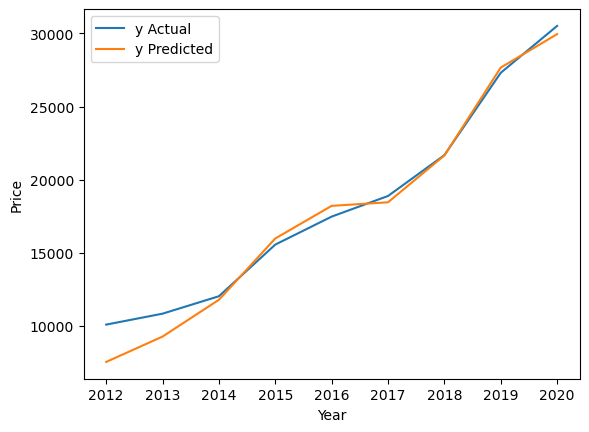

Manufacturer bmw

X train: (2863, 22), X test: (1228, 22), y train: (2863,), y test: (1228,)

Coefficients: [ 2.78802550e+03 -2.06671332e+03 -6.76450702e+02 -1.36827637e+03
  1.50066626e-11 -7.27664853e+02  2.54998122e+03  2.21098958e+03
  4.79589553e+03  9.82669422e+03  2.11989920e+04  2.48638093e+03
  3.43853942e+03  7.42087109e+03  9.49050616e+03  1.11819745e+04
  5.19483303e+03 -2.16805429e+03  1.30452504e+02  4.28301476e+03
  4.44845610e+03 -1.14083530e+03]
Intercept: 22505.80193793444


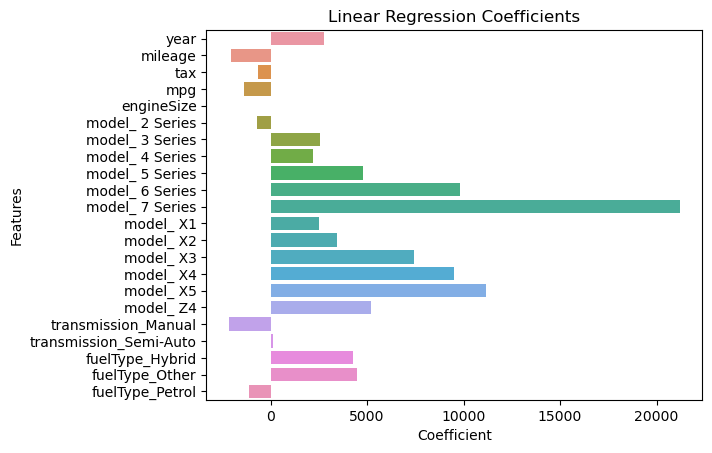

Error type: MAE. Value: 2338.576769310379
Error type: MAPE. Value: 0.09733336114742902
Error type: 1 - MAPE. Value: 0.902666638852571
Error type: MSE. Value: 9383178.116497979
Error type: RMSE. Value: 3063.197368191932
Error type: R2. Value: 0.770782582334976




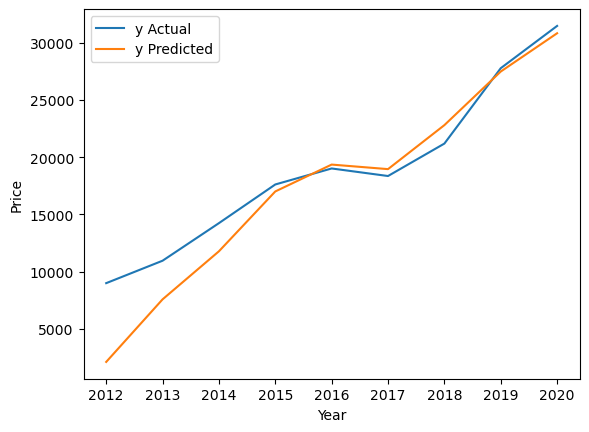

Manufacturer ford

X train: (8652, 26), X test: (3709, 26), y train: (8652,), y test: (3709,)

Coefficients: [ 2.13998358e+03 -9.08557867e+02 -1.09685764e+01 -3.25819262e+02
  1.82576140e+03  9.89091641e+02  2.15990070e+03  9.29402517e+03
  8.38049782e+02  3.15130967e+03  6.91816947e+03  2.41546348e+03
  4.34896127e+03 -2.85950113e+03 -3.11547083e+03  3.81597021e+03
  2.35945305e+03  1.33986089e+04  7.53750834e+03  6.80815420e+03
  4.15551971e+03  7.25182735e+03 -7.26222534e+02  1.00093817e+02
  4.99761375e+03  8.74954751e+02]
Intercept: 11410.679552048112


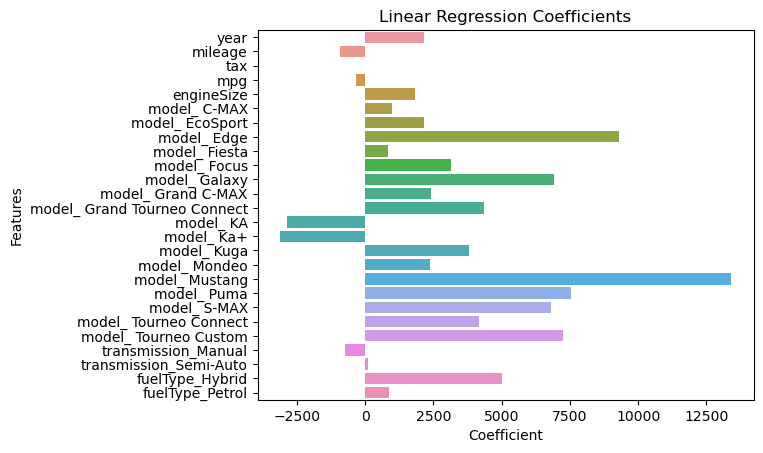

Error type: MAE. Value: 1273.5969447001437
Error type: MAPE. Value: 0.09899628099335517
Error type: 1 - MAPE. Value: 0.9010037190066449
Error type: MSE. Value: 2740694.2855890295
Error type: RMSE. Value: 1655.5042390731078
Error type: R2. Value: 0.8487329161341579




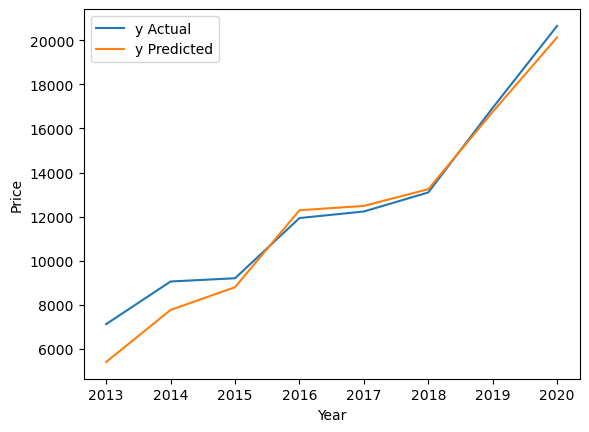

Manufacturer hyundi

X train: (2377, 22), X test: (1019, 22), y train: (2377,), y test: (1019,)

Coefficients: [ 1694.93492928 -1087.66609788  -169.26666673  -632.98067677
  2475.77861309   568.80153536  2979.07480777  1784.0913741
 -1804.22604248  -404.55602217  3116.41196281   984.52106559
  4878.45082482 10820.54674843  3552.66541491  3337.95651368
 -1450.82988596  1504.55297228   455.42792868  4214.8629053
  4303.20054985   203.55014493]
Intercept: 12274.963942839351


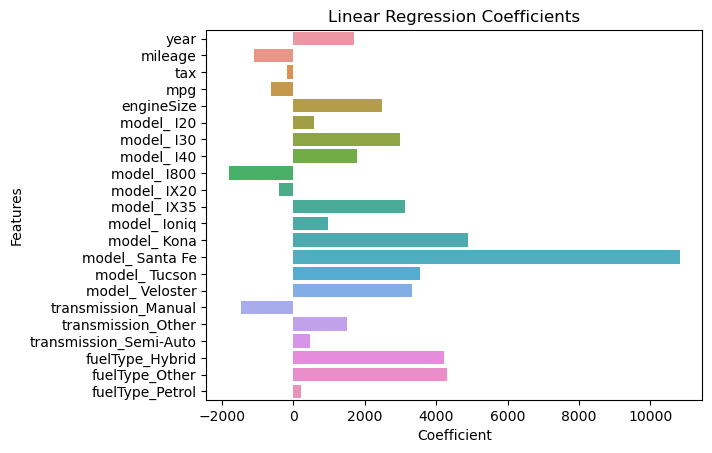

Error type: MAE. Value: 1416.9848506047479
Error type: MAPE. Value: 0.10619784527329297
Error type: 1 - MAPE. Value: 0.893802154726707
Error type: MSE. Value: 3526030.737331544
Error type: RMSE. Value: 1877.772813023861
Error type: R2. Value: 0.9016046825154099




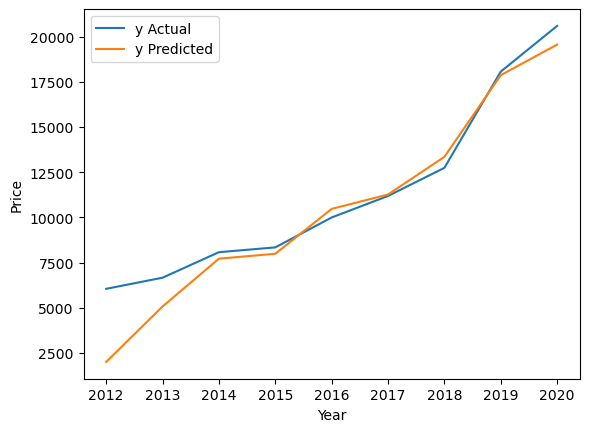

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer merc

X train: (5833, 26), X test: (2500, 26), y train: (5833,), y test: (2500,)

Coefficients: [ 2.81793960e+03 -2.36548692e+03 -1.37759563e+02 -1.99154935e+03
  1.12610328e+03 -1.31237171e+03  2.23288874e+03  1.96102686e+03
  2.82224194e+03  4.73757309e+03  4.23318801e+03  1.98410969e+03
  5.15210001e+02  7.12642195e+03  7.12477183e+03  1.44496331e+04
  2.57340496e+03  1.41363841e+03  7.91097577e+03  1.21569906e+03
 -2.83477453e+03 -2.85046071e+03  3.32129576e+01  2.14756913e+04
  3.33562196e+04 -8.89820715e+02]
Intercept: 22306.197922987325


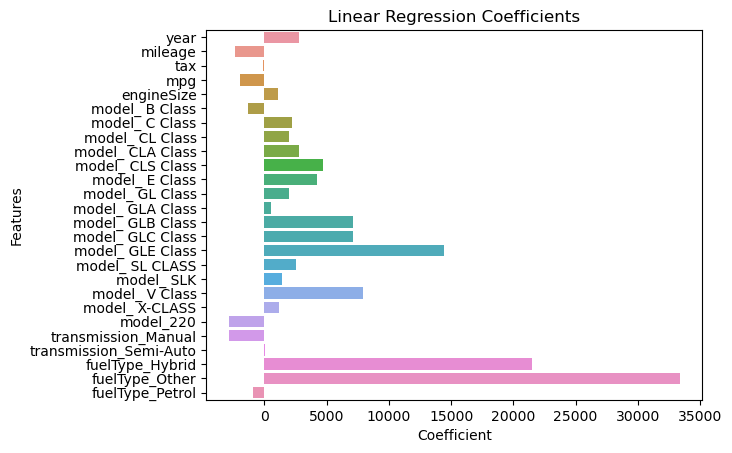

Error type: MAE. Value: 2627.6189611354393
Error type: MAPE. Value: 0.11051732995731996
Error type: 1 - MAPE. Value: 0.88948267004268
Error type: MSE. Value: 13734922.375476848
Error type: RMSE. Value: 3706.065619424034
Error type: R2. Value: 0.7499282749748949




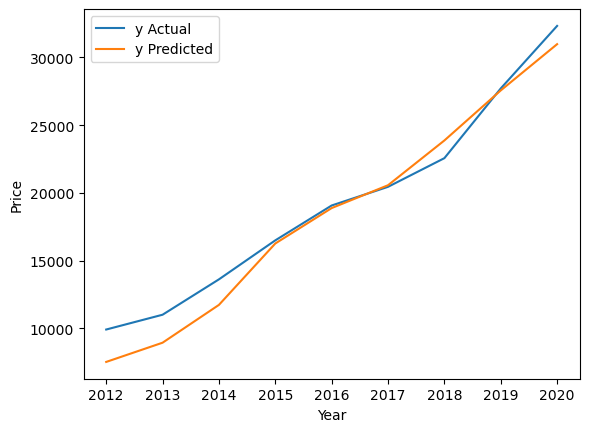

Manufacturer skoda

X train: (3285, 22), X test: (1409, 22), y train: (3285,), y test: (1409,)

Coefficients: [ 1.20158395e+03 -1.01298256e+03 -1.18621370e+02 -1.87529740e+03
  1.59610276e+03  1.01568560e+03  4.67238735e+03  6.38927853e+03
  8.40088597e+03  2.41335073e+03  1.01055758e+03  6.91062426e+02
  2.46501170e+03  4.71220417e+03  2.19750898e+03  2.60816441e+03
 -1.59341676e+03 -8.85843079e+02  1.61854380e+01  3.12021115e+04
 -6.26940860e+02 -7.52296802e+02]
Intercept: 14014.197850813685


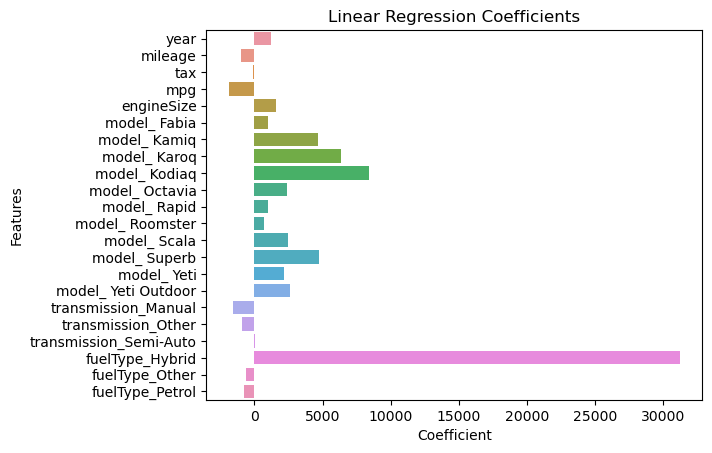

Error type: MAE. Value: 1378.1847307623252
Error type: MAPE. Value: 0.09064435126329837
Error type: 1 - MAPE. Value: 0.9093556487367016
Error type: MSE. Value: 3477549.0564411115
Error type: RMSE. Value: 1864.8187730825512
Error type: R2. Value: 0.9105530855742789




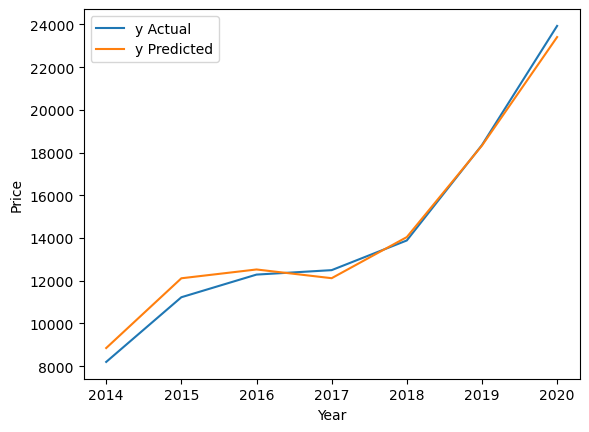

Manufacturer toyota

X train: (4451, 26), X test: (1908, 26), y train: (4451,), y test: (1908,)

Coefficients: [ 1555.27270783  -862.33319579  -389.58177809   -85.57404817
  1143.95906908  1305.68192553 -3144.22724056  5262.58731586
  6540.01995121  4539.79589345  6491.1135242   9425.58304312
  -918.39411609 24292.46548847 14326.70018384  5089.76098837
  5434.39300434 30755.56400805  1436.78413752 -1836.75477214
 -1221.53560298  1186.36056978   -64.58180477  3426.50128858
  3051.44890615  1721.3506824 ]
Intercept: 11340.682880155353


C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


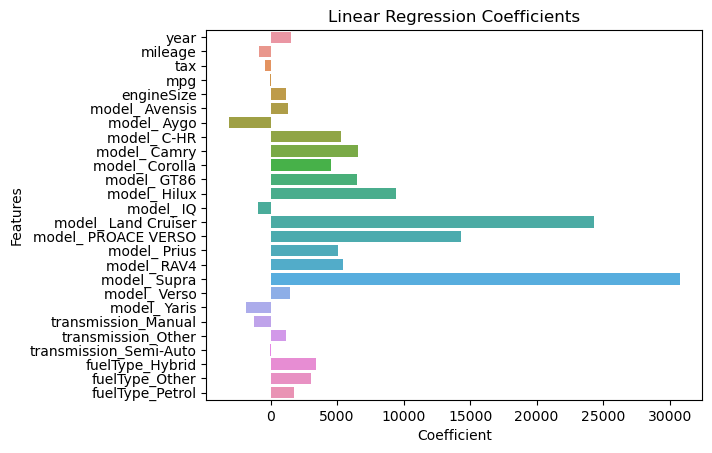

Error type: MAE. Value: 1016.8997321220043
Error type: MAPE. Value: 0.08379036183298469
Error type: 1 - MAPE. Value: 0.9162096381670153
Error type: MSE. Value: 2155677.1287194123
Error type: RMSE. Value: 1468.2224384334318
Error type: R2. Value: 0.9470502689282967




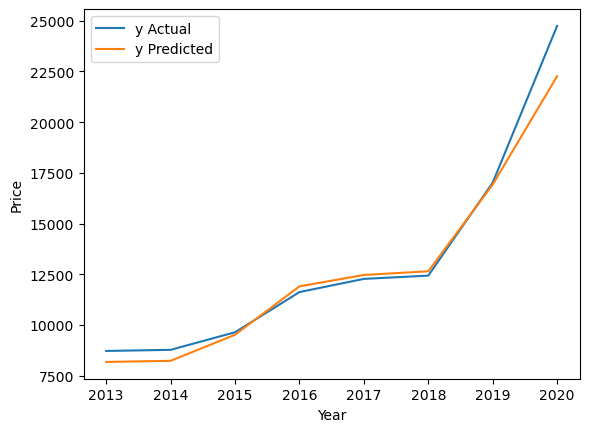

Manufacturer vauxhall

X train: (3885, 17), X test: (1666, 17), y train: (3885,), y test: (1666,)

Coefficients: [ 9.48325737e+02 -7.01217996e+02 -5.20789763e+01 -1.86010187e+02
  4.83169060e-13  1.58454940e+03 -8.27216272e+02  1.04758465e+03
  1.35082280e+03 -6.40483129e+02  1.94467414e+03  2.52547446e+03
  2.66088097e+03  2.75812314e+03 -1.42432556e+03 -1.21207472e+03
 -2.49802371e+02]
Intercept: 10816.23984362703


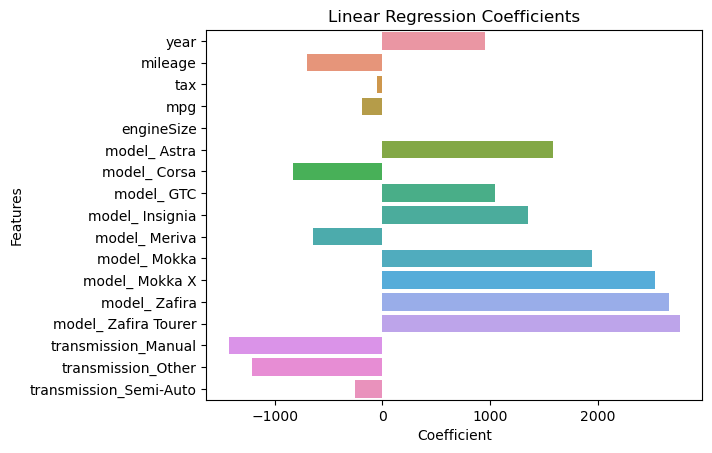

Error type: MAE. Value: 750.288967184422
Error type: MAPE. Value: 0.07388190964883691
Error type: 1 - MAPE. Value: 0.9261180903511631
Error type: MSE. Value: 950831.5246872539
Error type: RMSE. Value: 975.1059043443711
Error type: R2. Value: 0.8443708937899125




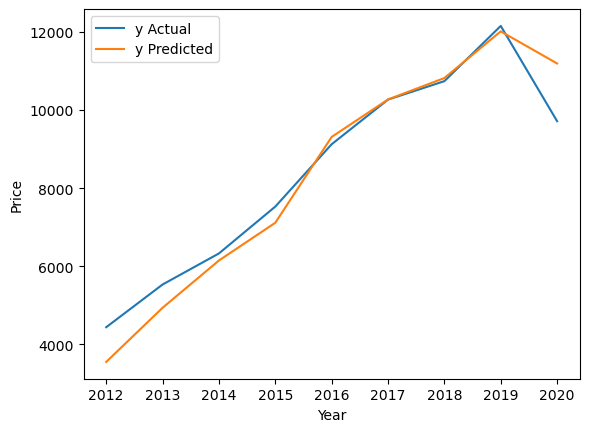

Manufacturer vw

X train: (10139, 34), X test: (4346, 34), y train: (10139,), y test: (4346,)

Coefficients: [ 2550.90714757 -1385.08696147  -742.21449274  -905.12777852
  3413.01390082   364.38757497 -3291.39244511 -4559.67419023
  -482.13729524 -4964.21271637  -938.87908202 -4718.61565059
 32709.61076033 17344.96535129 -2845.98435857 -4330.03039185
 -6324.99236113 -2849.10227816 -4769.53764213 -4344.32456953
  -788.80520905  1263.93062607  -726.61453273   -33.3544045
   466.25685888  2935.42967274  3648.43827501  -152.88068157
 -6828.02761722 -1788.22897392  -141.90346092 13139.77456158
  2929.61874266  2286.61724799]
Intercept: 19406.26444207751


C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


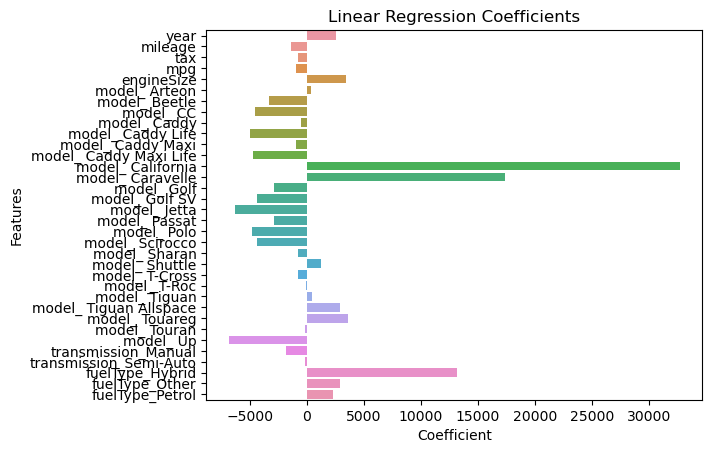

Error type: MAE. Value: 1795.8860436889217
Error type: MAPE. Value: 0.11318378027997449
Error type: 1 - MAPE. Value: 0.8868162197200256
Error type: MSE. Value: 6081292.205196213
Error type: RMSE. Value: 2466.02761647071
Error type: R2. Value: 0.8921643405667523




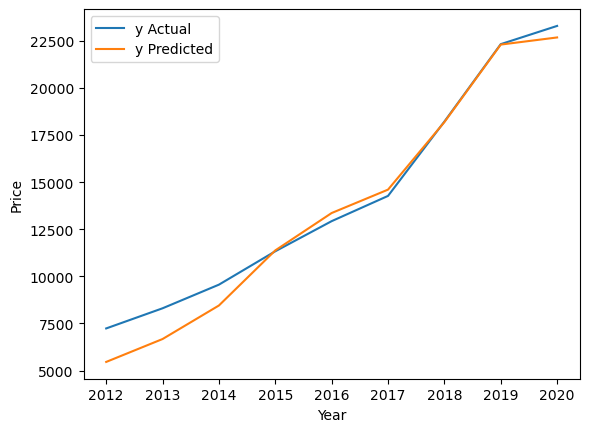

In [149]:
one_hot_encoded_dataframes_dict = {}
linear_regression_models_dict = {}
predictions_dict = {}
errors_dict = {}
train_data_lengths = {}

for manufacturer in car_dataframes_dict.keys():
    
    if manufacturer == 'all':
        X = car_dataframes_dict[manufacturer].drop(['price', 'model'], axis=1)
    
    else:
        X = car_dataframes_dict[manufacturer].drop(['price', 'manufacturer'], axis=1)
    
    y = car_dataframes_dict[manufacturer]['price']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    X_train_scaled, X_test_scaled = scaling(X_train, X_test, scaler="std")
    
    X_train_encoded, X_test_encoded = one_hot_encoding_sklearn(X_train_scaled, X_test_scaled)
    
    one_hot_encoded_dataframes_dict[manufacturer] = {"X_train": X_train_encoded,
                                                     "X_test": X_test_encoded,
                                                     "y_train": y_train,
                                                     "y_test": y_test}
    
    print(f"Manufacturer {manufacturer}\n")
    print(f"X train: {X_train_encoded.shape}, X test: {X_test_encoded.shape}, y train: {y_train.shape}, y test: {y_test.shape}\n")
    
    linear_regression_models_dict[manufacturer] = linear_regression_model(one_hot_encoded_dataframes_dict[manufacturer]["X_train"], 
                                                                          one_hot_encoded_dataframes_dict[manufacturer]["y_train"])
    
    predictions_dict[manufacturer] = linear_regression_models_dict[manufacturer].predict(one_hot_encoded_dataframes_dict[manufacturer]["X_test"]) 
    
    errors_dict[manufacturer] = errors(one_hot_encoded_dataframes_dict[manufacturer]["y_test"], predictions_dict[manufacturer])
    
    for error in errors_dict[manufacturer].keys():
        print(f"Error type: {error}. Value: {errors_dict[manufacturer][error]}")
    print("\n")
    
    train_data_lengths[manufacturer] = len(one_hot_encoded_dataframes_dict[manufacturer]["X_train"])
    
    
    sns.lineplot(y=y_test, x=X_test['year'], label="y Actual", errorbar=None)
    sns.lineplot(y=predictions_dict[manufacturer], x=X_test['year'], label="y Predicted", errorbar=None)
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.show()

# Random Forest

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer all

X train: (48143, 182), X test: (20633, 182), y train: (48143,), y test: (20633,)

Error type: MAE. Value: 1249.4417476522756
Error type: MAPE. Value: 0.06674511649332068
Error type: 1 - MAPE. Value: 0.9332548835066793
Error type: MSE. Value: 4355830.782594969
Error type: RMSE. Value: 2087.0627164977504
Error type: R2. Value: 0.9600208199269372




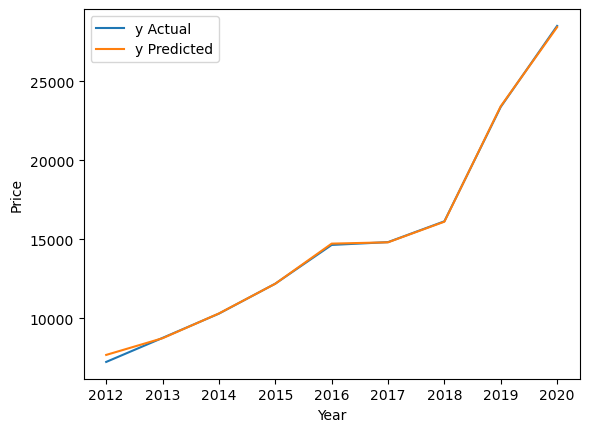

Manufacturer audi

X train: (5085, 31), X test: (2180, 31), y train: (5085,), y test: (2180,)

Error type: MAE. Value: 1686.0230285953724
Error type: MAPE. Value: 0.06484843587747484
Error type: 1 - MAPE. Value: 0.9351515641225252
Error type: MSE. Value: 6503730.573499124
Error type: RMSE. Value: 2550.2412775067232
Error type: R2. Value: 0.9512158912414045




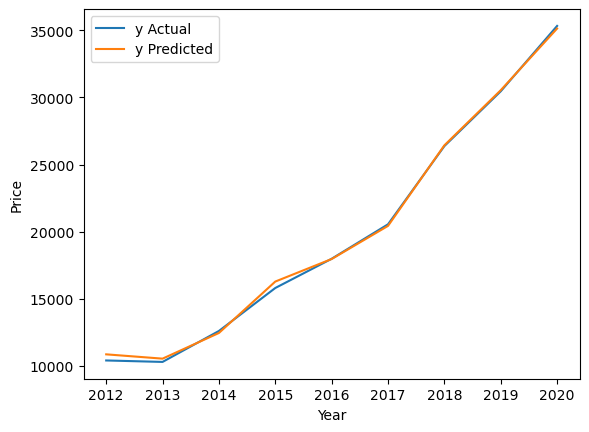

Manufacturer bmw

X train: (4692, 33), X test: (2012, 33), y train: (4692,), y test: (2012,)

Error type: MAE. Value: 1896.9812077788768
Error type: MAPE. Value: 0.06827526502049451
Error type: 1 - MAPE. Value: 0.9317247349795055
Error type: MSE. Value: 8367947.1126442645
Error type: RMSE. Value: 2892.7404157034666
Error type: R2. Value: 0.934601975031858




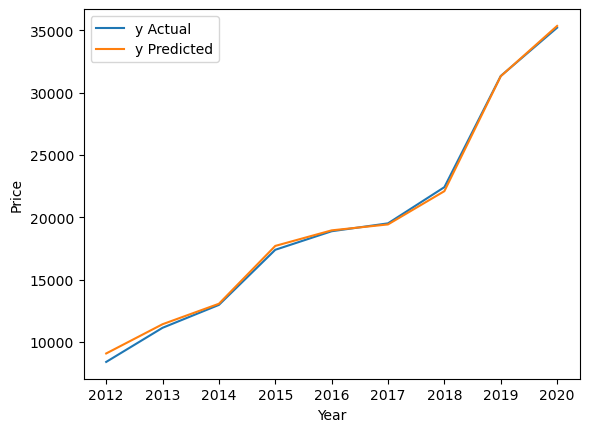

Manufacturer ford

X train: (8703, 26), X test: (3731, 26), y train: (8703,), y test: (3731,)

Error type: MAE. Value: 972.6705448192922
Error type: MAPE. Value: 0.07077663292547406
Error type: 1 - MAPE. Value: 0.9292233670745259
Error type: MSE. Value: 2176858.140812729
Error type: RMSE. Value: 1475.4179546192086
Error type: R2. Value: 0.8914893407107438




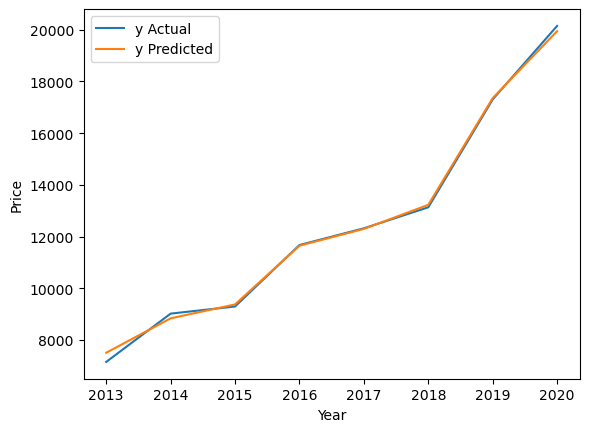

Manufacturer hyundi

X train: (2394, 22), X test: (1027, 22), y train: (2394,), y test: (1027,)

Error type: MAE. Value: 963.470323014505
Error type: MAPE. Value: 0.07015618004794544
Error type: 1 - MAPE. Value: 0.9298438199520546
Error type: MSE. Value: 2536942.9187431824
Error type: RMSE. Value: 1592.7783646016737
Error type: R2. Value: 0.9232842427967528




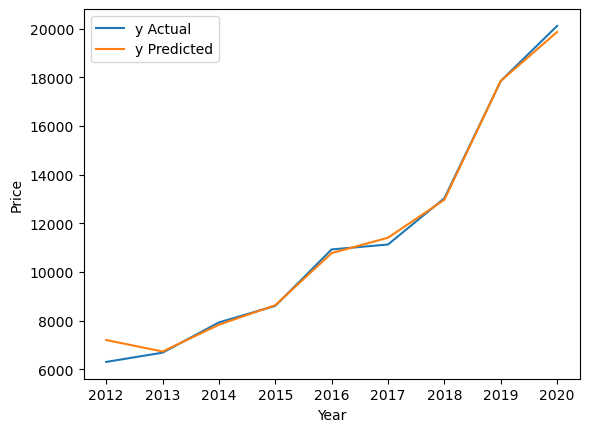

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer merc

X train: (6773, 30), X test: (2903, 30), y train: (6773,), y test: (2903,)

Error type: MAE. Value: 1756.865293716257
Error type: MAPE. Value: 0.0627233377706105
Error type: 1 - MAPE. Value: 0.9372766622293895
Error type: MSE. Value: 8777349.694676496
Error type: RMSE. Value: 2962.659226890007
Error type: R2. Value: 0.9385808661950198




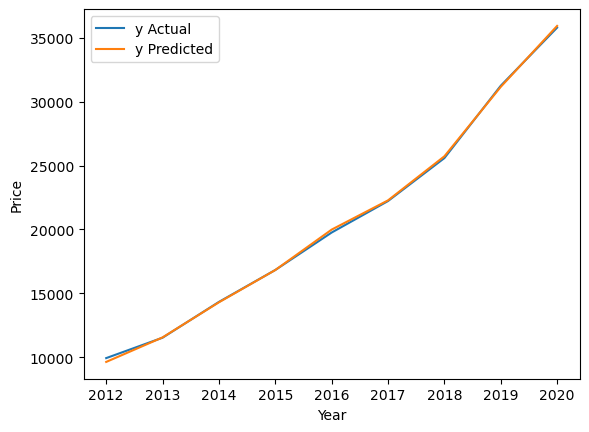

Manufacturer skoda

X train: (3285, 22), X test: (1409, 22), y train: (3285,), y test: (1409,)

Error type: MAE. Value: 1138.0419302837768
Error type: MAPE. Value: 0.07100774770535573
Error type: 1 - MAPE. Value: 0.9289922522946443
Error type: MSE. Value: 3625984.3729836
Error type: RMSE. Value: 1904.2017679289136
Error type: R2. Value: 0.9067351434428979




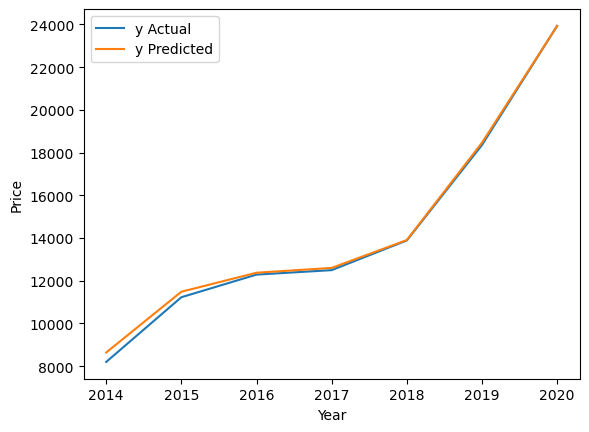

Manufacturer toyota

X train: (4451, 26), X test: (1908, 26), y train: (4451,), y test: (1908,)



C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Error type: MAE. Value: 763.4420908081262
Error type: MAPE. Value: 0.06156472089467897
Error type: 1 - MAPE. Value: 0.938435279105321
Error type: MSE. Value: 1208111.7313170393
Error type: RMSE. Value: 1099.141360934543
Error type: R2. Value: 0.9703252447105526




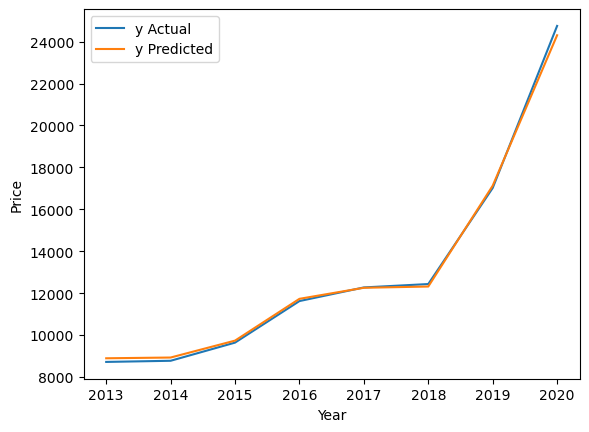

Manufacturer vauxhall

X train: (6826, 26), X test: (2926, 26), y train: (6826,), y test: (2926,)

Error type: MAE. Value: 819.8087331189154
Error type: MAPE. Value: 0.07084143597275432
Error type: 1 - MAPE. Value: 0.9291585640272457
Error type: MSE. Value: 1965512.7590695464
Error type: RMSE. Value: 1401.9674600608769
Error type: R2. Value: 0.838013373599834




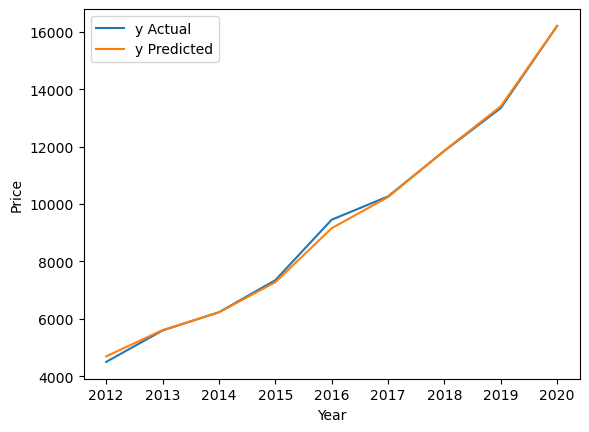

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer vw

X train: (10139, 34), X test: (4346, 34), y train: (10139,), y test: (4346,)

Error type: MAE. Value: 1090.3520503881327
Error type: MAPE. Value: 0.06441535668804521
Error type: 1 - MAPE. Value: 0.9355846433119548
Error type: MSE. Value: 2672646.707335761
Error type: RMSE. Value: 1634.8231425251358
Error type: R2. Value: 0.952607667845431




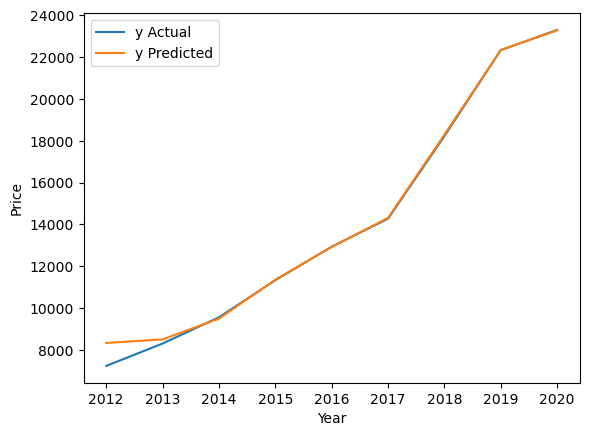

In [84]:
one_hot_encoded_dataframes_dict = {}
random_forest_models_dict = {}
predictions_dict = {}
errors_dict = {}
train_data_lengths = {}

for manufacturer in car_dataframes_dict.keys():
    
    if manufacturer == 'all':
        X = car_dataframes_dict[manufacturer].drop(['price'], axis=1)
    
    else:
        X = car_dataframes_dict[manufacturer].drop(['price', 'manufacturer'], axis=1)
    
    y = car_dataframes_dict[manufacturer]['price']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    X_train_scaled, X_test_scaled = scaling(X_train, X_test, scaler="std")
    
    X_train_encoded, X_test_encoded = one_hot_encoding_sklearn(X_train_scaled, X_test_scaled)
    
    one_hot_encoded_dataframes_dict[manufacturer] = {"X_train": X_train_encoded,
                                                     "X_test": X_test_encoded,
                                                     "y_train": y_train,
                                                     "y_test": y_test}
    
    print(f"Manufacturer {manufacturer}\n")
    print(f"X train: {X_train_encoded.shape}, X test: {X_test_encoded.shape}, y train: {y_train.shape}, y test: {y_test.shape}\n")

    random_forest_models_dict[manufacturer] = rf_model(one_hot_encoded_dataframes_dict[manufacturer]["X_train"], 
                                                                          one_hot_encoded_dataframes_dict[manufacturer]["y_train"])
    
    predictions_dict[manufacturer] = random_forest_models_dict[manufacturer].predict(one_hot_encoded_dataframes_dict[manufacturer]["X_test"]) 
    
    errors_dict[manufacturer] = errors(one_hot_encoded_dataframes_dict[manufacturer]["y_test"], predictions_dict[manufacturer])
    
    for error in errors_dict[manufacturer].keys():
        print(f"Error type: {error}. Value: {errors_dict[manufacturer][error]}")
    print("\n")
    
    train_data_lengths[manufacturer] = len(one_hot_encoded_dataframes_dict[manufacturer]["X_train"])
    
    
    sns.lineplot(y=y_test, x=X_test['year'], label="y Actual", errorbar=None)
    sns.lineplot(y=predictions_dict[manufacturer], x=X_test['year'], label="y Predicted", errorbar=None)
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.show()

# Neural Networks

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer all

X train: (47856, 178), X test: (20511, 178), y train: (47856,), y test: (20511,)



C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


Error type: MAE. Value: 1552.5371665713346
Error type: MAPE. Value: 0.08181841857748139
Error type: 1 - MAPE. Value: 0.9181815814225186
Error type: MSE. Value: 5941845.196718584
Error type: RMSE. Value: 2437.590038689563
Error type: R2. Value: 0.9345927736973092




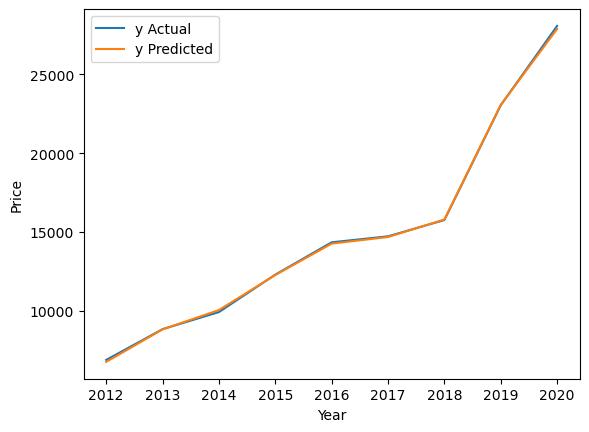

Manufacturer audi

X train: (4365, 20), X test: (1872, 20), y train: (4365,), y test: (1872,)

Error type: MAE. Value: 6329.560938405171
Error type: MAPE. Value: 0.3158642321203058
Error type: 1 - MAPE. Value: 0.6841357678796942
Error type: MSE. Value: 64115454.500337355
Error type: RMSE. Value: 8007.2126548716915
Error type: R2. Value: -0.31516967786098093




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


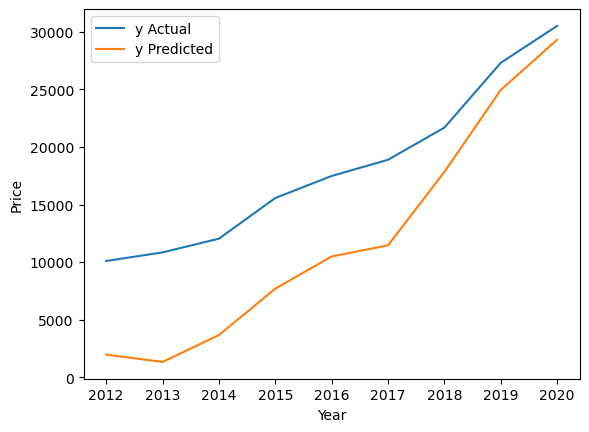

Manufacturer bmw

X train: (2863, 22), X test: (1228, 22), y train: (2863,), y test: (1228,)

Error type: MAE. Value: 13096.429681131789
Error type: MAPE. Value: 0.5517208785678034
Error type: 1 - MAPE. Value: 0.4482791214321966
Error type: MSE. Value: 196963786.41383752
Error type: RMSE. Value: 14034.378732734753
Error type: R2. Value: -3.811539324392074




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


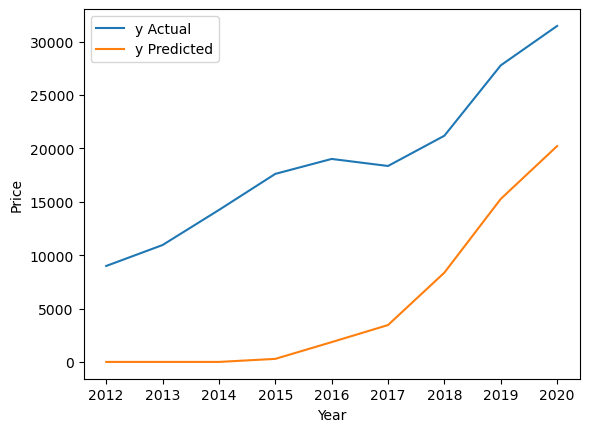

Manufacturer ford

X train: (8652, 26), X test: (3709, 26), y train: (8652,), y test: (3709,)

Error type: MAE. Value: 1342.9460644351154
Error type: MAPE. Value: 0.10322720260807271
Error type: 1 - MAPE. Value: 0.8967727973919273
Error type: MSE. Value: 3093654.537185146
Error type: RMSE. Value: 1758.878772737094
Error type: R2. Value: 0.8292519881589957




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


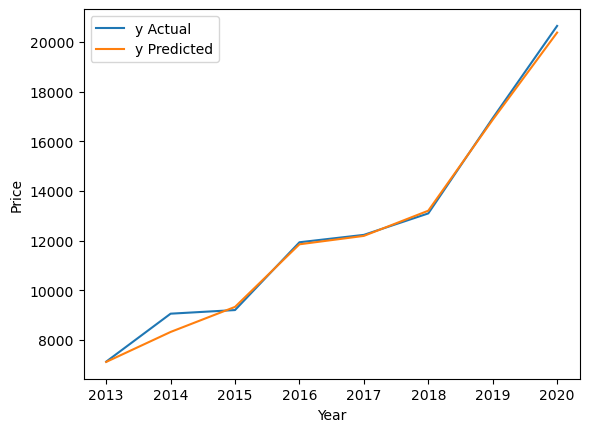

Manufacturer hyundi

X train: (2377, 22), X test: (1019, 22), y train: (2377,), y test: (1019,)

Error type: MAE. Value: 5030.071704961545
Error type: MAPE. Value: 0.37528343403695985
Error type: 1 - MAPE. Value: 0.6247165659630401
Error type: MSE. Value: 38881600.134267025
Error type: RMSE. Value: 6235.5112167541665
Error type: R2. Value: -0.0850068177271126




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


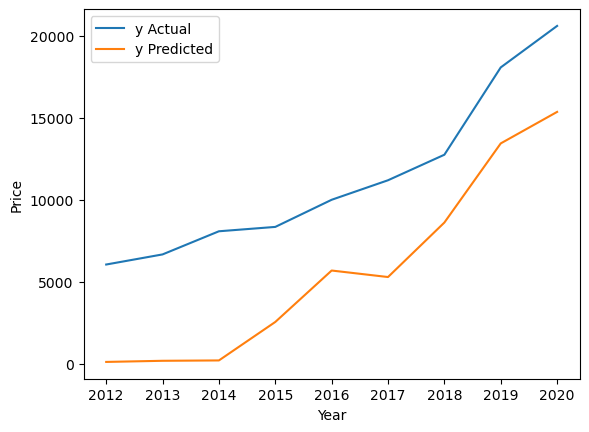

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer merc

X train: (5833, 26), X test: (2500, 26), y train: (5833,), y test: (2500,)

Error type: MAE. Value: 6191.549907728587
Error type: MAPE. Value: 0.2844626710820129
Error type: 1 - MAPE. Value: 0.7155373289179872
Error type: MSE. Value: 63983724.62874089
Error type: RMSE. Value: 7998.98272461823
Error type: R2. Value: -0.16495164326584222




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


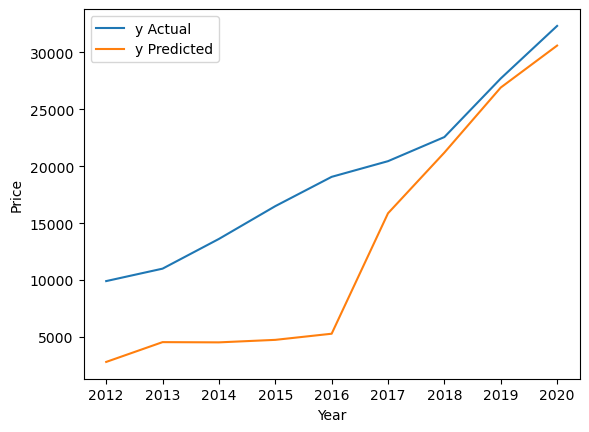

Manufacturer skoda

X train: (3285, 22), X test: (1409, 22), y train: (3285,), y test: (1409,)

Error type: MAE. Value: 4140.005977145184
Error type: MAPE. Value: 0.2718326972348446
Error type: 1 - MAPE. Value: 0.7281673027651554
Error type: MSE. Value: 31645881.072025113
Error type: RMSE. Value: 5625.467187001015
Error type: R2. Value: 0.1860283290804785




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


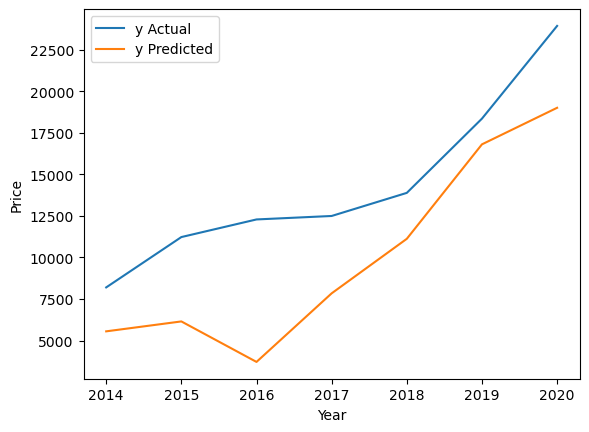

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer toyota

X train: (4451, 26), X test: (1908, 26), y train: (4451,), y test: (1908,)

Error type: MAE. Value: 1731.526413841851
Error type: MAPE. Value: 0.13600126249374034
Error type: 1 - MAPE. Value: 0.8639987375062597
Error type: MSE. Value: 6979026.687904599
Error type: RMSE. Value: 2641.784754272119
Error type: R2. Value: 0.8285747056720343




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


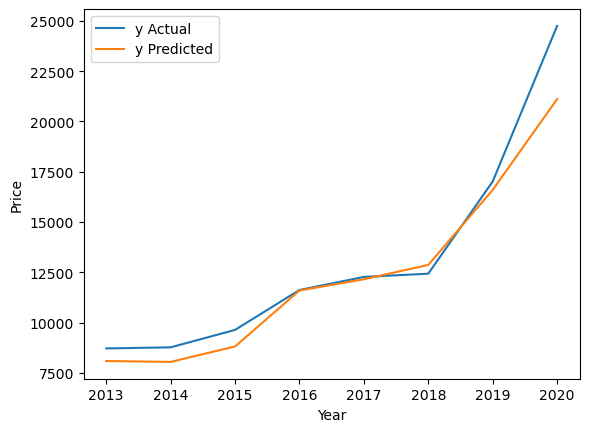

Manufacturer vauxhall

X train: (3885, 17), X test: (1666, 17), y train: (3885,), y test: (1666,)

Error type: MAE. Value: 1367.0183009548161
Error type: MAPE. Value: 0.1370932740275472
Error type: 1 - MAPE. Value: 0.8629067259724528
Error type: MSE. Value: 3254053.33686672
Error type: RMSE. Value: 1803.8994808100367
Error type: R2. Value: 0.46738680909523556




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


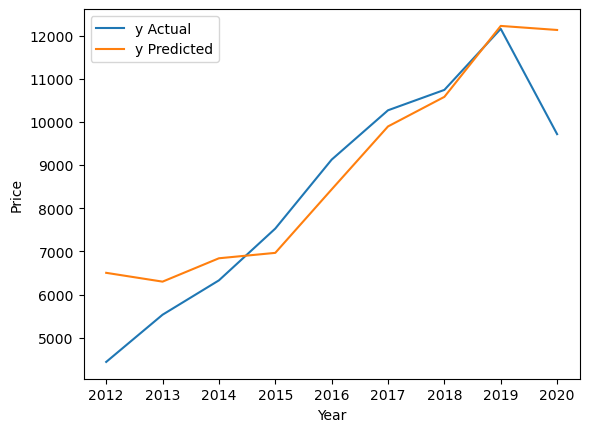

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer vw

X train: (10139, 34), X test: (4346, 34), y train: (10139,), y test: (4346,)

Error type: MAE. Value: 1691.6470351012645
Error type: MAPE. Value: 0.09883428023680785
Error type: 1 - MAPE. Value: 0.9011657197631922
Error type: MSE. Value: 5990745.5519511085
Error type: RMSE. Value: 2447.599957499409
Error type: R2. Value: 0.8937699463710279




C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


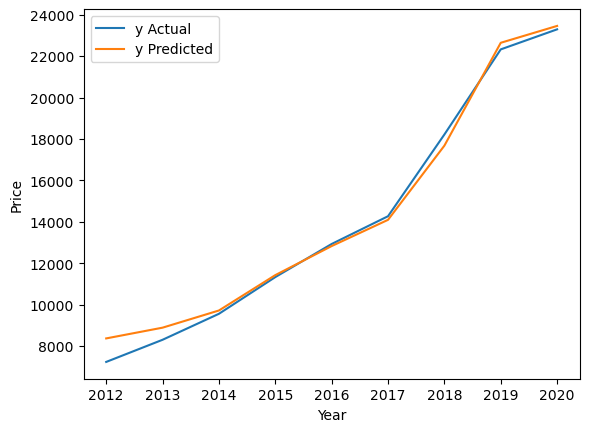

In [49]:
one_hot_encoded_dataframes_dict = {}
neural_network_models_dict = {}
predictions_dict = {}
errors_dict = {}
train_data_lengths = {}

for manufacturer in car_dataframes_dict.keys():
    
    if manufacturer == 'all':
        X = car_dataframes_dict[manufacturer].drop(['price'], axis=1)
    
    else:
        X = car_dataframes_dict[manufacturer].drop(['price', 'manufacturer'], axis=1)
    
    y = car_dataframes_dict[manufacturer]['price']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    X_train_scaled, X_test_scaled = scaling(X_train, X_test, scaler="std")
    
    X_train_encoded, X_test_encoded = one_hot_encoding_sklearn(X_train_scaled, X_test_scaled)
    
    one_hot_encoded_dataframes_dict[manufacturer] = {"X_train": X_train_encoded,
                                                     "X_test": X_test_encoded,
                                                     "y_train": y_train,
                                                     "y_test": y_test}
    
    print(f"Manufacturer {manufacturer}\n")
    print(f"X train: {X_train_encoded.shape}, X test: {X_test_encoded.shape}, y train: {y_train.shape}, y test: {y_test.shape}\n")
    
    neural_network_models_dict[manufacturer] = nn_model(one_hot_encoded_dataframes_dict[manufacturer]["X_train"], 
                                                                          one_hot_encoded_dataframes_dict[manufacturer]["y_train"])
    
    predictions_dict[manufacturer] = neural_network_models_dict[manufacturer].predict(one_hot_encoded_dataframes_dict[manufacturer]["X_test"]) 
    
    errors_dict[manufacturer] = errors(one_hot_encoded_dataframes_dict[manufacturer]["y_test"], predictions_dict[manufacturer])
    
    for error in errors_dict[manufacturer].keys():
        print(f"Error type: {error}. Value: {errors_dict[manufacturer][error]}")
    print("\n")
    
    train_data_lengths[manufacturer] = len(one_hot_encoded_dataframes_dict[manufacturer]["X_train"])
    
    
    sns.lineplot(y=y_test, x=X_test['year'], label="y Actual", errorbar=None)
    sns.lineplot(y=predictions_dict[manufacturer], x=X_test['year'], label="y Predicted", errorbar=None)
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.show()

# SVR

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer all

X train: (47856, 178), X test: (20511, 178), y train: (47856,), y test: (20511,)

Error type: MAE. Value: 5320.058901877141
Error type: MAPE. Value: 0.3070103982085819
Error type: 1 - MAPE. Value: 0.6929896017914181
Error type: MSE. Value: 64122173.665244065
Error type: RMSE. Value: 8007.632213410158
Error type: R2. Value: 0.2941496479478719




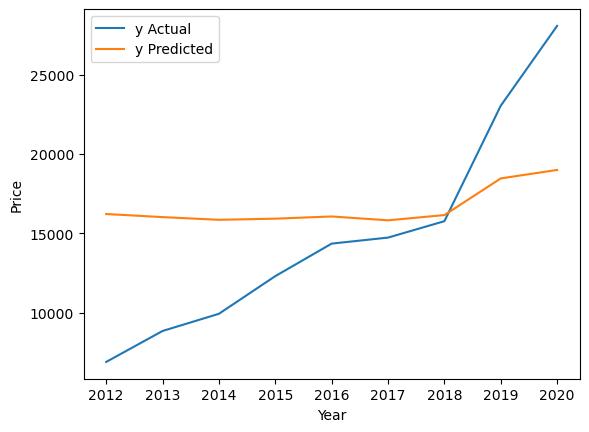

Manufacturer audi

X train: (4365, 20), X test: (1872, 20), y train: (4365,), y test: (1872,)

Error type: MAE. Value: 5341.048788254637
Error type: MAPE. Value: 0.2535465006565885
Error type: 1 - MAPE. Value: 0.7464534993434115
Error type: MSE. Value: 45056448.217457324
Error type: RMSE. Value: 6712.410015594795
Error type: R2. Value: 0.07577860986072371




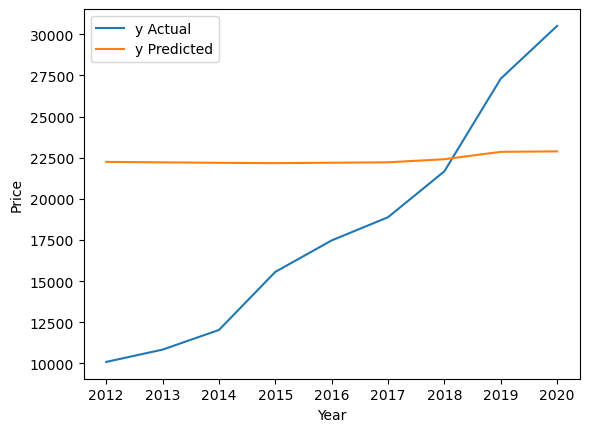

Manufacturer bmw

X train: (2863, 22), X test: (1228, 22), y train: (2863,), y test: (1228,)

Error type: MAE. Value: 5066.678819499397
Error type: MAPE. Value: 0.2262522942200608
Error type: 1 - MAPE. Value: 0.7737477057799392
Error type: MSE. Value: 39131101.88877825
Error type: RMSE. Value: 6255.485743631604
Error type: R2. Value: 0.04408399649133676




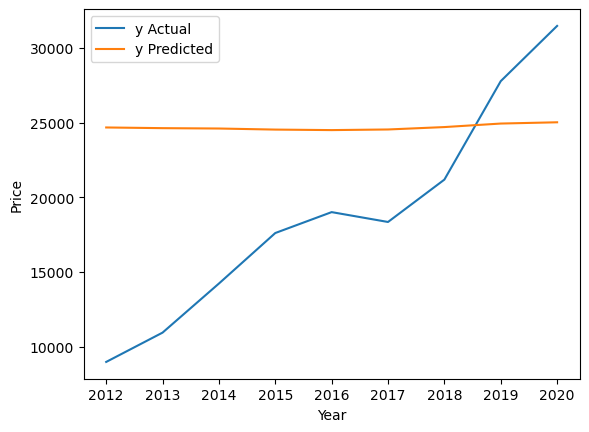

Manufacturer ford

X train: (8652, 26), X test: (3709, 26), y train: (8652,), y test: (3709,)

Error type: MAE. Value: 3071.3284571342315
Error type: MAPE. Value: 0.23385296760769814
Error type: 1 - MAPE. Value: 0.7661470323923019
Error type: MSE. Value: 15838132.210510978
Error type: RMSE. Value: 3979.715091625402
Error type: R2. Value: 0.1258462915900317




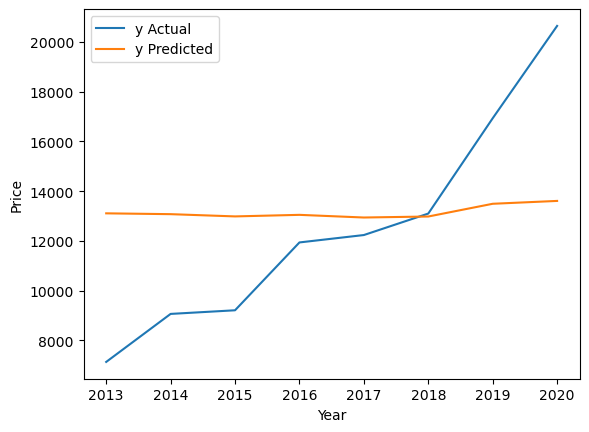

Manufacturer hyundi

X train: (2377, 22), X test: (1019, 22), y train: (2377,), y test: (1019,)

Error type: MAE. Value: 4486.741407653277
Error type: MAPE. Value: 0.36165984034917903
Error type: 1 - MAPE. Value: 0.6383401596508209
Error type: MSE. Value: 34305781.388572685
Error type: RMSE. Value: 5857.11374215771
Error type: R2. Value: 0.0426832598061504




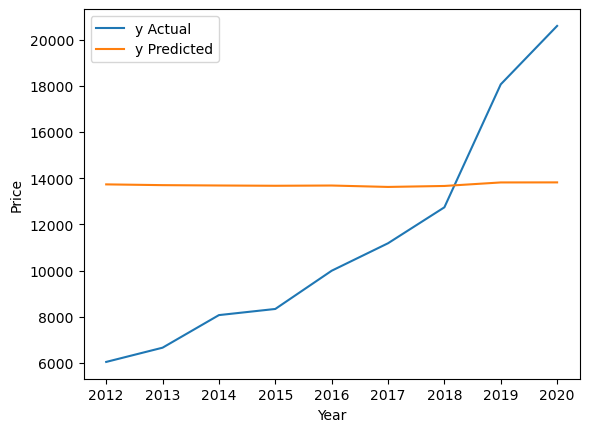

Manufacturer merc

X train: (5833, 26), X test: (2500, 26), y train: (5833,), y test: (2500,)



C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Error type: MAE. Value: 5371.849199724811
Error type: MAPE. Value: 0.23564714007243384
Error type: 1 - MAPE. Value: 0.7643528599275662
Error type: MSE. Value: 51768723.920301236
Error type: RMSE. Value: 7195.048569697166
Error type: R2. Value: 0.0574468687050953




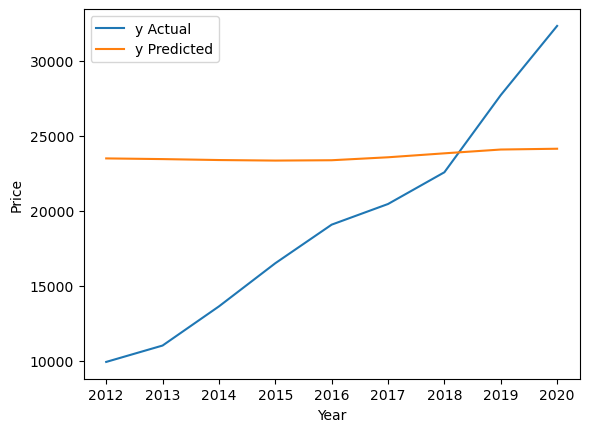

Manufacturer skoda

X train: (3285, 22), X test: (1409, 22), y train: (3285,), y test: (1409,)

Error type: MAE. Value: 4673.2342042152295
Error type: MAPE. Value: 0.30630549133764506
Error type: 1 - MAPE. Value: 0.6936945086623549
Error type: MSE. Value: 37519031.3847726
Error type: RMSE. Value: 6125.278065914445
Error type: R2. Value: 0.034963551874619525




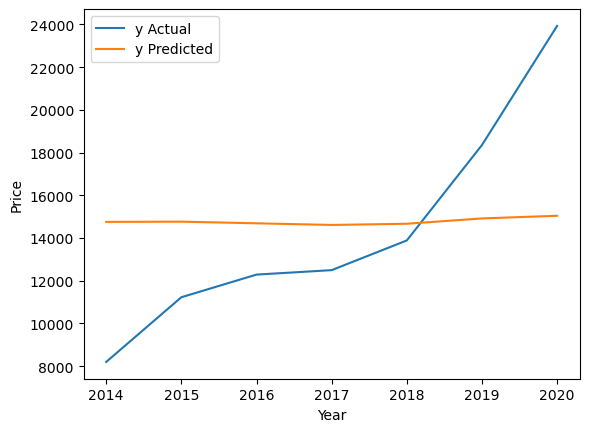

Manufacturer toyota

X train: (4451, 26), X test: (1908, 26), y train: (4451,), y test: (1908,)



C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Error type: MAE. Value: 4220.852988136682
Error type: MAPE. Value: 0.3058455712308079
Error type: 1 - MAPE. Value: 0.6941544287691921
Error type: MSE. Value: 41559021.742378265
Error type: RMSE. Value: 6446.62871137917
Error type: R2. Value: -0.02081104611859952




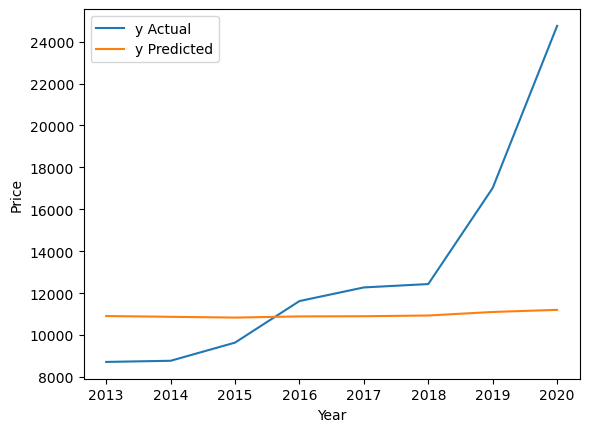

Manufacturer vauxhall

X train: (3885, 17), X test: (1666, 17), y train: (3885,), y test: (1666,)

Error type: MAE. Value: 1820.2068035571695
Error type: MAPE. Value: 0.19318451205880954
Error type: 1 - MAPE. Value: 0.8068154879411904
Error type: MSE. Value: 5199761.708226155
Error type: RMSE. Value: 2280.2986006718843
Error type: R2. Value: 0.14891939723722702




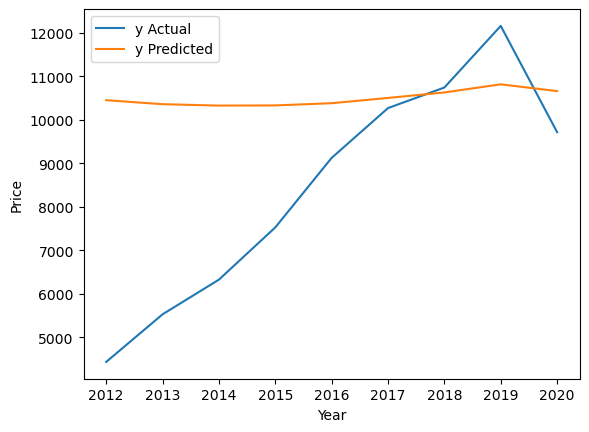

C:\Users\Hassaan\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:227: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Manufacturer vw

X train: (10139, 34), X test: (4346, 34), y train: (10139,), y test: (4346,)

Error type: MAE. Value: 5087.300105999822
Error type: MAPE. Value: 0.33284554532027316
Error type: 1 - MAPE. Value: 0.6671544546797268
Error type: MSE. Value: 46637238.48570106
Error type: RMSE. Value: 6829.146248668355
Error type: R2. Value: 0.1730117224174813




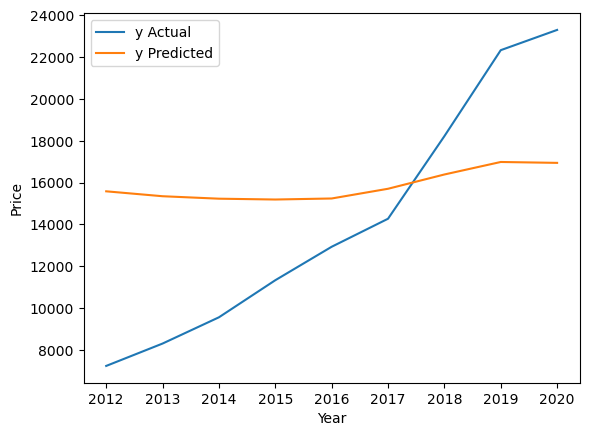

In [50]:
one_hot_encoded_dataframes_dict = {}
svr_models_dict = {}
predictions_dict = {}
errors_dict = {}
train_data_lengths = {}

for manufacturer in car_dataframes_dict.keys():
    
    if manufacturer == 'all':
        X = car_dataframes_dict[manufacturer].drop(['price'], axis=1)
    
    else:
        X = car_dataframes_dict[manufacturer].drop(['price', 'manufacturer'], axis=1)
    
    y = car_dataframes_dict[manufacturer]['price']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    X_train_scaled, X_test_scaled = scaling(X_train, X_test, scaler="std")
    
    X_train_encoded, X_test_encoded = one_hot_encoding_sklearn(X_train_scaled, X_test_scaled)
    
    one_hot_encoded_dataframes_dict[manufacturer] = {"X_train": X_train_encoded,
                                                     "X_test": X_test_encoded,
                                                     "y_train": y_train,
                                                     "y_test": y_test}
    
    print(f"Manufacturer {manufacturer}\n")
    print(f"X train: {X_train_encoded.shape}, X test: {X_test_encoded.shape}, y train: {y_train.shape}, y test: {y_test.shape}\n")

    svr_models_dict[manufacturer] = svr_model(one_hot_encoded_dataframes_dict[manufacturer]["X_train"], 
                                                                          one_hot_encoded_dataframes_dict[manufacturer]["y_train"])
    
    predictions_dict[manufacturer] = svr_models_dict[manufacturer].predict(one_hot_encoded_dataframes_dict[manufacturer]["X_test"]) 
    
    errors_dict[manufacturer] = errors(one_hot_encoded_dataframes_dict[manufacturer]["y_test"], predictions_dict[manufacturer])
    
    for error in errors_dict[manufacturer].keys():
        print(f"Error type: {error}. Value: {errors_dict[manufacturer][error]}")
    print("\n")
    
    train_data_lengths[manufacturer] = len(one_hot_encoded_dataframes_dict[manufacturer]["X_train"])
    
    
    sns.lineplot(y=y_test, x=X_test['year'], label="y Actual", errorbar=None)
    sns.lineplot(y=predictions_dict[manufacturer], x=X_test['year'], label="y Predicted", errorbar=None)
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.show()

# Errors Explained 

### Mean Absolute Error (MAE): 
This is the average of the absolute differences between the predicted and actual values. It gives an idea of how wrong the predictions were. The measure gives an idea of the magnitude of the error, but no idea of the direction (over or under predicting). In our case, the MAE is 2411.84.

### Mean Absolute Percentage Error (MAPE): 
This is the mean of the absolute percentage differences between the predicted and actual values. It gives an idea of the error in terms of the percentage of the actual values. In our case, the MAPE is 0.107, or 10.7%, which means that the average error of the model’s predictions is 10.7% off from the actual value.

### Mean Squared Error (MSE): 
This is the average of the squared differences between the predicted and actual values. Squaring the difference amplifies the impact of large errors. In our case, the MSE is 9516204.79.

### Root Mean Squared Error (RMSE): 
This is the square root of the MSE. Taking the square root brings the error metric back to the same unit as the target variable, making it easier to interpret. In our case, the RMSE is 3084.83.

### R-squared (R2): 
This is a statistical measure that represents the proportion of the variance for a dependent variable that’s explained by an independent variable or variables in a regression model. It provides a measure of how well the model’s predictions match the actual values. An R2 of 100% indicates that all changes in the dependent variable are completely explained by changes in the independent variable(s). In our case, the R2 is 0.805, or 80.5%, which means that 80.5% of the variance in your target variable can be explained by your features.